In [ ]:
# def add_indicators(dataframe: DataFrame) -> DataFrame:
import h2o
import pandas as pd
from h2o.automl import H2OAutoML
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import StandardScaler
from pandas import DataFrame
from typing import Dict, List
import talib.abstract as ta
import qtpylib.indicators as qtpylib
import ta as t
from technical.consensus import Consensus
from scipy.signal import argrelextrema
from technical.indicators.indicators import vfi
from technical.indicators.volatility import chopiness
from technical.indicators.volume_indicators import chaikin_money_flow
from technical.indicators.overlap_studies import vwma
from technical.indicators.volatility import atr

def rolling_fft(df, columns, window_size, n_components):
    """
    Apply FFT on a rolling window for multiple columns and return top N frequency magnitudes.
    
    Parameters:
    df (pd.DataFrame): DataFrame containing the time series data.
    columns (list): List of column names to apply FFT.
    window_size (int): Size of the rolling window.
    n_components (int): Number of top frequency components to keep.

    Returns:
    pd.DataFrame: DataFrame with new FFT features.
    """
    for col in columns:
        # Create FFT features for each window
        fft_features = []
        for start in range(len(df) - window_size + 1):
            segment = df[col].iloc[start:start+window_size]
            fft_result = np.fft.fft(segment)
            magnitudes = np.abs(fft_result)[:n_components]
            fft_features.append(magnitudes)

        # Convert the list of FFT features to a DataFrame
        fft_df = pd.DataFrame(fft_features, columns=[f'fft_{col}_{i}' for i in range(n_components)])
        fft_df.index = df.index[window_size - 1:]

        # Concatenate the new columns to the original DataFrame
        df = pd.concat([df, fft_df], axis=1)

    return df

# dataframe = pd.read_feather("/Users/dad/Desktop/Freqtrade/user_data/data/kraken/BTC_USDT-1h.feather")
def add_indicators(dataframe: DataFrame) -> DataFrame:
    periods = [3, 5, 7, 9, 10, 12, 14, 15, 20, 50, 100, 200, 500, 1000, 2000]
    for period in periods:
        dataframe[f"%-rsi-period_{period}"] = ta.RSI(dataframe, timeperiod=period)
        dataframe[f"%-mfi-period_{period}"] = ta.MFI(dataframe, timeperiod=period)
        dataframe[f"%-adx-period_{period}"] = ta.ADX(dataframe, timeperiod=period)
        dataframe[f"%-sma-period_{period}"] = ta.SMA(dataframe, timeperiod=period)
        dataframe[f"%-ema-period_{period}"] = ta.EMA(dataframe, timeperiod=period)
        dataframe[f"%-cci-period_{period}"] = ta.CCI(dataframe, timeperiod=period)
        dataframe[f"%-sar-period_{period}"] = ta.SAR(dataframe, timeperiod=period)
        dataframe[f"%-tema-period_{period}"] = ta.TEMA(dataframe, timeperiod=period)

        # oscillator indicators for short term
        dataframe[f"%-stoch-k-period_{period}"] = ta.STOCH(dataframe, fastk_period=period)[
            "slowk"
        ]
        dataframe[f"%-stoch-d-period_{period}"] = ta.STOCH(dataframe, fastk_period=period)[
            "slowd"
        ]
        dataframe[f"%-stoch-rsi-k-period_{period}"] = ta.STOCHRSI(dataframe, timeperiod=period)[
            "fastk"
        ]


        dataframe[f"%-chopiness-period_{period}"] = chopiness(dataframe, period=period)
        dataframe[f"%-chaikin-money-flow-period_{period}"] = chaikin_money_flow(dataframe, period=period)
        dataframe[f"%-vwma-period_{period}"] = vwma(dataframe, window=period)

        bollinger = qtpylib.bollinger_bands(
            qtpylib.typical_price(dataframe), window=period, stds=2.2
        )
        dataframe[f"bb_lowerband-period_{period}"] = bollinger["lower"]
        dataframe[f"bb_middleband-period_{period}"] = bollinger["mid"]
        dataframe[f"bb_upperband-period_{period}"] = bollinger["upper"]

        dataframe[f"%-bb_width-period_{period}"] = (
            dataframe[f"bb_upperband-period_{period}"]
            - dataframe[f"bb_lowerband-period_{period}"]
        ) / dataframe[f"bb_middleband-period_{period}"]
        dataframe[f"%-close-bb_lower-period_{period}"] = (
            dataframe["close"] / dataframe[f"bb_lowerband-period_{period}"]
        )

        dataframe[f"%-roc-period_{period}"] = ta.ROC(dataframe, timeperiod=period)

        dataframe[f"%-relative_volume-period_{period}"] = (
            dataframe["volume"] / dataframe["volume"].rolling(period).mean()
        )
    
    dataframe['%-vfi'], dataframe['%-vfima'], dataframe['%-vfi_hist'] =  vfi(dataframe, 
                                                                            length=130, 
                                                                            coef=0.2, 
                                                                            vcoef=2.5,
                                                                            signalLength=5, 
                                                                            smoothVFI=False
                                                                            )
    
    dataframe["%-pct-change"] = dataframe["close"].pct_change()
    dataframe["%-raw_volume"] = dataframe["volume"]
    dataframe["%-raw_price"] = dataframe["close"]

    dataframe["%-ultimate-oscillator"] = t.momentum.UltimateOscillator(dataframe['high'], dataframe['low'], dataframe['close'], 7, 14, 28, 4.0, 2.0, 1.0).ultimate_oscillator()
    # Plus Directional Indicator / Movement
    dataframe['%-plus_dm'] = ta.PLUS_DM(dataframe)
    dataframe['%-plus_di'] = ta.PLUS_DI(dataframe)

    # Minus Directional Indicator / Movement
    dataframe['%-minus_dm'] = ta.MINUS_DM(dataframe)
    dataframe['%-minus_di'] = ta.MINUS_DI(dataframe)

    # Aroon, Aroon Oscillator
    aroon = ta.AROON(dataframe)
    dataframe['%-aroonup'] = aroon['aroonup']
    dataframe['%-aroondown'] = aroon['aroondown']
    dataframe['%-aroonosc'] = ta.AROONOSC(dataframe)

    # Awesome Oscillator
    dataframe['%-ao'] = qtpylib.awesome_oscillator(dataframe)

    # Keltner Channel
    keltner = qtpylib.keltner_channel(dataframe)
    dataframe["kc_upperband"] = keltner["upper"]
    dataframe["kc_lowerband"] = keltner["lower"]
    dataframe["kc_middleband"] = keltner["mid"]
    dataframe["%-kc_percent"] = (
        (dataframe["close"] - dataframe["kc_lowerband"]) /
        (dataframe["kc_upperband"] - dataframe["kc_lowerband"])
    )
    dataframe["%-kc_width"] = (
        (dataframe["kc_upperband"] - dataframe["kc_lowerband"]) / dataframe["kc_middleband"]
    )
        
    dataframe['%-ichimoku_a'] = t.trend.IchimokuIndicator(dataframe['high'], dataframe['low']).ichimoku_a()
    dataframe['%-ichimoku_b'] = t.trend.IchimokuIndicator(dataframe['high'], dataframe['low']).ichimoku_b()

    # Pivot Points for short-term
    pivot = (dataframe['high'] + dataframe['low'] + dataframe['close']) / 3
    dataframe['%-pivot_point_st'] = pivot
    dataframe['%-pivot_r1_st'] = (2 * pivot) - dataframe['low']
    dataframe['%-pivot_r2_st'] = pivot + (dataframe['high'] - dataframe['low'])
    dataframe['%-pivot_s1_st'] = (2 * pivot) - dataframe['high']
    dataframe['%-pivot_s2_st'] = pivot - (dataframe['high'] - dataframe['low'])
        
    high_max = dataframe['high'].rolling(288).max()
    low_min = dataframe['low'].rolling(288).min()
    diff = high_max - low_min
    dataframe['%-fib_0'] = low_min
    dataframe['%-fib_0.236'] = low_min + 0.236 * diff
    dataframe['%-fib_0.382'] = low_min + 0.382 * diff
    dataframe['%-fib_0.5'] = low_min + 0.5 * diff
    dataframe['%-fib_0.618'] = low_min + 0.618 * diff
    dataframe['%-fib_0.786'] = low_min + 0.786 * diff
    dataframe['%-fib_1'] = high_max
        
    heikinashi = qtpylib.heikinashi(dataframe)
    dataframe['%-ha_open'] = heikinashi['open']
    dataframe['%-ha_close'] = heikinashi['close']
    dataframe['%-ha_high'] = heikinashi['high']
    dataframe['%-ha_low'] = heikinashi['low']

    dataframe[["%-macd", "%-macdsignal", "%-macdhist"]] = ta.MACD(dataframe, fastperiod=12, slowperiod=26, signalperiod=9)
    # dataframe["%-day_of_week"] = dataframe["date"].dt.dayofweek
    # dataframe["%-hour_of_day"] = dataframe["date"].dt.hour


    dataframe['%-obv'] = ta.OBV(dataframe)
    # dataframe['%-vroc'] = ta.VROC(dataframe)
    dataframe['%-atr'] = atr(dataframe)

    # Cycle Indicator
    # ------------------------------------
    # Hilbert Transform Indicator - SineWave
    hilbert = ta.HT_SINE(dataframe)
    dataframe['%-htsine'] = hilbert['sine']
    dataframe['%-htleadsine'] = hilbert['leadsine']

    # Pattern Recognition - Bullish candlestick patterns
    # ------------------------------------
    # Hammer: values [0, 100]
    dataframe['%-CDLHAMMER'] = ta.CDLHAMMER(dataframe)
    # Inverted Hammer: values [0, 100]
    dataframe['%-CDLINVERTEDHAMMER'] = ta.CDLINVERTEDHAMMER(dataframe)
    # Dragonfly Doji: values [0, 100]
    dataframe['%-CDLDRAGONFLYDOJI'] = ta.CDLDRAGONFLYDOJI(dataframe)
    # Piercing Line: values [0, 100]
    dataframe['%-CDLPIERCING'] = ta.CDLPIERCING(dataframe) # values [0, 100]
    # Morningstar: values [0, 100]
    dataframe['%-CDLMORNINGSTAR'] = ta.CDLMORNINGSTAR(dataframe) # values [0, 100]
    # Three White Soldiers: values [0, 100]
    dataframe['%-CDL3WHITESOLDIERS'] = ta.CDL3WHITESOLDIERS(dataframe) # values [0, 100]

    # Pattern Recognition - Bearish candlestick patterns
    # ------------------------------------
    # Hanging Man: values [0, 100]
    dataframe['%-CDLHANGINGMAN'] = ta.CDLHANGINGMAN(dataframe)
    # Shooting Star: values [0, 100]
    dataframe['%-CDLSHOOTINGSTAR'] = ta.CDLSHOOTINGSTAR(dataframe)
    # Gravestone Doji: values [0, 100]
    dataframe['%-CDLGRAVESTONEDOJI'] = ta.CDLGRAVESTONEDOJI(dataframe)
    # Dark Cloud Cover: values [0, 100]
    dataframe['%-CDLDARKCLOUDCOVER'] = ta.CDLDARKCLOUDCOVER(dataframe)
    # Evening Doji Star: values [0, 100]
    dataframe['%-CDLEVENINGDOJISTAR'] = ta.CDLEVENINGDOJISTAR(dataframe)
    # Evening Star: values [0, 100]
    dataframe['%-CDLEVENINGSTAR'] = ta.CDLEVENINGSTAR(dataframe)

    # Pattern Recognition - Bullish/Bearish candlestick patterns
    # ------------------------------------
    # Three Line Strike: values [0, -100, 100]
    dataframe['%-CDL3LINESTRIKE'] = ta.CDL3LINESTRIKE(dataframe)
    # Spinning Top: values [0, -100, 100]
    dataframe['%-CDLSPINNINGTOP'] = ta.CDLSPINNINGTOP(dataframe) # values [0, -100, 100]
    # Engulfing: values [0, -100, 100]
    dataframe['%-CDLENGULFING'] = ta.CDLENGULFING(dataframe) # values [0, -100, 100]
    # Harami: values [0, -100, 100]
    dataframe['%-CDLHARAMI'] = ta.CDLHARAMI(dataframe) # values [0, -100, 100]
    # Three Outside Up/Down: values [0, -100, 100]
    dataframe['%-CDL3OUTSIDE'] = ta.CDL3OUTSIDE(dataframe) # values [0, -100, 100]
    # Three Inside Up/Down: values [0, -100, 100]
    dataframe['%-CDL3INSIDE'] = ta.CDL3INSIDE(dataframe) # values [0, -100, 100]
    dataframe['SMA-5'] = ta.SMA(dataframe, timeperiod=5)
    dataframe = dataframe.copy()

    return dataframe

/Users/dad/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:34: NotOpenSSLWarning: urllib3 v2.0 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [ ]:
from scipy import stats
import numpy as np
import pandas as pd

def apply_gaussian_filter(df, kernel_size, sigma):
    """
    Apply a Gaussian filter to the 'close' column of a DataFrame, with edge approximation.

    Parameters:
    df (pd.DataFrame): DataFrame with a 'close' column.
    kernel_size (int): Size of the Gaussian kernel (must be an odd integer).
    sigma (float): Standard deviation of the Gaussian kernel.

    Returns:
    pd.Series: Series of the smoothed 'close' values.
    """
    if 'close' not in df.columns:
        raise ValueError("DataFrame must contain a 'close' column")

    if kernel_size % 2 == 0:
        raise ValueError("Kernel size must be an odd integer")

    # Generate Gaussian kernel
    kernel = stats.norm.pdf(np.linspace(-3*sigma, 3*sigma, kernel_size), 0, sigma)
    kernel /= np.sum(kernel)  # Normalize the kernel

    # Padding the edges
    half_size = kernel_size // 2
    extended_close = np.pad(df['close'], (half_size, half_size), 'edge')

    # Apply convolution
    smoothed = np.convolve(extended_close, kernel, mode='valid')

    return pd.Series(smoothed, index=df.index)

In [ ]:
def populate_features(df, order):
    
    df = df[df.columns.drop(list(df.filter(regex='^&')))]

    df['&s-up_or_down_2h'] = np.where(df["close"].shift(-2) > (1+0.015)*df["close"], 'up', 'down')

    df['&s-up_or_down_4h'] = np.where(df["close"].shift(-4) > (1+0.015)*df["close"], 'up', 'down')

    df['&s-up_or_down_8h'] = np.where(df["close"].shift(-8) > (1+0.015)*df["close"], 'up', 'down')

    df['&s-gradient'] = np.gradient(df['close'].rolling(window=order, center=True).mean())
    # Find local maxima and minima indices
    gauss_close = apply_gaussian_filter(df, kernel_size=order, sigma=order/6)
    maxima_indices = argrelextrema(gauss_close.values, np.greater, order=order)[0]
    minima_indices = argrelextrema(gauss_close.values, np.less, order=order)[0]

    # Initialize the "&-target" column with 'hold'
    df['&s-extrema'] = 'hold'

    # Update the "&-target" column
    df.loc[df.index.isin(maxima_indices), '&s-extrema'] = 'sell'
    df.loc[df.index.isin(minima_indices), '&s-extrema'] = 'buy'

    # Create a series with the same index as df where all values are 'hold'
    extrema2 = pd.Series('hold', index=df.index)

    # Set 'buy' at relative minima and 'sell' at relative maxima
    extrema2.loc[extrema2.index.isin(minima_indices)] = 'buy'
    extrema2.loc[extrema2.index.isin(maxima_indices)] = 'sell'

    # Create boolean arrays for 'increasing' and 'decreasing'
    increasing = (extrema2 == 'buy') | (extrema2.shift() == 'buy') & (extrema2.shift(-1) != 'sell')
    decreasing = (extrema2 == 'sell') | (extrema2.shift() == 'sell') & (extrema2.shift(-1) != 'buy')

    # Set 'increasing' and 'decreasing' using np.where
    extrema2 = np.where(increasing, 'increasing', extrema2)
    extrema2 = np.where(decreasing, 'decreasing', extrema2)

    # Assign the new series to the df
    df['&s-extrema5class'] = extrema2

    padding_size = int(order / 2)
    extrema_indices = df.index[df['&s-extrema'].isin(['buy', 'sell'])].tolist()
    for idx in extrema_indices:
        start_idx = max(0, idx - padding_size)
        end_idx = min(len(df) - 1, idx + padding_size)
        df.loc[start_idx:end_idx, '&s-extrema'] = df.loc[idx, '&s-extrema']

    df.dropna(inplace=True)
    print(df.shape)

    df = df.drop_duplicates(subset='date')
    print(df.shape)
    X = df.filter(regex='^[%]')
    og_feature_names = X.columns.tolist()
    y = df.filter(regex='^[&]')
    og_label_name = y.columns.tolist()

    def clean_column_names(df):
        df.columns = df.columns.str.replace('&-', '', regex=False)
        df.columns = df.columns.str.replace('&s-', '', regex=False)
        df.columns = df.columns.str.replace('%-', '', regex=False)
        return df

    # Clean the DataFrame column names
    X = clean_column_names(X)
    feature_names = X.columns.tolist()
    y = clean_column_names(y)
    label_names = y.columns.tolist()

    two_hour_trend = pd.DataFrame({'up_or_down_2h': y['up_or_down_2h']}).astype('category')
    four_hour_trend = pd.DataFrame({'up_or_down_4h': y['up_or_down_4h']}).astype('category')
    eight_hour_trend = pd.DataFrame({'up_or_down_8h': y['up_or_down_8h']}).astype('category')
    extrema_trend = pd.DataFrame({'extrema': y['extrema']}).astype('category')
    gradient_regression = pd.DataFrame({'gradient': y['gradient']}).astype('float64')

    buy_trend = pd.DataFrame({'buy': np.where(extrema_trend['extrema'] == 'buy', 'buy', 'hold')}).astype('category')
    sell_trend = pd.DataFrame({'sell': np.where(extrema_trend['extrema'] == 'sell', 'sell', 'hold')}).astype('category')
    buy_trend.columns = ['extrema']
    sell_trend.columns = ['extrema']
    gradient_regression.columns = ['gradient']
    five_class_extrema = pd.DataFrame({'extrema5class': y['extrema5class']}).astype('category')

    return X, two_hour_trend, four_hour_trend, eight_hour_trend, extrema_trend, buy_trend, sell_trend, gradient_regression, five_class_extrema, df

In [ ]:
# Custom Pipeline Transforms

from scipy.stats import norm
import numpy as np
from sklearn.base import BaseEstimator, TransformerMixin

class OneSidedGaussianSmoothing(BaseEstimator, TransformerMixin):
    """
    One-sided Gaussian smoothing transformer.

    This transformer applies one-sided Gaussian smoothing to each feature in the input data.

    Parameters:
    - window_size (int): The size of the one-sided Gaussian window.

    Methods:
    - fit(X, y=None): Fit the transformer to the data.
    - transform(X, y=None): Apply the one-sided Gaussian smoothing to the data.

    Example usage:
    ```
    transformer = OneSidedGaussianSmoothing(window_size=5)
    X_smooth = transformer.fit_transform(X)
    ```

    """

    def __init__(self, window_size=5):
        self.window_size = window_size

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        """
        Apply the one-sided Gaussian smoothing to the data.

        Parameters:
        - X (array-like): The input data.
        - y (array-like, optional): The target values.

        Returns:
        - X_smooth (array-like): The smoothed data.

        """
        # Create a one-sided Gaussian window
        window = norm(loc=0, scale=self.window_size).pdf(np.arange(-self.window_size, 0))
        window /= window.sum()

        # Apply the filter to each feature
        X_smooth = np.empty_like(X)
        for i in range(X.shape[1]):
            X_smooth[:, i] = np.convolve(X[:, i], window, mode='same')

        return X_smooth


class NumpyToDataFrame(TransformerMixin):
    """
    A transformer class that converts a numpy array to a pandas DataFrame. Sometimes useful for custom transforms between sklearn and datasieve.

    Parameters:
    - columns : list
        - List of column names for the DataFrame.

    Methods:
    - fit(X, y=None)
        - Fit the transformer to the data.

    transform(X)
    - Transform the input numpy array to a pandas DataFrame.
    """

    def __init__(self, columns):
        self.columns = columns

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return pd.DataFrame(X, columns=self.columns)

In [ ]:
# model class to be combine automl and pipeline

class model:
    """
    A class representing a model for prediction. Automatically transforms input data and predicted values.

    Parameters:
    - automl : object
        The AutoML model used for prediction.
    - feature_pipeline : object
        The feature pipeline used for transforming input data.
    - label_pipeline : object
        The label pipeline used for transforming predicted values.

    Methods:
    - predict(X)
        Predicts the output for the given input data.

    """

    def __init__(self, automl, feature_pipeline, label_pipeline):
        self.automl = automl
        self.feature_pipeline = feature_pipeline
        self.label_pipeline = label_pipeline

    def predict(self, X):
        """
        Predicts the output for the given input data. Processes data through pipelines and inverse transforms if necessary.

        Parameters:
        -----------
        X : array-like
            The input data to be inferenced.

        Returns:
        --------
        pd.Series
            The predicted output. Inverse transformed if numeric.

        """
        X_transformed = self.feature_pipeline.transform(X)
        X_transformed = h2o.H2OFrame(X_transformed)
        preds = self.automl.leader.predict(X_transformed).as_data_frame()
        
        if preds.iloc[:, 0].dtype.kind in 'biufc':
            preds = self.label_pipeline.inverse_transform(preds)
        return pd.Series(preds.ravel())

In [ ]:
# def train_and_evaluate_model(X, y, test_size=0.33):
import h2o
from h2o.automl import H2OAutoML
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler, PowerTransformer, PolynomialFeatures, StandardScaler, OneHotEncoder, Normalizer
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
import numpy as np

# Start H2O
h2o.init(max_mem_size=12)
    
def train_and_evaluate_model(X, y, test_size=0.33):

    # reindex, replace inf and NaN
        # not a very elegant way to handle nan and inf, look into
    X = X.reset_index(drop=True)
    y = y.reset_index(drop=True)
    X.replace([np.inf, -np.inf], np.nan, inplace=True)
    max_val = np.finfo(np.float64).max
    X[X > max_val] = np.nan

    # Split the data into training and testing sets keeping time order
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, shuffle=False)

    # Define the feature and target columns
    feature_cols = X_train.columns.tolist()
    # Create lists for numerical and categorical features
    categorical_features = [feature for feature in feature_cols if 'CDL' in feature]
    numerical_features = list(set(feature_cols) - set(categorical_features))
    target_col = y_train.columns.tolist()[-1] 

    preprocessor = ColumnTransformer(
        transformers=[
            ('num', MinMaxScaler(), numerical_features),
            ('cat', OneHotEncoder(handle_unknown='infrequent_if_exist'), categorical_features)
        ])

    feature_pipeline = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='mean')),
        ('to_df', NumpyToDataFrame(feature_cols)),
        # ('poly_feat', PolynomialFeatures(degree=2)),
        ('preprocessor', preprocessor),
        ('gaussian_smoothing', OneSidedGaussianSmoothing(window_size=7)),
        # ('power_transformer', PowerTransformer()),
        ('pca', PCA(n_components=0.995))  # Retain 95% variance
    ])

    label_pipeline = Pipeline([
        ('scaler', MinMaxScaler())
    ])

    # Ensure X_train and X_test are pandas DataFrames before converting to H2OFrame
    X_train = pd.DataFrame(X_train, columns=feature_cols)
    X_test = pd.DataFrame(X_test, columns=feature_cols)

    X_train = pd.DataFrame(feature_pipeline.fit_transform(X_train))
    X_test = pd.DataFrame(feature_pipeline.transform(X_test))

    # Rename columns after PCA to keep from duplicate numeric names after concat with y in H2OFrame
    X_train.columns = ['PC' + str(i) for i in range(X_train.shape[1])]
    X_test.columns = ['PC' + str(i) for i in range(X_test.shape[1])]
    
    def is_numeric(series):
        return series.dtype.kind in 'biufc'
    
    if is_numeric(y_train.iloc[:, 0]):
        y_train = pd.DataFrame(label_pipeline.fit_transform(y_train))
        y_test = pd.DataFrame(label_pipeline.transform(y_test))
    
    # number of folds for rolling window cross-validation
    n_folds = 20

    fold_size = len(y_train) // n_folds

    feature_cols = X_train.columns.tolist()
    target_col = y_train.columns.tolist()[-1]

    # Assign each fold a unique number
    fold_col = np.repeat(np.arange(n_folds), fold_size)
    y_train['fold_numbers'] = np.append(fold_col, np.arange(len(y_train) % n_folds))
          
    # Convert to H2OFrame
    h2o_train = h2o.H2OFrame(pd.concat([X_train, y_train], axis=1))
    h2o_test = h2o.H2OFrame(pd.concat([X_test, y_test], axis=1))

    # Create and train the model
    automl = H2OAutoML(max_models=20, 
                    # # seed=2020, 
                    # balance_classes=False, 
                    # sort_metric='mean_per_class_error',
                    # stopping_metric='mean_per_class_error',
                    # stopping_metric='auc',
                    # stopping_rounds=5, 
                    # include_algos=["StackedEnsemble","GLM", "GBM", "XGBoost", "DRF",], 
                    # include_algos=["DeepLearning"],
                    # include_algos=["StackedEnsemble", "DeepLearning"], 
                    # max_after_balance_size=1.0,
                    # #exploitation_ratio = 0.1,
                )
    
    automl.train(x=feature_cols, y=target_col, training_frame=h2o_train, blending_frame=h2o_test, fold_column='fold_numbers')

    # Get the leaderboard and explain (explain prints a lot of information and slows down the process with all the graphing)
    automl.leaderboard
    # examine = automl.explain(h2o_test)
             
    automl_model = model(automl, feature_pipeline, label_pipeline)
    preds = automl_model.predict(X_test)
    print("Classification Report:")
    print(classification_report(y_test, preds))
        
    return automl_model



Checking whether there is an H2O instance running at http://localhost:54321. connected.


H2O_cluster_uptime:,20 hours 45 mins
H2O_cluster_timezone:,America/New_York
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.3
H2O_cluster_version_age:,1 month and 14 days
H2O_cluster_name:,H2O_from_python_dad_7tt2nn
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,7.161 Gb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"locked, healthy"


In [ ]:
df_5m = pd.read_feather("/Users/dad/Desktop/Freqtrade/user_data/data/kraken/BTC_USDT-5m.feather")
df_15m = pd.read_feather("/Users/dad/Desktop/Freqtrade/user_data/data/kraken/BTC_USDT-15m.feather")
df_1h = pd.read_feather("/Users/dad/Desktop/Freqtrade/user_data/data/kraken/BTC_USDT-1h.feather")

for df in [df_5m, df_15m, df_1h]:
    df.columns = ['date', 'open', 'high', 'low', 'close', 'volume']
    df = add_indicators(df)

X_5m_order25, two_hour_5m_order25, four_hour_5m_order25, eight_hour_5m_order25, extrema_5m_order25, buy_5m_order25, sell_5m_order25, gradient_regression_5m_order25, five_class_extrema_5m_order25, df_5m_order25 = populate_features(df_5m, 25)
X_15m_order11, two_hour_15m_order11, four_hour_15m_order11, eight_hour_15m_order11, extrema_15m_order11, buy_15m_order11, sell_15m_order11, gradient_regression_15m_order11, five_class_extrema_15m_order11, df_15m_order11 = populate_features(df_15m, 11)
X_1h_order1, two_hour_1h_order1, four_hour_1h_order1, eight_hour_1h_order1, extrema_1h_order1, buy_1h_order1, sell_1h_order1, gradient_regression_1h_order1, five_class_extrema_1h_order1, df_1h_order1 = populate_features(df_1h, 1)
X_1h_order5, two_hour_1h_order5, four_hour_1h_order5, eight_hour_1h_order5, extrema_1h_order5, buy_1h_order5, sell_1h_order5, gradient_regression_1h_order5, five_class_extrema_1h_order5, df_1h_order5 = populate_features(df_1h, 5)

/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/1088247911.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  dataframe[f"%-roc-period_{period}"] = ta.ROC(dataframe, timeperiod=period)
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/1088247911.py:70: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  dataframe[f"%-relative_volume-period_{period}"] = (
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/1088247911.py:28: PerformanceWarning: DataFrame is highly fragmented.  This is usual

(272953, 378)
(272953, 378)


/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/2749194200.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['&s-up_or_down_2h'] = np.where(df["close"].shift(-2) > (1+0.015)*df["close"], 'up', 'down')
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/2749194200.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['&s-up_or_down_4h'] = np.where(df["close"].shift(-4) > (1+0.015)*df["close"], 'up', 'down')
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/2749194200.py:9: Perfor

(272944, 378)
(272944, 378)


/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/2749194200.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['&s-up_or_down_2h'] = np.where(df["close"].shift(-2) > (1+0.015)*df["close"], 'up', 'down')
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/2749194200.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['&s-up_or_down_4h'] = np.where(df["close"].shift(-4) > (1+0.015)*df["close"], 'up', 'down')
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/2749194200.py:9: Perfor

(99084, 378)
(99084, 378)


/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/2749194200.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['&s-up_or_down_2h'] = np.where(df["close"].shift(-2) > (1+0.015)*df["close"], 'up', 'down')
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/2749194200.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['&s-up_or_down_4h'] = np.where(df["close"].shift(-4) > (1+0.015)*df["close"], 'up', 'down')
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/2749194200.py:9: Perfor

(99082, 378)
(99082, 378)


/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/2749194200.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['&s-up_or_down_2h'] = np.where(df["close"].shift(-2) > (1+0.015)*df["close"], 'up', 'down')
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/2749194200.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['&s-up_or_down_4h'] = np.where(df["close"].shift(-4) > (1+0.015)*df["close"], 'up', 'down')
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/2749194200.py:9: Perfor

(99080, 378)
(99080, 378)


/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/2749194200.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['&s-up_or_down_2h'] = np.where(df["close"].shift(-2) > (1+0.015)*df["close"], 'up', 'down')
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/2749194200.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['&s-up_or_down_4h'] = np.where(df["close"].shift(-4) > (1+0.015)*df["close"], 'up', 'down')
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/2749194200.py:9: Perfor

(22219, 378)
(22219, 378)


/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/2749194200.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['&s-up_or_down_2h'] = np.where(df["close"].shift(-2) > (1+0.015)*df["close"], 'up', 'down')
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/2749194200.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['&s-up_or_down_4h'] = np.where(df["close"].shift(-4) > (1+0.015)*df["close"], 'up', 'down')
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/2749194200.py:9: Perfor

(22216, 378)
(22216, 378)
(0, 378)
(0, 378)
(0, 378)
(0, 378)


/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/2749194200.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['&s-up_or_down_2h'] = np.where(df["close"].shift(-2) > (1+0.015)*df["close"], 'up', 'down')
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/2749194200.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['&s-up_or_down_4h'] = np.where(df["close"].shift(-4) > (1+0.015)*df["close"], 'up', 'down')
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_22650/2749194200.py:9: Perfor

In [ ]:
test_range = (5000,35000)


print("Analysis for 15 minute order 11 combined:") 
trained_model1525 = train_and_evaluate_model(X_15m_order11, extrema_15m_order11, test_size=0.33)
print("Analysis for 15 minute order 11 buy:") #0.6-0.7 threshold best
trained_model1525b = train_and_evaluate_model(X_15m_order11, buy_15m_order11, test_size=0.33)
print("Analysis for 15 minute order 11 sell:") #0.25-0.35 threshold best
trained_model1525s = train_and_evaluate_model(X_15m_order11, sell_15m_order11, test_size=0.33)

print("analysis for 1 hour order 4 combined:")
trained_model1h4 = train_and_evaluate_model(X_1h_order5, extrema_1h_order5, test_size=0.2)
print("analysis for 1 hour order 4buy:")
trained_model1h4b = train_and_evaluate_model(X_1h_order5, buy_1h_order5, test_size=0.2)
print("analysis for 1 hour order 4 sell:")
trained_model1h4s = train_and_evaluate_model(X_1h_order5, sell_1h_order5, test_size=0.2)


Analysis for 15 minute order 25 combined:
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
09:42:33.128: Fold column fold_numbers will be used for cross-validation. nfolds parameter will be ignored.
09:42:33.128: AutoML: XGBoost is not available; skipping it.

███████████████████████████████████████████████████████████████| (done) 100%
Analysis for 15 minute order 25 buy:
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
11:54:21.480: Fold column fold_numbers will be used for cross-validation. nfolds parameter will be ignored.
11:54:21.480: AutoML: XGBoost is not available; skipping it.

███████████████████████████████████████████████████████████████| (done) 100%
Analysis 

H2OConnectionError: Unexpected HTTP error: HTTPConnectionPool(host='localhost', port=54321): Max retries exceeded with url: /3/Jobs/$03017f00000132d4ffffffff$_a3023130cd93e8caeab2f512c3654091 (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x161cd4100>: Failed to establish a new connection: [Errno 61] Connection refused'))

In [ ]:
# def plot_predicted_extrema(df, X, trained_model):
import matplotlib.pyplot as plt

def plot_predicted_extrema(df, X, trained_model):
    # Predict extrema using the trained model
    preds = trained_model.predict(h2o.H2OFrame(X)).as_data_frame()
    proba = preds.drop(columns=['predict'])
    predicted_extrema = preds['predict']
    # Set the figure size
    plt.figure(figsize=(12, 8))

    # Reset the index of the DataFrame
    df = df.reset_index(drop=True)

    # Plot the close price over time
    plt.plot(df['date'], df['close'], color='black', label='Close Price')

    # Plot the actual extrema
    actual_extrema = df['&s-extrema']
    plt.scatter(df['date'][actual_extrema == 'buy'], df['close'][actual_extrema == 'buy'], marker='^', color='green', label='Buy')
    plt.scatter(df['date'][actual_extrema == 'sell'], df['close'][actual_extrema == 'sell'], marker='v', color='red', label='Sell')
    plt.scatter(df['date'][predicted_extrema == 'buy'], df['close'][predicted_extrema == 'buy'], marker='^', color='blue', label='Predicted Buy')
    plt.scatter(df['date'][predicted_extrema == 'sell'], df['close'][predicted_extrema == 'sell'], marker='v', color='orange', label='Predicted Sell')

    # Set labels and title
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.title('Extrema Prediction')

    # Add legend
    plt.legend()
    return predicted_extrema, proba


In [ ]:
import pandas as pd
import numpy as np

def apply_thresholds(proba: pd.DataFrame, thresholds: dict) -> pd.Series:
    # Apply the prediction thresholds to the proba output
    predicted_values = pd.Series('hold', index=proba.index)
    predicted_values[proba['buy'] >= thresholds['buy']] = 'buy'
    predicted_values[proba['sell'] >= thresholds['sell']] = 'sell'
    predicted_values[proba['hold'] >= thresholds['hold']] = 'hold'
    
    return predicted_values

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import argrelextrema

def analyze_trading_strategy(df, initial_capital=1000.0, use_predicted_values=False, predicted_values: pd.Series=None, use_percentage_capital=True, investment_percentage=0.1, fixed_position_size=100.0, trading_fee_percent=0.002, order=12, plot_flag=True, print_flag=True):
    # Initialize variables
    capital = initial_capital
    has_bought = False
    buy_price = 0.0
    total_profit = 0.0
    trade_profits = []
    trade_profits_pct = []
    peak_capital = initial_capital
    max_drawdown = 0.0
    max_drawdown_pct = 0.0
    total_trades = 0
    winning_trades = 0

    df.reset_index(drop=True, inplace=True)

    if use_predicted_values:
        if isinstance(predicted_values, pd.DataFrame):
            predicted_values.reset_index(drop=True, inplace=True)
            df.loc[(predicted_values['extrema'].values == 'sell'), 'exit_max'] = 1
            df.loc[(predicted_values['extrema'].values == 'buy'), 'enter_min'] = 1
            # count number of signals
            buy_signals = df['enter_min'].sum()
            sell_signals = df['exit_max'].sum()
            print(f"Buy signals: {buy_signals} Sell signals: {sell_signals} Candles: {len(df)}")

        else:
            maxima_indices = np.where(predicted_values == 'sell')[0]
            minima_indices = np.where(predicted_values == 'buy')[0]
            df['exit_max'] = 0
            df['enter_min'] = 0
            df.loc[maxima_indices, 'exit_max'] = 1
            df.loc[minima_indices, 'enter_min'] = 1


    else:
        maxima_indices = argrelextrema(df['close'].values, np.greater, order=order)[0]
        minima_indices = argrelextrema(df['close'].values, np.less, order=order)[0]
        df["exit_max"] = df.index.isin(maxima_indices)
        df["enter_min"] = df.index.isin(minima_indices)
    

    buy_signals = df['enter_min'].sum()
    sell_signals = df['exit_max'].sum()
    
    if plot_flag:
        fig, ax = plt.subplots(figsize=(12, 8))

        # Plot the 'close' values
        ax.plot(df['close'], label='Close')
        if use_predicted_values:
            ax.scatter(df.index[df['exit_max'] == 1], df['close'][df['exit_max'] == 1], marker='v', color='orange', s=50, label='Sell')
            ax.scatter(df.index[df['enter_min'] == 1], df['close'][df['enter_min'] == 1], marker='^', color='blue', s=50, label='Buy')
        else:
            ax.scatter(df.index[df['exit_max']], df['close'][df['exit_max']], marker='v', color='red', s=50, label='Local Maxima')
            ax.scatter(df.index[df['enter_min']], df['close'][df['enter_min']], marker='^', color='green', s=50, label='Local Minima')

        ax.set_xlabel('Time')
        ax.set_ylabel('Close')
        ax.set_title('Close Values with Local Minima and Maxima')
        ax.legend()
        plt.show()

    for i in range(len(df)):
        if df.loc[df.index[i], 'enter_min'] == 1 and not has_bought:
            buy_price = df.loc[df.index[i], 'close']
            investment = capital * investment_percentage if use_percentage_capital else min(fixed_position_size, capital)
            buy_fee = investment * trading_fee_percent
            capital -= (investment + buy_fee)
            buy_amount = investment / buy_price
            has_bought = True

        elif df.loc[df.index[i], 'exit_max'] == 1 and has_bought:
            sell_price = df.loc[df.index[i], 'close']
            sell_amount = sell_price * buy_amount
            sell_fee = sell_amount * trading_fee_percent
            sell_amount -= sell_fee
            profit = sell_amount - investment
            profit_pct = (sell_amount/investment-1)*100
            capital += sell_amount
            trade_profits.append(profit)
            trade_profits_pct.append(profit_pct)
            total_trades += 1
            if profit > 0:
                winning_trades += 1
            has_bought = False
            peak_capital = max(peak_capital, capital)
            max_drawdown = max(max_drawdown, peak_capital - capital)
            max_drawdown_pct = max(max_drawdown_pct, (1-capital/peak_capital)*100)

    # Compute additional metrics
    win_percentage = (winning_trades / total_trades) * 100 if total_trades > 0 else 0
    average_return = np.mean(trade_profits) if trade_profits else 0
    average_return_pct = np.mean(trade_profits_pct) if trade_profits_pct else 0
    std_deviation = np.std(trade_profits) if trade_profits else 0
    sharpe_ratio = average_return / std_deviation if std_deviation != 0 else 0

    if print_flag:
        print(f"Ending Capital: {capital}")
        print(f"Total Theoretical Profit: {capital - initial_capital}")
        print(f"Win Percentage: {win_percentage}%")
        print(f"Max Drawdown: {max_drawdown}")
        print(f"Max Drawdown Percent: {max_drawdown_pct}")
        print(f"Total Trades: {total_trades}")
        print(f"Average Return: {average_return}")
        print(f"Average Return pct: {average_return_pct}")
        print(f"Sharpe Ratio: {sharpe_ratio}")
        print(f"Buy signals: {buy_signals} Sell signals: {sell_signals} Candles: {len(df)}")
        print(f"Percent of candles with signal (buy or sell): {(buy_signals+sell_signals)/len(df)*100}%")

    return (capital - initial_capital, (buy_signals+sell_signals)/len(df)*100)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
16:02:16.11: AutoML: XGBoost is not available; skipping it.

███████████████████████████████████████████████████████████████| (done) 100%
deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%
==============Run extrema==================
              precision    recall  f1-score   support

         buy       0.51      0.87      0.64       842
        hold       0.50      0.37      0.43      1614
        sell       0.51      0.41      0.46       844

    accuracy                           0.51      3300
   macro avg       0.51      0.55      0.51      3300
weighted avg       0.51      0.51      0.49      3300




/Users/dad/Library/Python/3.9/lib/python/site-packages/h2o/frame.py:1979: H2ODependencyWarning: converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above).
  warnings.warn("converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


/Users/dad/Library/Python/3.9/lib/python/site-packages/h2o/frame.py:1979: H2ODependencyWarning: converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above).
  warnings.warn("converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_48596/529091760.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['exit_max'] = 0
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_48596/529091760.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

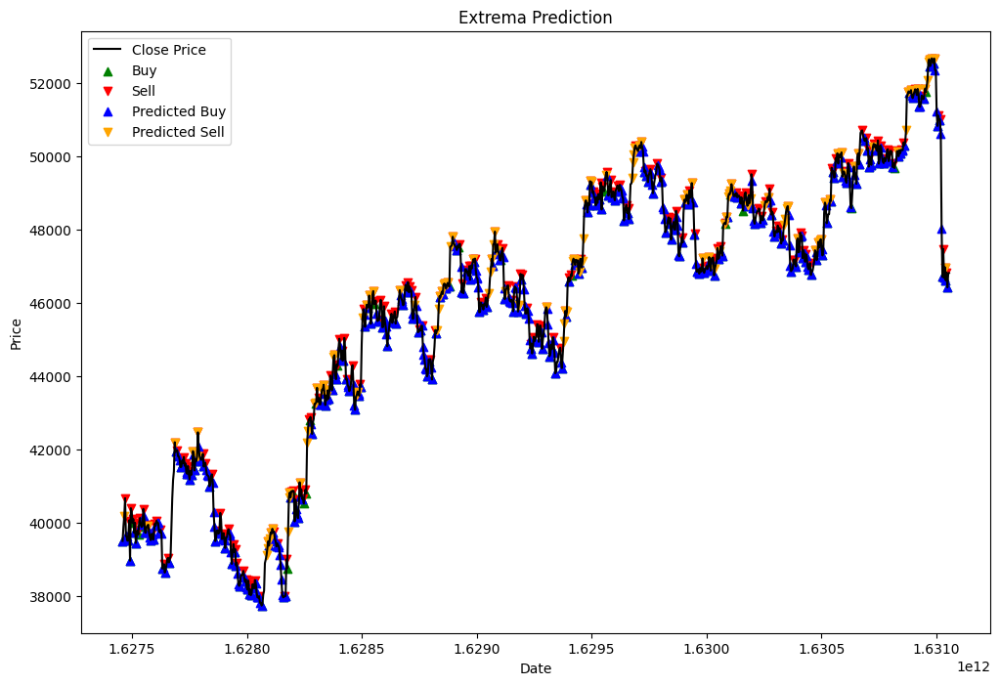

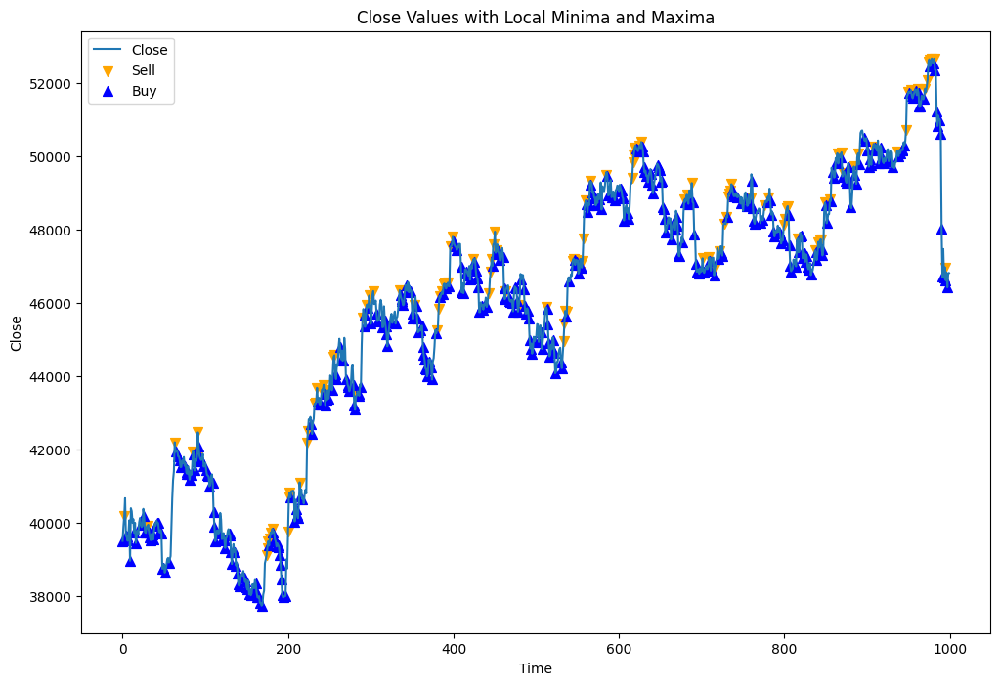

Ending Capital: 883.9668790461324
Total Theoretical Profit: -116.03312095386764
Win Percentage: 60.0%
Max Drawdown: 29.160789970303995
Max Drawdown Percent: 2.8827414668227913
Total Trades: 80
Average Return: -0.020141823690912553
Average Return pct: -0.019825812060494254
Sharpe Ratio: -0.00994317104748159
Buy signals: 418 Sell signals: 123 Candles: 1000
Percent of candles with signal (buy or sell): 54.1%


(-116.03312095386764, 54.1)

In [ ]:
train_indicies = (0, 10000)
test_indicies = (10000, 11000)
trained_1h = train_and_evaluate_model(X_1h[train_indicies[0]:train_indicies[1]], y4_1h[train_indicies[0]:train_indicies[1]], test_size=0.33)

predicted_values, proba = plot_predicted_extrema(df_1h[test_indicies[0]:test_indicies[1]], X_1h[test_indicies[0]:test_indicies[1]], trained_1h)
# Define the prediction thresholds for each class
thresholds = {
    'buy': 0.5,
    'sell': 0.5,
    'hold': 0.5
}
predicted_values = apply_thresholds(proba, thresholds)
analyze_trading_strategy(df_1h, order=1, plot_flag=True, print_flag=True, investment_percentage=0.1, use_predicted_values=True, predicted_value_range=test_indicies, predicted_values=predicted_values)

In [ ]:
from scipy import stats
import numpy as np

def apply_gaussian_filter(df, kernel_size, sigma):
    """
    Apply a Gaussian filter to the 'close' column of a DataFrame, with edge approximation.

    Parameters:
    df (pd.DataFrame): DataFrame with a 'close' column.
    kernel_size (int): Size of the Gaussian kernel (must be an odd integer).
    sigma (float): Standard deviation of the Gaussian kernel.

    Returns:
    pd.Series: Series of the smoothed 'close' values.
    """
    if 'close' not in df.columns:
        raise ValueError("DataFrame must contain a 'close' column")

    if kernel_size % 2 == 0:
        raise ValueError("Kernel size must be an odd integer")

    # Generate Gaussian kernel
    kernel = stats.norm.pdf(np.linspace(-3*sigma, 3*sigma, kernel_size), 0, sigma)
    kernel /= np.sum(kernel)  # Normalize the kernel

    # Padding the edges
    half_size = kernel_size // 2
    extended_close = np.pad(df['close'], (half_size, half_size), 'edge')

    # Apply convolution
    smoothed = np.convolve(extended_close, kernel, mode='valid')

    return pd.Series(smoothed, index=df.index)



def apply_gaussian_filter_2(df, kernel_size, sigma):
    """
    Apply a Gaussian filter to the 'close' column of a DataFrame.

    Parameters:
    df (pd.DataFrame): DataFrame with a 'close' column.
    kernel_size (int): Size of the Gaussian kernel (must be an odd integer).
    sigma (float): Standard deviation of the Gaussian kernel.

    Returns:
    pd.Series: Series of the smoothed 'close' values.
    """
        
    if 'close' not in df.columns:
        raise ValueError("DataFrame must contain a 'close' column")
    def gaussian_kernel(size, sigma):
        x = np.linspace(-(size // 2), size // 2, size)
        kernel = np.exp(-x**2 / (2 * sigma**2))
        return kernel / np.sum(kernel)  # Normalize the kernel

    # Generate the Gaussian kernel
    kernel = gaussian_kernel(kernel_size, sigma)

    # Apply the filter using numpy.convolve
    # smoothed = pd.Series(np.convolve(df['close'], kernel, mode='same'), index=df.index)
    # Padding the edges
    half_size = kernel_size // 2
    extended_close = np.pad(df['close'], (half_size, half_size), 'edge')

    # Apply convolution
    smoothed = np.convolve(extended_close, kernel, mode='valid')


    return pd.Series(smoothed, index=df.index)
 


Checking whether there is an H2O instance running at http://localhost:54321. connected.


H2O_cluster_uptime:,2 days 7 hours 31 mins
H2O_cluster_timezone:,America/New_York
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.3
H2O_cluster_version_age:,1 month and 12 days
H2O_cluster_name:,H2O_from_python_dad_f099l9
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,7.814 Gb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"locked, healthy"


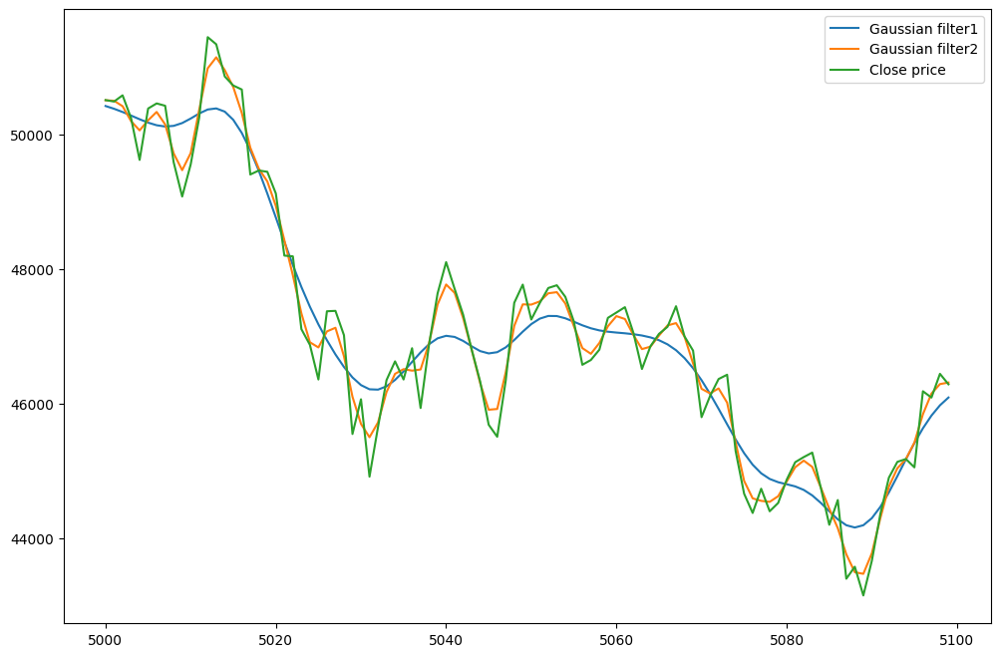

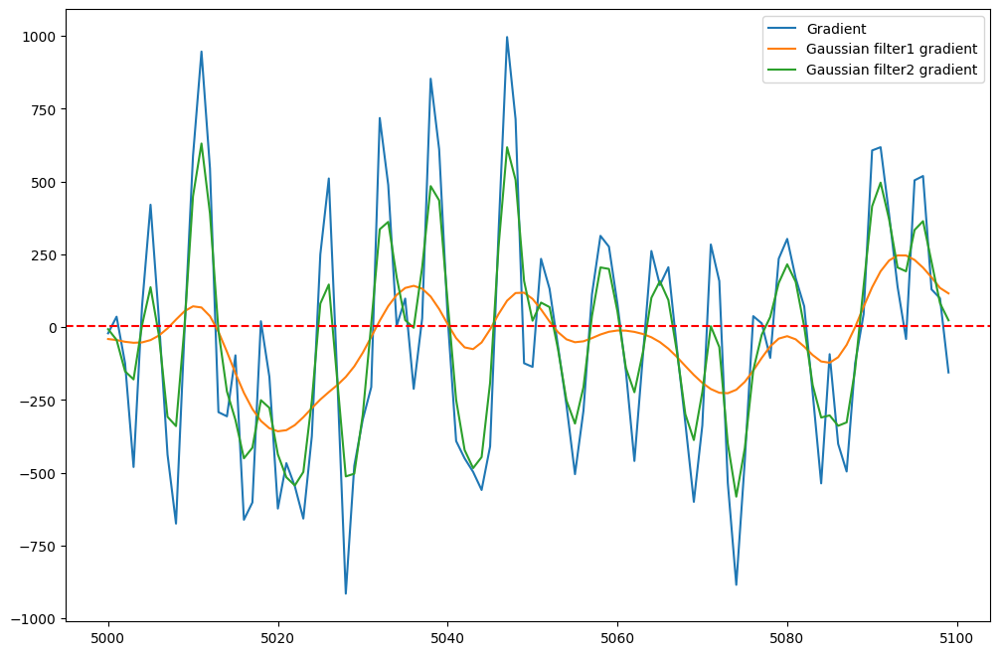

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
21:47:01.272: Fold column fold_numbers will be used for cross-validation. nfolds parameter will be ignored.
21:47:01.272: AutoML: XGBoost is not available; skipping it.

███████████████████████████████████████████████████████████████| (done) 100%


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
GLM_1_AutoML_51_20240201_214701,79.9989,6399.82,56.3307,nan,6399.82,216,0.002109,GLM
GBM_grid_1_AutoML_51_20240201_214701_model_1,80.2384,6438.19,55.2459,nan,6438.19,6446,0.005181,GBM
GBM_5_AutoML_51_20240201_214701,80.8105,6530.34,55.8454,nan,6530.34,2763,0.005191,GBM
GBM_3_AutoML_51_20240201_214701,80.832,6533.81,56.1471,nan,6533.81,2799,0.008328,GBM
GBM_2_AutoML_51_20240201_214701,81.0909,6575.74,56.0145,nan,6575.74,3574,0.007872,GBM
GBM_1_AutoML_51_20240201_214701,81.392,6624.65,56.249,nan,6624.65,3949,0.006463,GBM
GBM_4_AutoML_51_20240201_214701,81.6651,6669.19,56.1732,nan,6669.19,3182,0.00765,GBM
DRF_1_AutoML_51_20240201_214701,81.9093,6709.14,57.5022,nan,6709.14,53250,0.017839,DRF
XRT_1_AutoML_51_20240201_214701,82.3015,6773.53,57.5142,nan,6773.53,55594,0.011011,DRF
DeepLearning_1_AutoML_51_20240201_214701,82.8163,6858.54,57.9912,nan,6858.54,1120,0.005134,DeepLearning


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

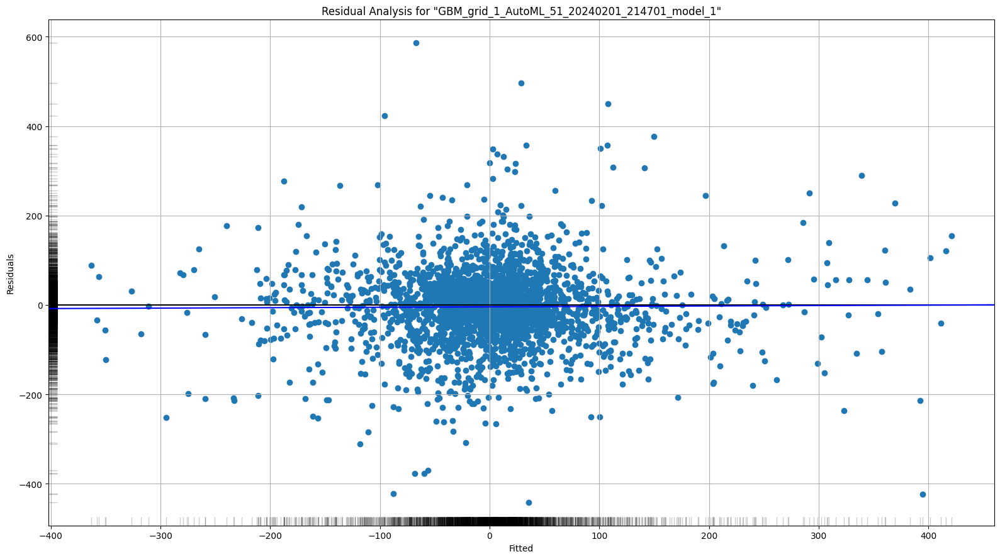

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

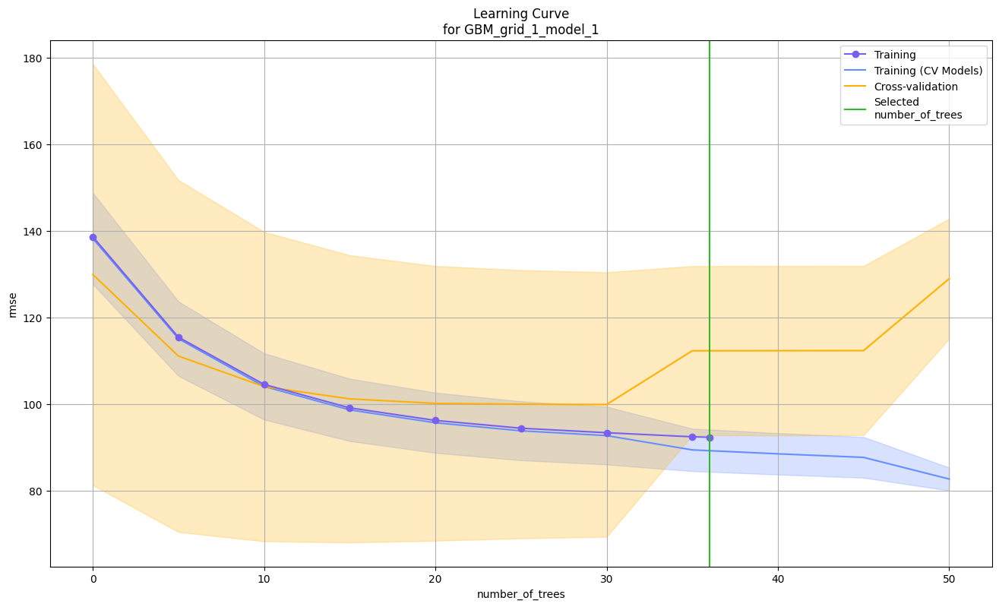

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

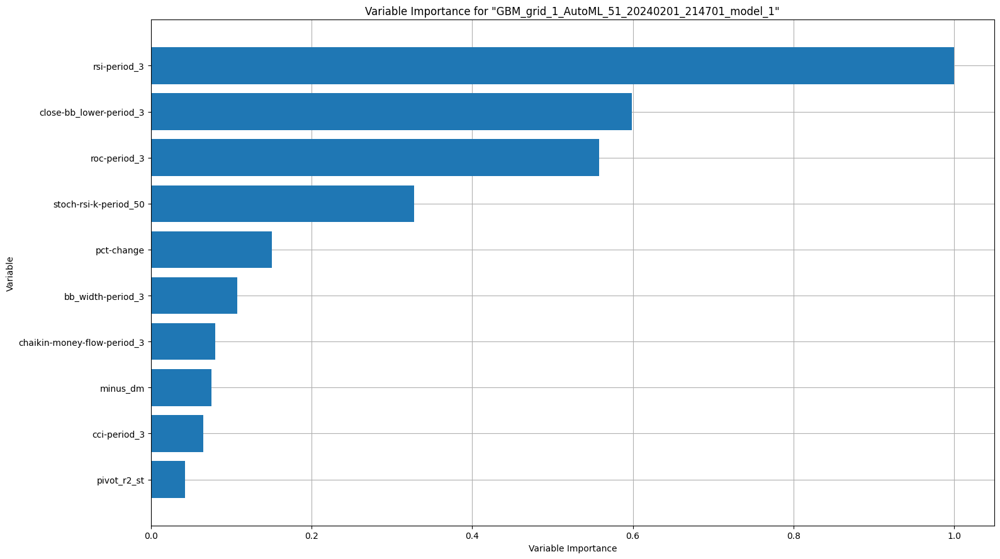

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

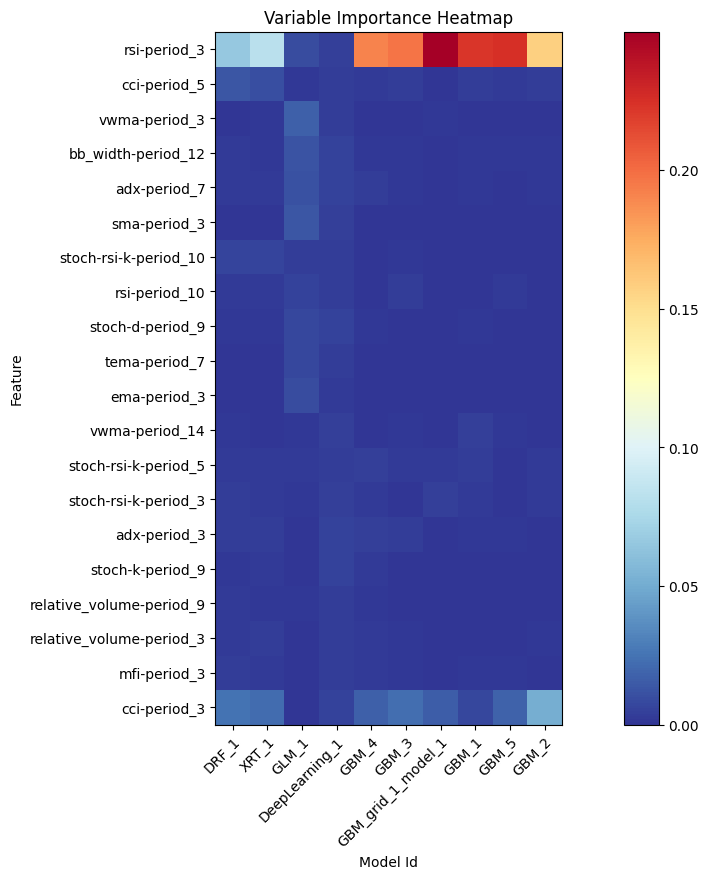

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

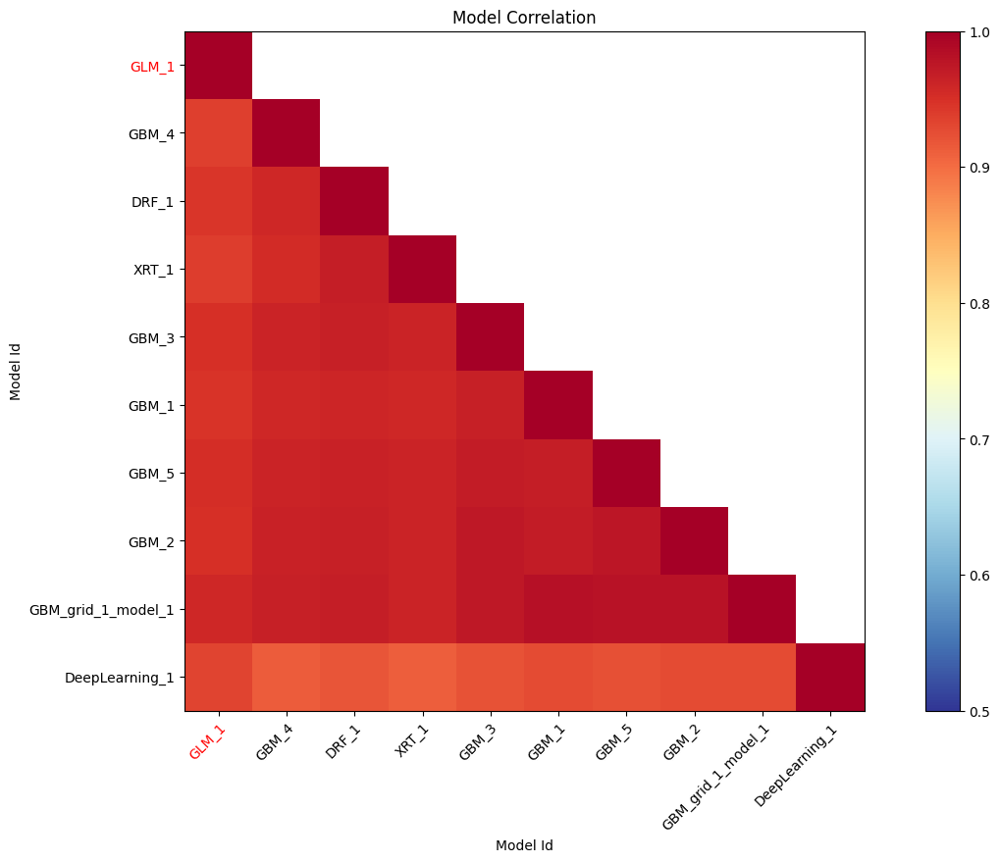

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

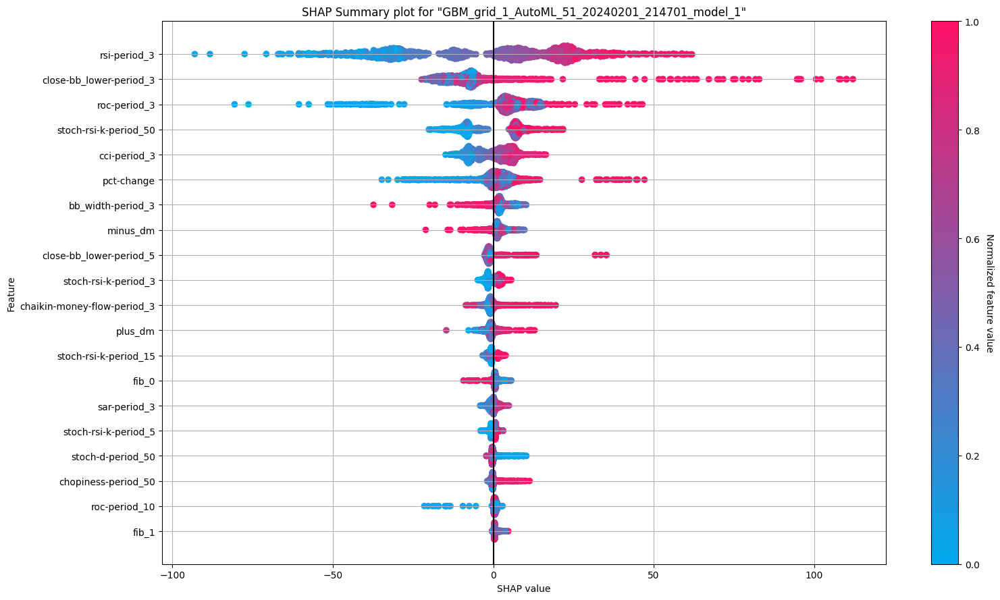

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

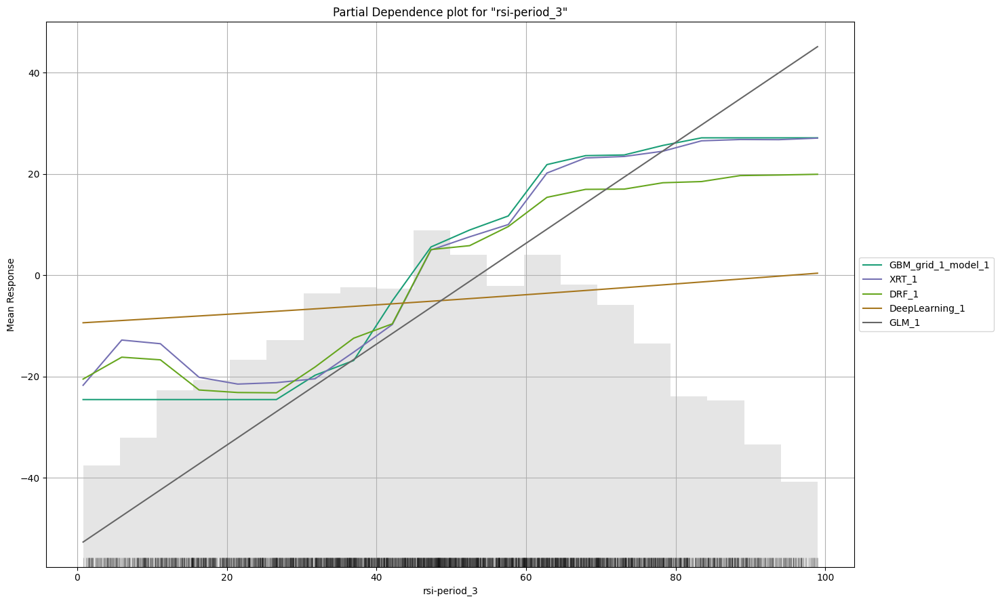

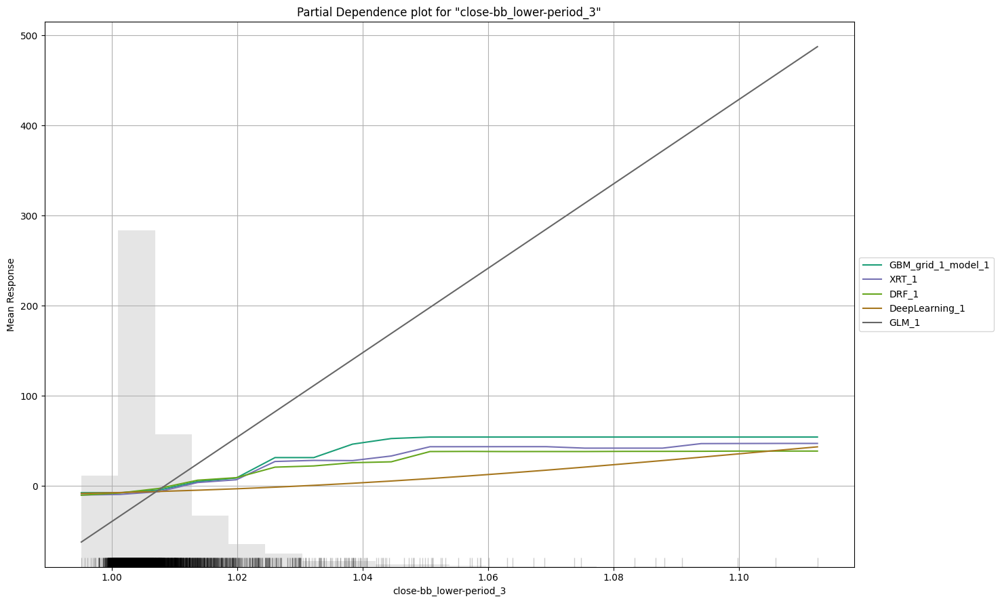

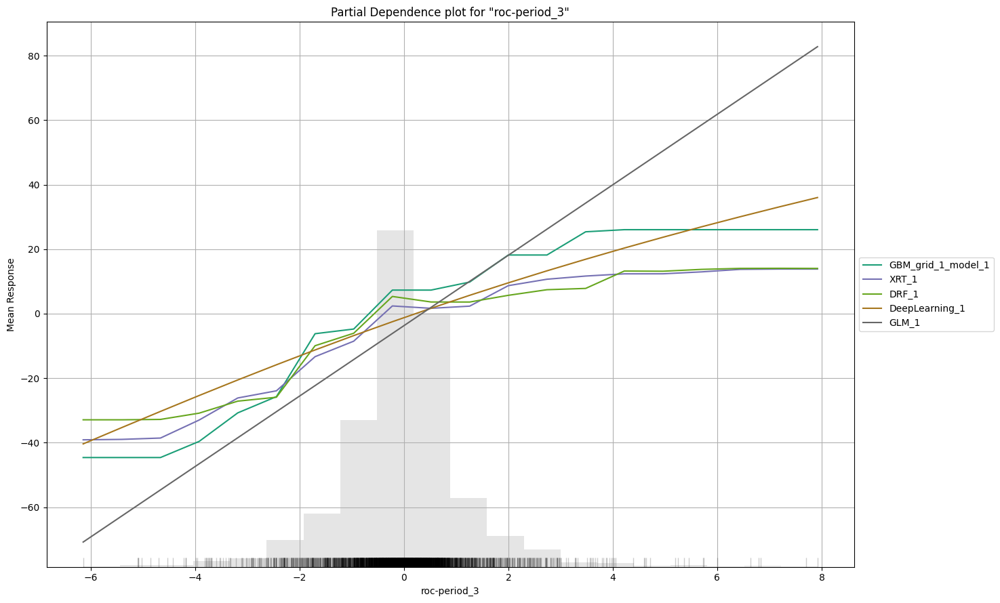

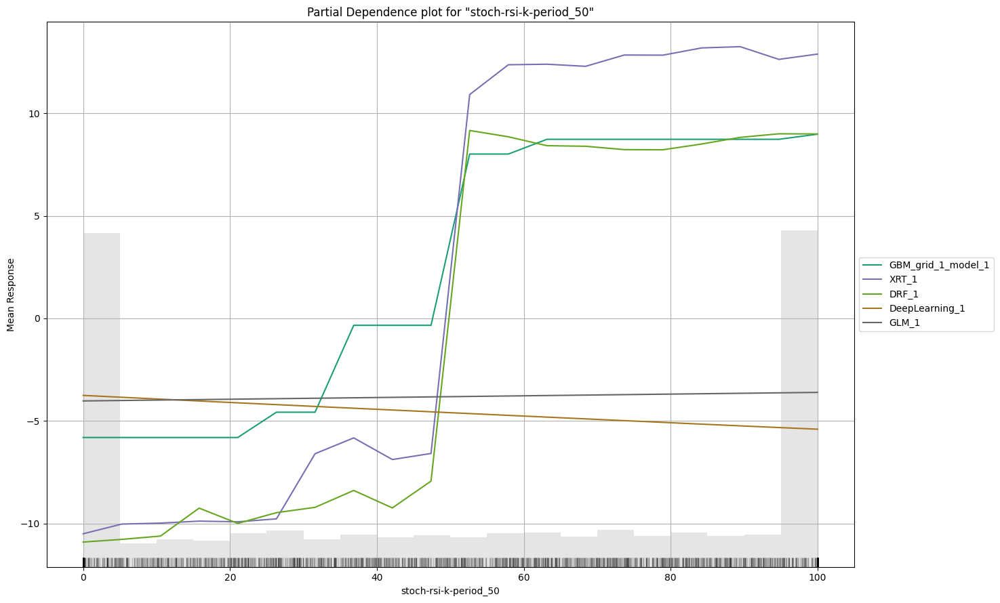

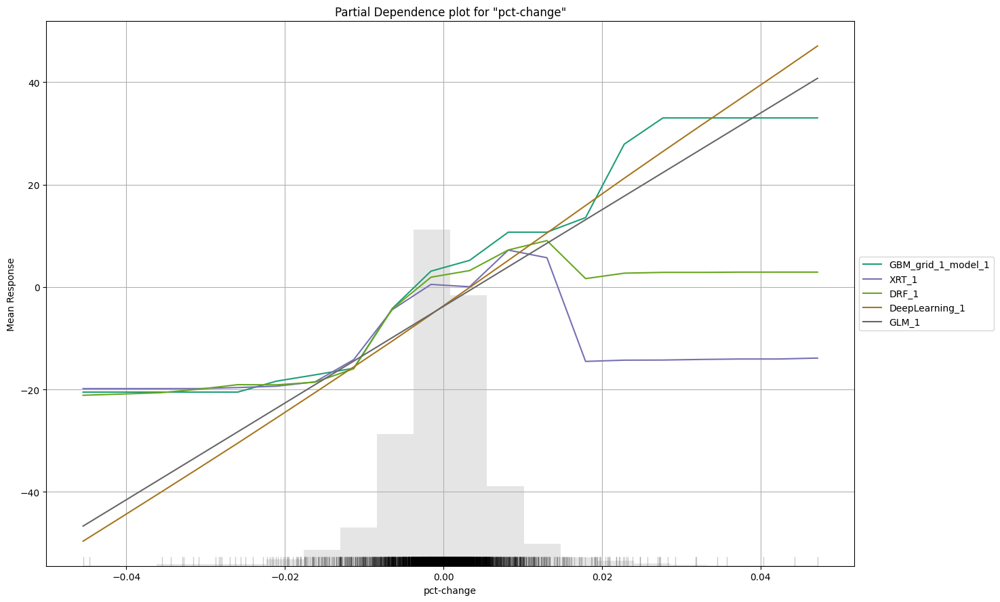

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

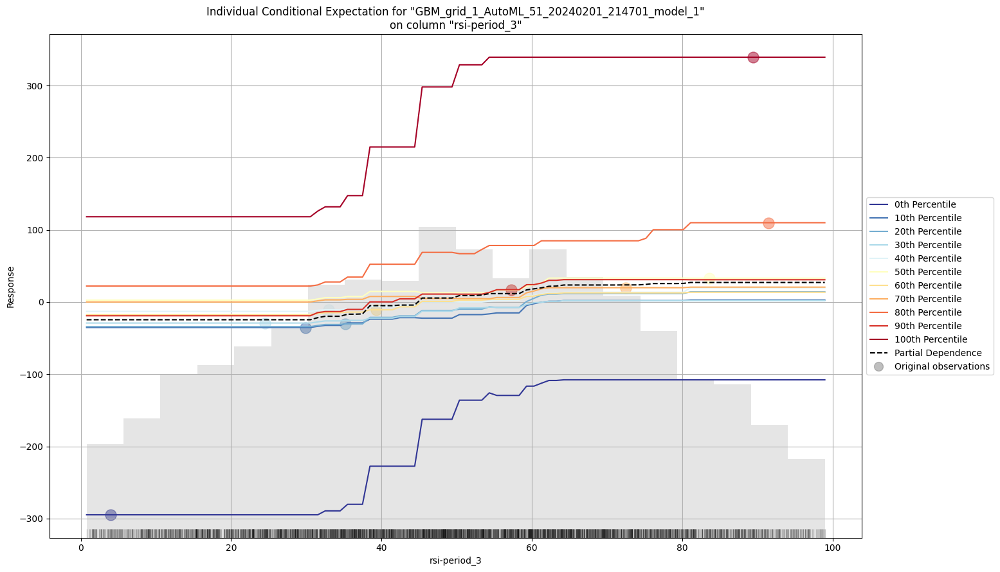

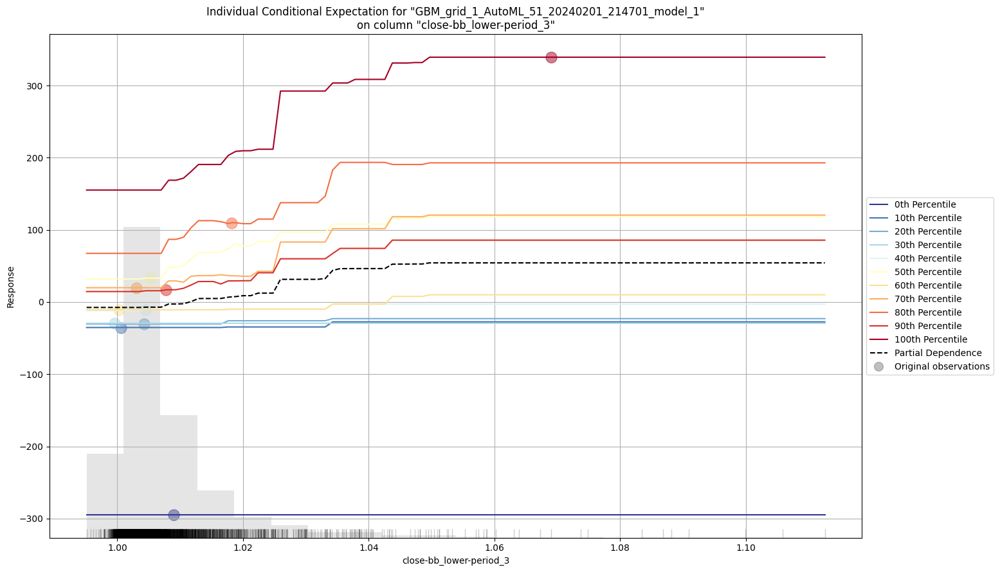

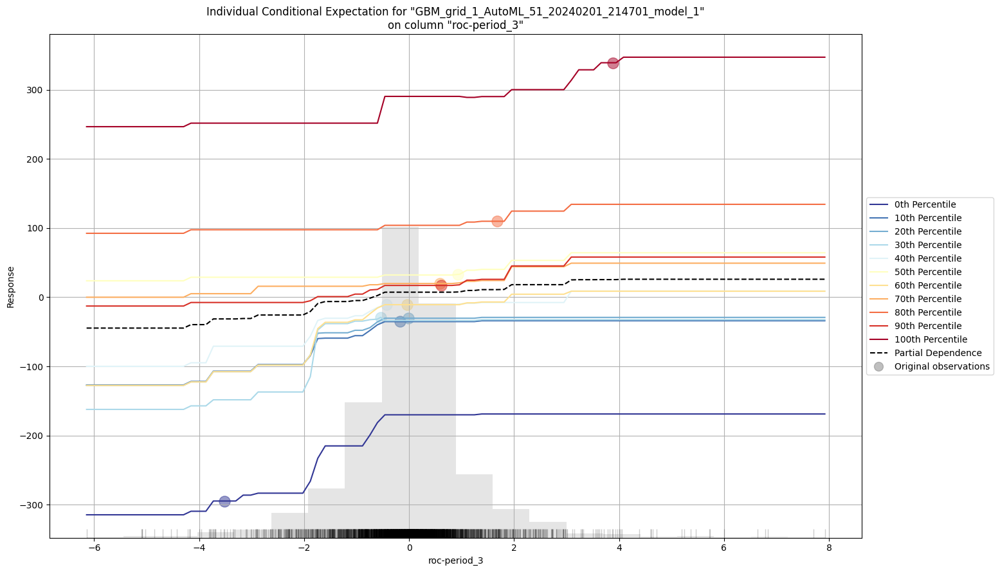

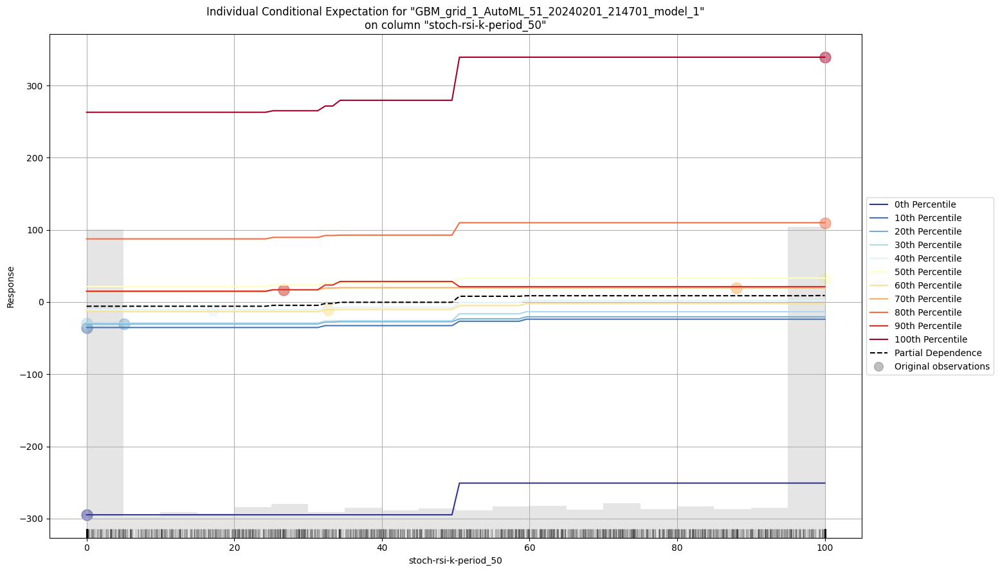

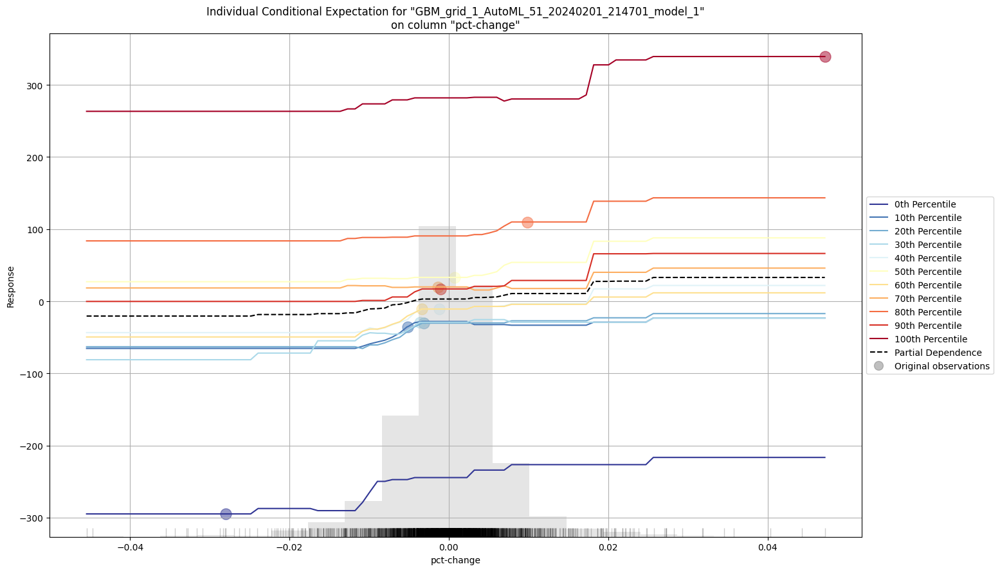



Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


/Users/dad/Library/Python/3.9/lib/python/site-packages/h2o/frame.py:1979: H2ODependencyWarning: converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above).
  warnings.warn("converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


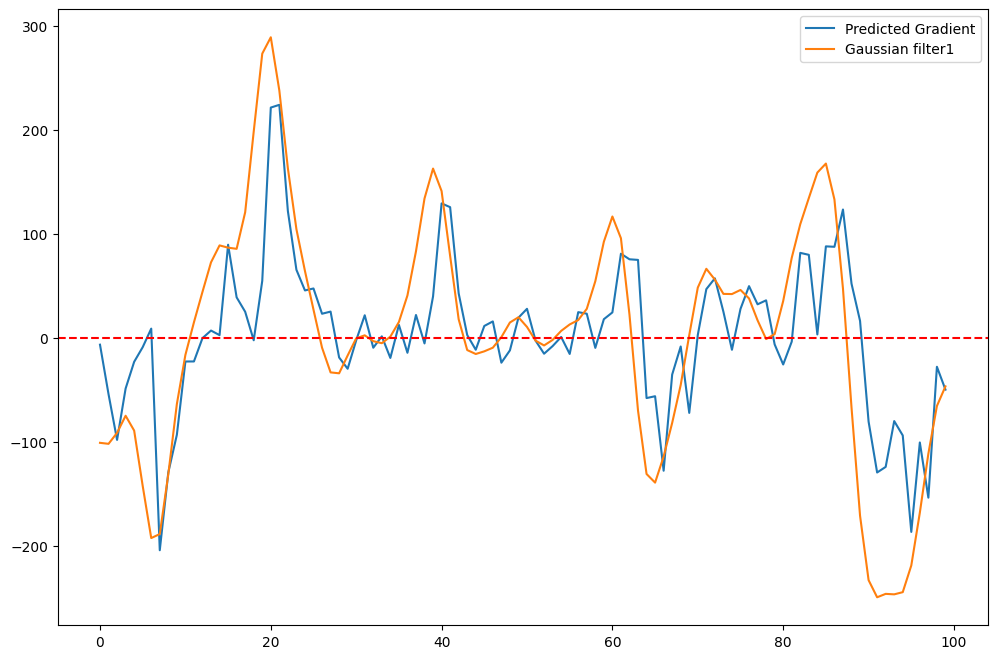

(0, 0)
Buy signals: 161.0 Sell signals: 160.0 Candles: 1000


/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_37159/4155402193.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[(predicted_values['extrema'].values == 'sell'), 'exit_max'] = 1
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_37159/4155402193.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[(predicted_values['extrema'].values == 'buy'), 'enter_min'] = 1


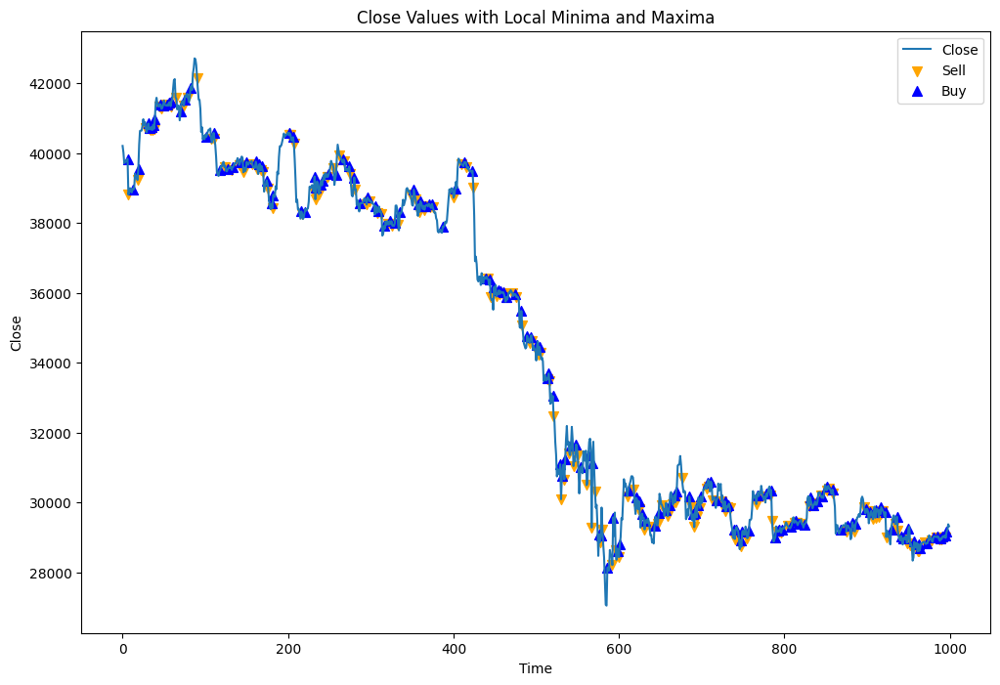

Ending Capital: 810.1639746716196
Total Theoretical Profit: -189.8360253283804
Win Percentage: 21.25%
Max Drawdown: 99.617720969527
Max Drawdown Percent: 9.961772096952703
Total Trades: 160
Average Return: -0.43162371890729323
Average Return pct: -0.45495757026040984
Sharpe Ratio: -0.3885959929196956
Buy signals: 161.0 Sell signals: 160.0 Candles: 1000
Percent of candles with signal (buy or sell): 32.1%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
22:00:36.461: Fold column fold_numbers will be used for cross-validation. nfolds parameter will be ignored.
22:00:36.463: AutoML: XGBoost is not available; skipping it.

███████████████████████████████████████████████████████████████| (done) 100%


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
GLM_1_AutoML_52_20240201_220036,99.8581,9971.64,70.0203,nan,9971.64,352,0.00161,GLM
GBM_1_AutoML_52_20240201_220036,99.9894,9997.87,69.1267,nan,9997.87,3266,0.005532,GBM
GBM_2_AutoML_52_20240201_220036,100.42,10084.2,69.4311,nan,10084.2,2646,0.003244,GBM
GBM_3_AutoML_52_20240201_220036,101.024,10205.8,69.8098,nan,10205.8,3520,0.004842,GBM
GBM_5_AutoML_52_20240201_220036,101.028,10206.7,69.2827,nan,10206.7,2690,0.002859,GBM
GBM_grid_1_AutoML_52_20240201_220036_model_1,101.619,10326.4,70.4957,nan,10326.4,2464,0.004622,GBM
GBM_4_AutoML_52_20240201_220036,101.729,10348.9,70.5456,nan,10348.9,3700,0.004157,GBM
DeepLearning_1_AutoML_52_20240201_220036,101.779,10359,71.4146,nan,10359,1036,0.002986,DeepLearning
XRT_1_AutoML_52_20240201_220036,101.988,10401.5,71.1887,nan,10401.5,57875,0.009239,DRF
DRF_1_AutoML_52_20240201_220036,102.046,10413.4,71.2645,nan,10413.4,51923,0.012872,DRF


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

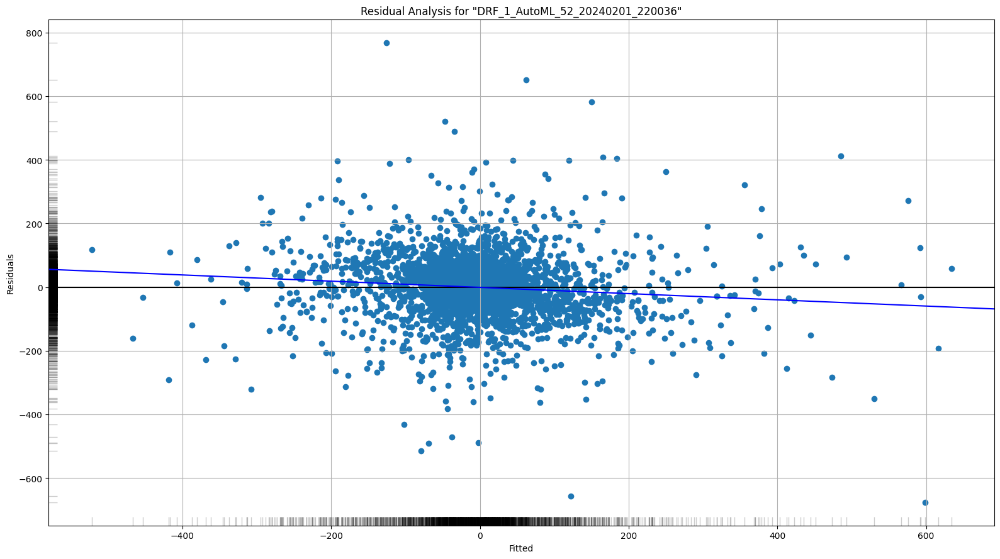

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

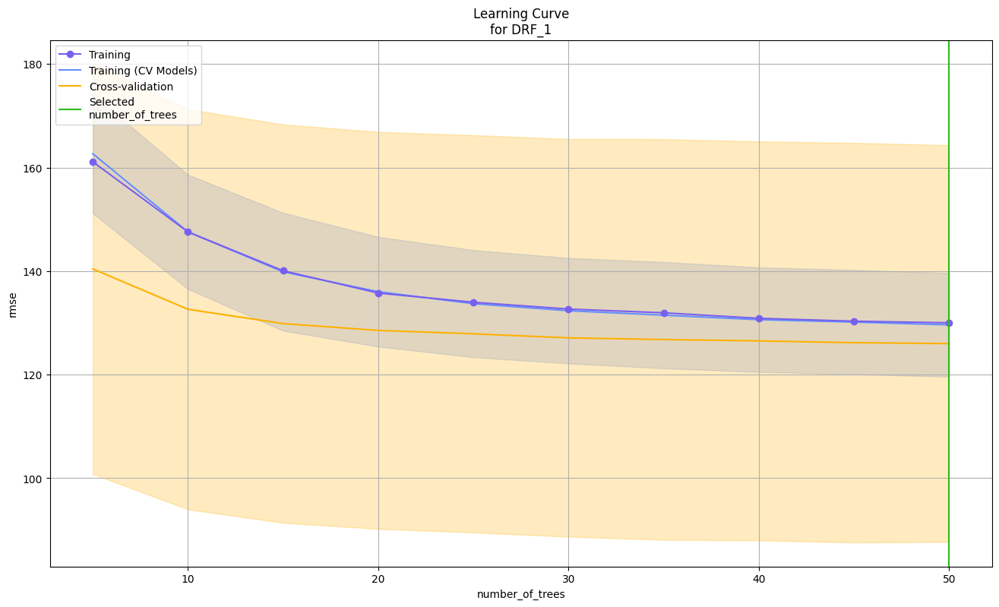

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

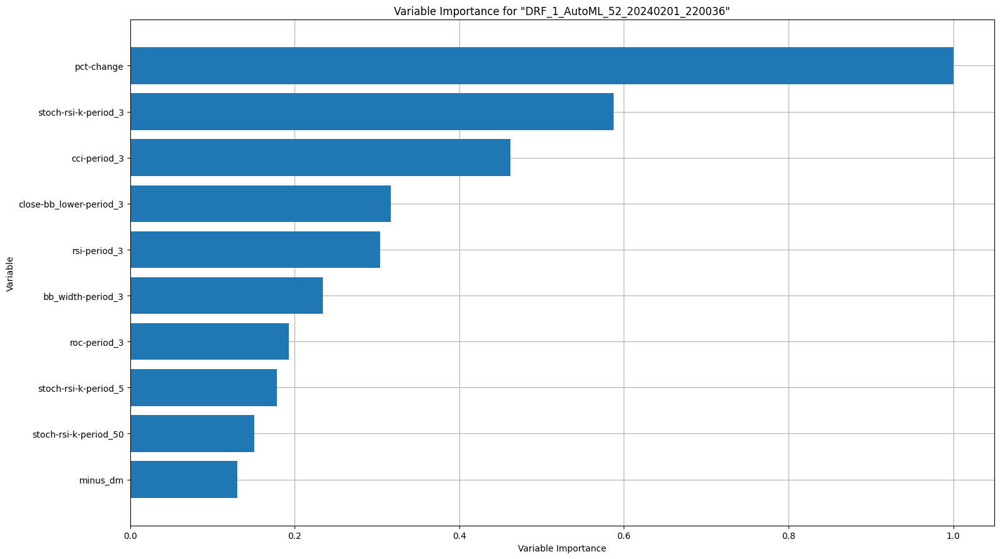

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

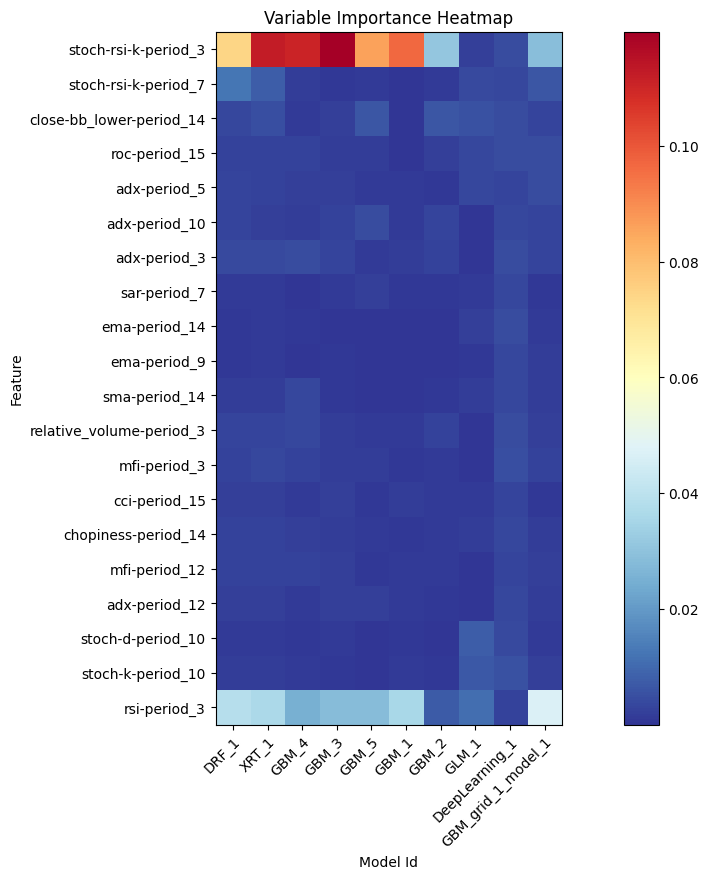

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

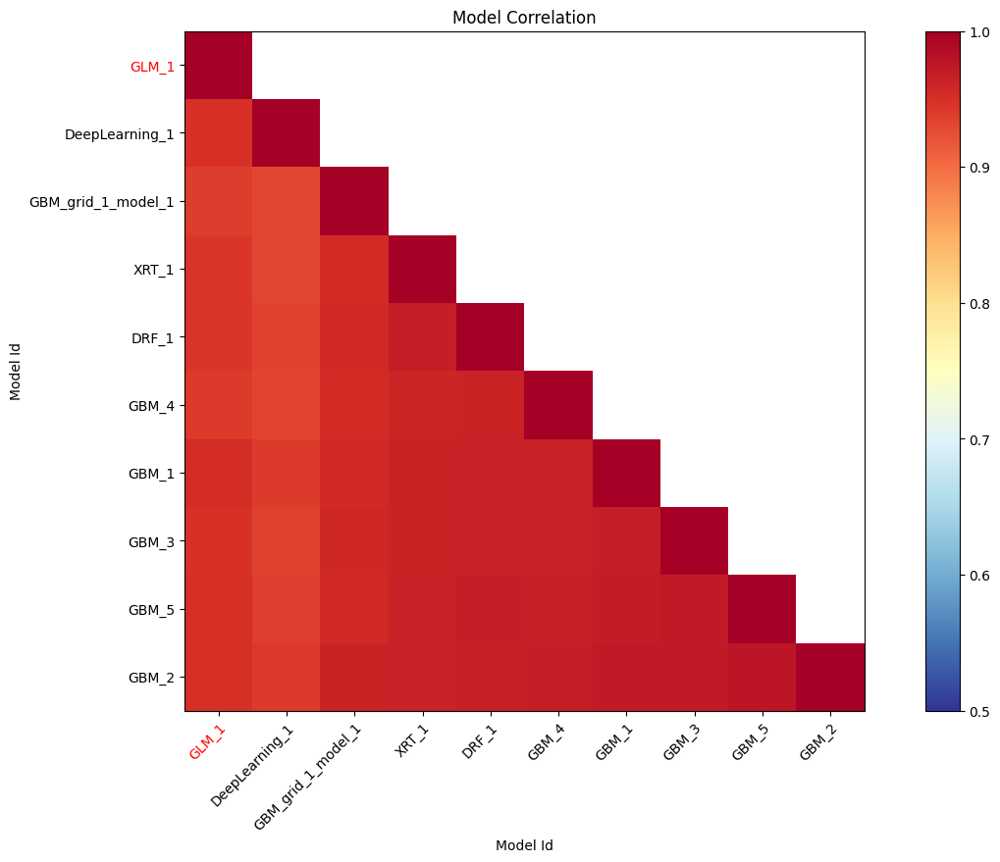

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

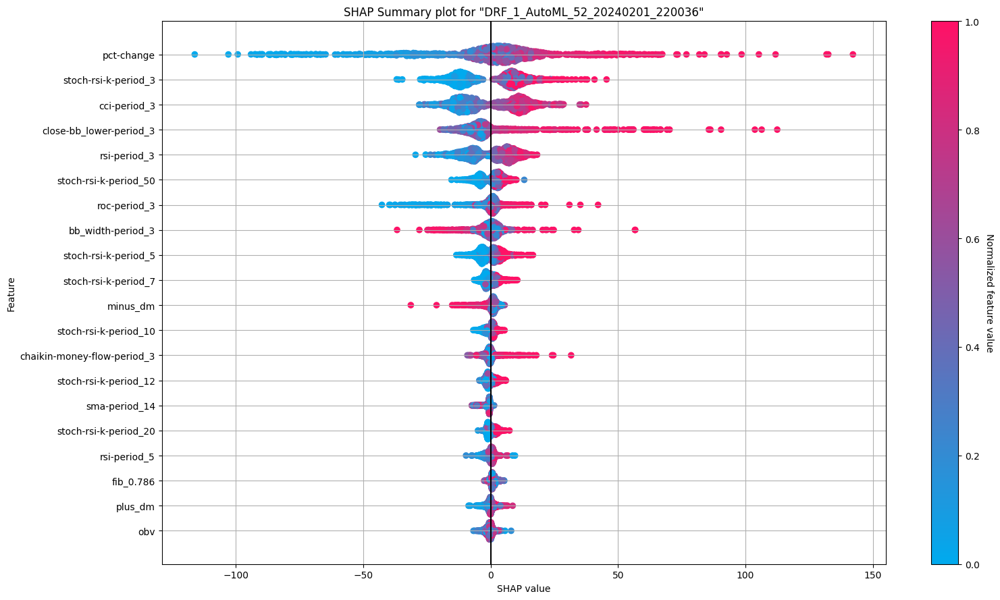

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

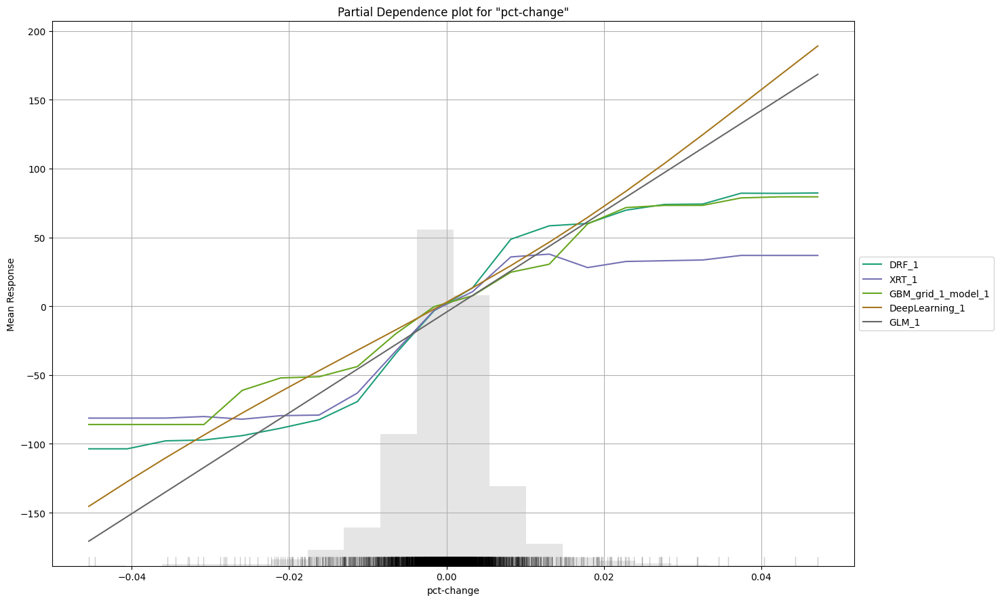

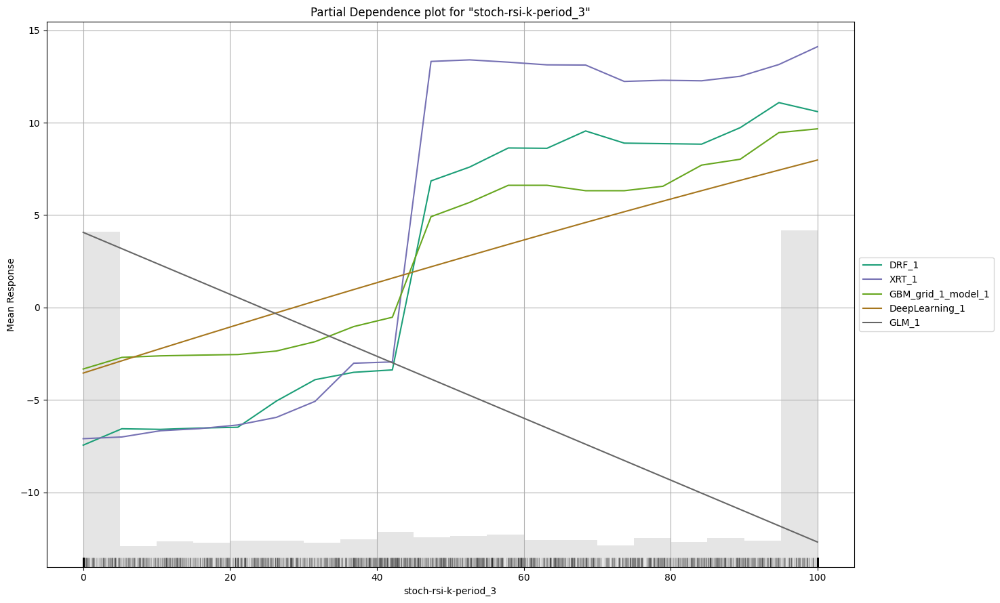

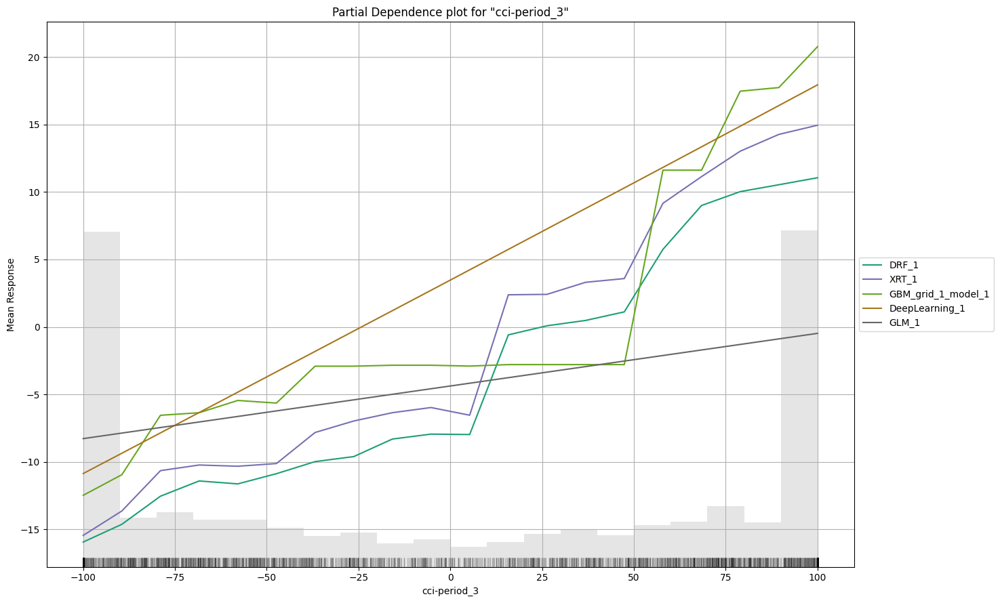

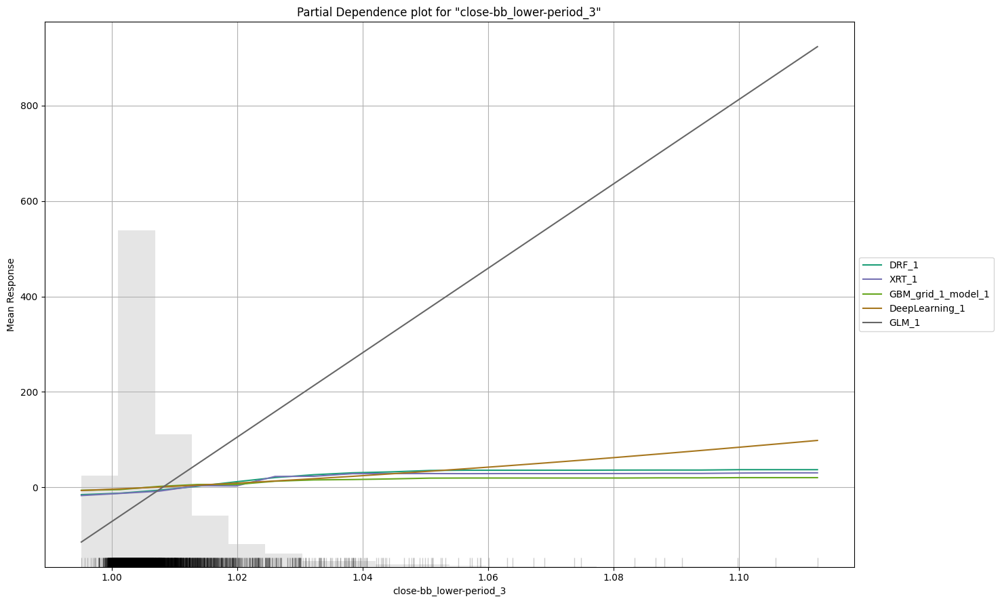

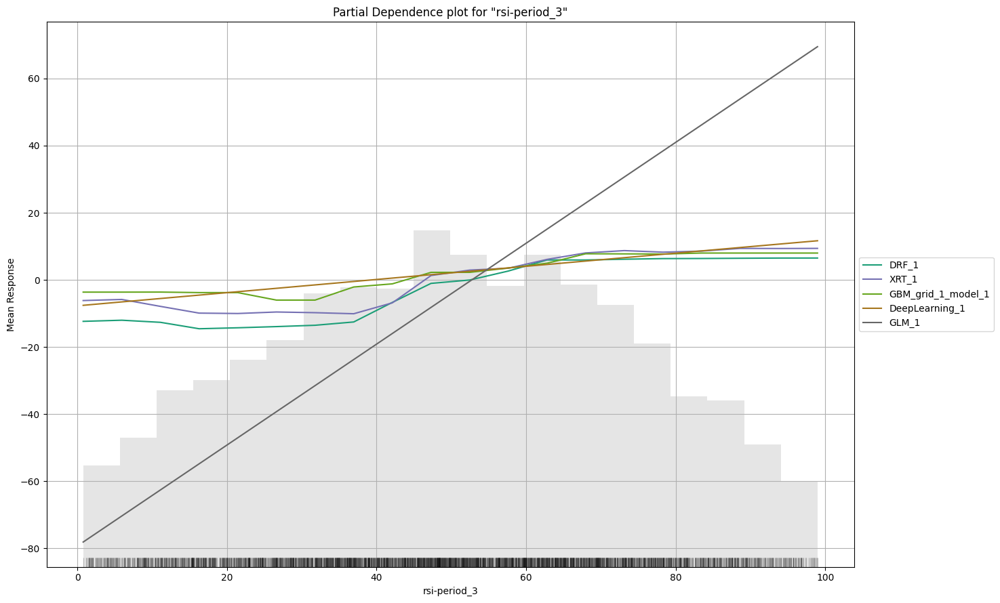

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

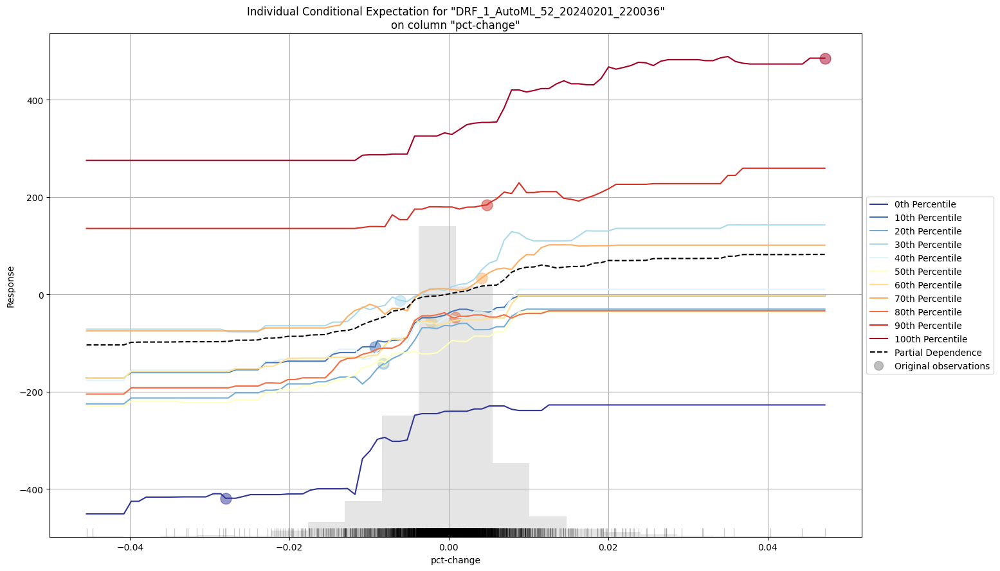

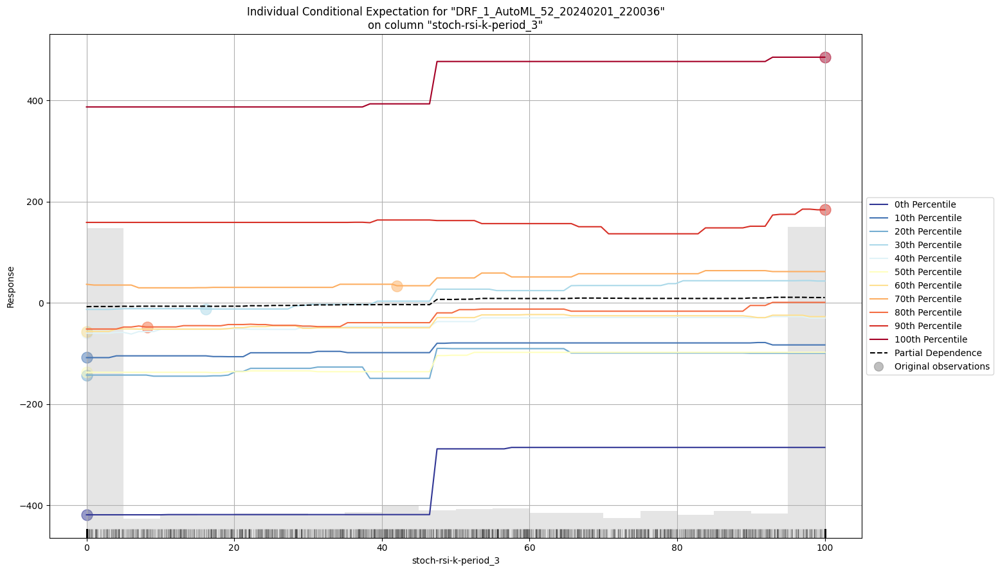

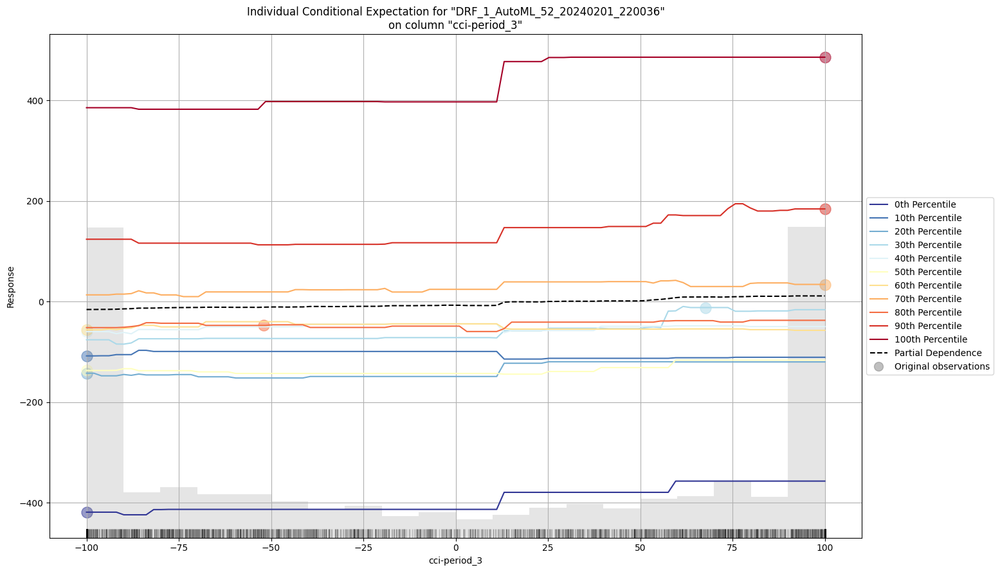

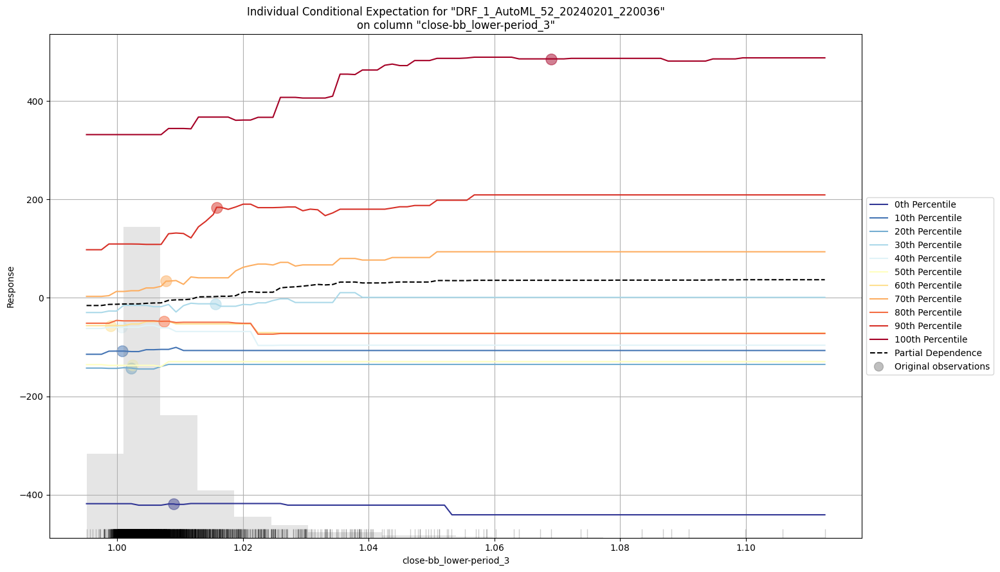

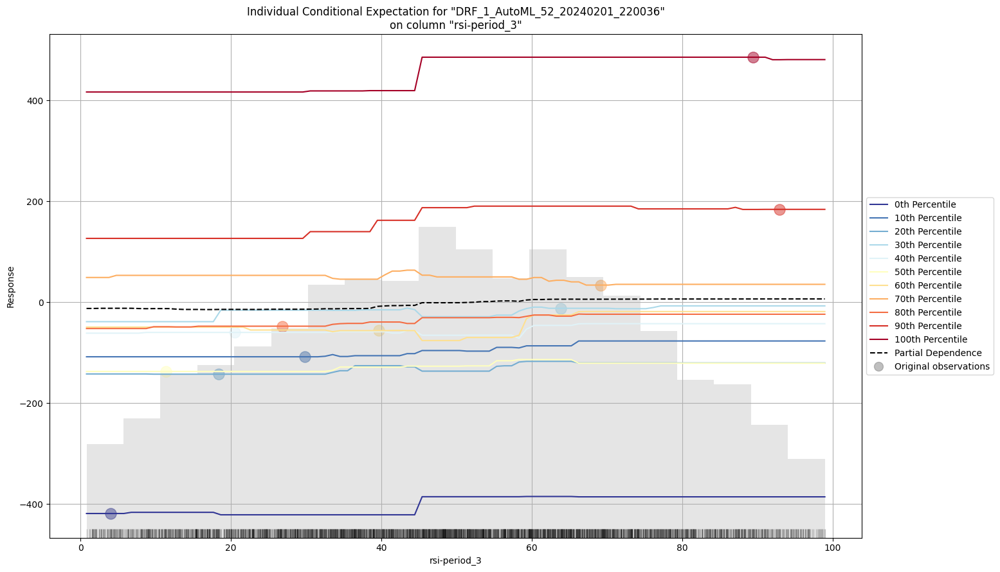



Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
drf prediction progress: |███████████████████████████████████████████████████████| (done) 100%


/Users/dad/Library/Python/3.9/lib/python/site-packages/h2o/frame.py:1979: H2ODependencyWarning: converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above).
  warnings.warn("converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_37159/4155402193.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[(predicted_values['extrema'].values == 'sell'), 'exit_max'] = 1
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_37159/4155402193.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a 

Buy signals: 192.0 Sell signals: 191.0 Candles: 1000


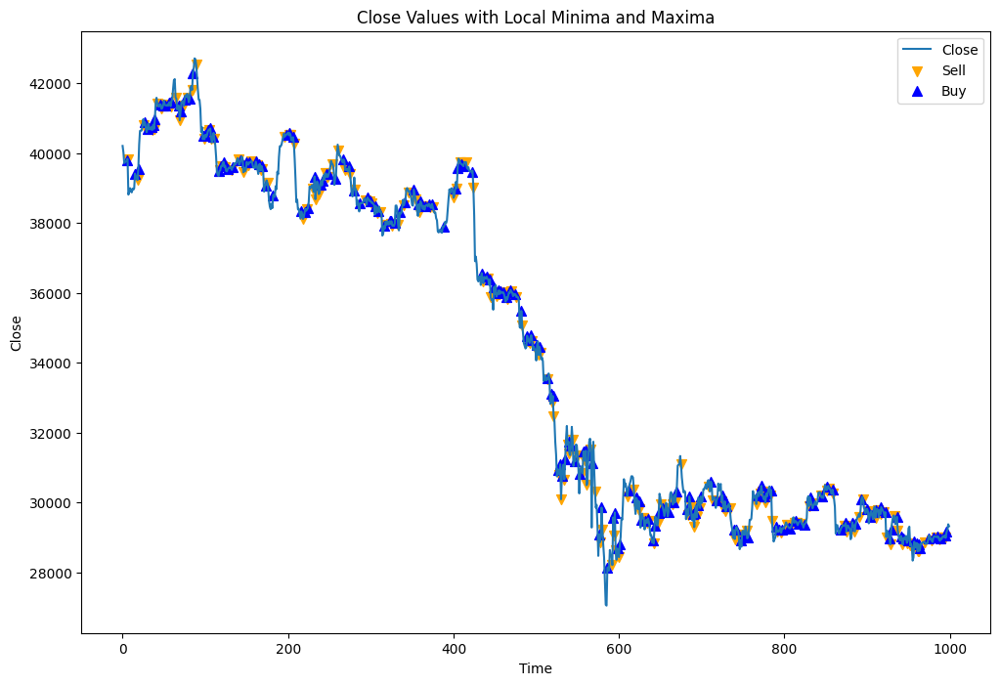

Ending Capital: 807.9035627883901
Total Theoretical Profit: -192.0964372116099
Win Percentage: 21.98952879581152%
Max Drawdown: 103.73071302461733
Max Drawdown Percent: 10.356491956494585
Total Trades: 191
Average Return: -0.3437658619443762
Average Return pct: -0.36335144780916573
Sharpe Ratio: -0.3547493307662534
Buy signals: 192.0 Sell signals: 191.0 Candles: 1000
Percent of candles with signal (buy or sell): 38.3%


(-192.0964372116099, 38.3)

In [ ]:
#testing gaussian filter


# gaussian filtering predictions and training 1h
h2o.init()
plt.figure(figsize=(12, 8))
closegaus1 = apply_gaussian_filter(df_1h_order1[5000:5100], 21, 1)
closegaus1.plot(label='Gaussian filter1')
closegaus2 = apply_gaussian_filter_2(df_1h_order1[5000:5100], 21, 1)
closegaus2.plot(label='Gaussian filter2')
df_1h_order1['close'][5000:5100].plot(label='Close price')
plt.legend()
plt.show()

# calculate gradients of each
close_1hgrad = pd.Series(np.gradient(df_1h_order1['close'][5000:5100]), index=df_1h_order1.index[5000:5100])
close_grad1 = pd.Series(np.gradient(closegaus1), index=df_1h_order1.index[5000:5100])
close_grad2 = pd.Series(np.gradient(closegaus2), index=df_1h_order1.index[5000:5100])

# add horizontal red line at y=0
plt.figure(figsize=(12, 8))
close_1hgrad.plot(label='Gradient')
close_grad1.plot(label='Gaussian filter1 gradient')
close_grad2.plot(label='Gaussian filter2 gradient')
plt.axhline(y=5, color='r', linestyle='--')
plt.legend()
plt.show()

target_gaussgrad1_1h = pd.DataFrame({'gaussgrad1': np.gradient(apply_gaussian_filter(df_1h_order1[0:15000], 11, 1))}, index=df_1h_order1[0:15000].index)
target_gaussgrad2_1h = pd.DataFrame({'gaussgrad2': np.gradient(apply_gaussian_filter_2(df_1h_order1[0:15000], 11, 1))}, index=df_1h_order1[0:15000].index)

#train and evaluate model on both, predict and model profitability
trained_model_gaussgrad1_1h = train_and_evaluate_model(X_1h_order1[0:15000], target_gaussgrad1_1h, test_size=0.2)
preds_gaussgrad1_1h = trained_model_gaussgrad1_1h.leader.predict(h2o.H2OFrame(X_1h_order1[15000:16000])).as_data_frame()
#get buy and sell signals from sign change in gradient, 'hold' otherwise
plt.figure(figsize=(12, 8))
preds_gaussgrad1_1h['predict'][0:100].plot(label='Predicted Gradient')
close_1hgaussgrad1 = pd.Series(np.gradient(apply_gaussian_filter(df_1h_order1[15000:15100], 11, 1))).reset_index(drop=True)
close_1hgaussgrad1.plot(label='Gaussian filter1')
plt.axhline(y=0, color='r', linestyle='--')
plt.legend()
plt.show()
predicted_values1 = pd.DataFrame()
print(predicted_values1.shape)
predicted_values1.at[0,'extrema'] = 'hold' #hold first value

for i in range(1,len(preds_gaussgrad1_1h)):
    count = count + 1
    if preds_gaussgrad1_1h['predict'].iloc[i-1] < 0 and preds_gaussgrad1_1h['predict'].iloc[i] > 0:
        predicted_values1.at[i, 'extrema'] = 'buy'
        buys = buys + 1
    elif preds_gaussgrad1_1h['predict'].iloc[i-1] > 0 and preds_gaussgrad1_1h['predict'].iloc[i] < 0:
        predicted_values1.at[i, 'extrema'] = 'sell'
        sells = sells + 1
    else:
        predicted_values1.at[i, 'extrema'] = 'hold'


analyze_trading_strategy(df_1h_order1[15000:16000], order=1, plot_flag=True, print_flag=True, use_predicted_values=True, predicted_values=predicted_values1)

trained_model_gaussgrad2_1h = train_and_evaluate_model(X_1h_order1[0:15000], target_gaussgrad2_1h, test_size=0.2)
preds_gaussgrad2_1h = trained_model_gaussgrad2_1h.leader.predict(h2o.H2OFrame(X_1h_order1[15000:16000])).as_data_frame()
predicted_values2 = pd.DataFrame()
predicted_values2.at[0,'extrema'] = 'hold'
for i in range(1, len(preds_gaussgrad2_1h)):
    if preds_gaussgrad2_1h['predict'].iloc[i-1] < 0 and preds_gaussgrad2_1h['predict'].iloc[i] >= 0:
        predicted_values2.at[i, 'extrema'] = 'buy'
    elif preds_gaussgrad2_1h['predict'].iloc[i-1] > 0 and preds_gaussgrad2_1h['predict'].iloc[i] <= 0:
        predicted_values2.at[i, 'extrema'] = 'sell'
    else:
        predicted_values2.at[i, 'extrema'] = 'hold'

analyze_trading_strategy(df_1h_order1[15000:16000], order=1, plot_flag=True, print_flag=True, use_predicted_values=True, predicted_values=predicted_values2)

In [ ]:
def train_and_evaluate_gradient_model(df, testsize=0.2, kernel_size=21, sigma=1):
    # get split indicies (split indicies are the last 20% of the data)
    split_index = int(len(df) * (1 - testsize))
    # split to train
    df.dropna(inplace=True)
    # drop index from df
    df = df.reset_index(drop=True)
    print(df.shape)
    df = df.drop_duplicates(subset='date')
    X = df.filter(regex='^[%]')

    def clean_column_names(df):
        df.columns = df.columns.str.replace('&-', '', regex=False)
        df.columns = df.columns.str.replace('&s-', '', regex=False)
        df.columns = df.columns.str.replace('%-', '', regex=False)
        return df

    # Clean the DataFrame column names
    X = clean_column_names(X)

    traindf = df[:split_index]
    testdf = df[split_index:]
    X_train = X[:split_index]
    X_test = X[split_index:]

    plt.figure(figsize=(12, 8))
    closegaus = apply_gaussian_filter(df, kernel_size, sigma)
    closegaus.index = df.index
    df['close'].plot(label='Close price')
    closegaus.plot(label='Gaussian filter1 of whole dataset')
    plt.legend()
    plt.show()
    
    # calculate gradients of each
    closegrad = pd.Series(np.gradient(df['close']), index=df.index)
    gaussgrad = pd.Series(np.gradient(closegaus), index=df.index)

    # add horizontal red line at y=0
    plt.figure(figsize=(12, 8))
    closegrad.plot(label='Gradient')
    gaussgrad.plot(label='Gaussian filter gradient')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.legend()
    plt.show()

    # create target
    target_gaussgrad = pd.DataFrame({'gaussgrad': np.gradient(apply_gaussian_filter(traindf, kernel_size, sigma))}, index=traindf.index)
    #train and evaluate model on both, predict and model profitability
    trained_model_gaussgrad = train_and_evaluate_model(X_train, target_gaussgrad, test_size=0.05)
    preds_gaussgrad = trained_model_gaussgrad.predict(X_test)
    preds_gaussgrad = pd.DataFrame(preds_gaussgrad, columns=['predict'])
    predicted_values = pd.DataFrame()

    predicted_values.at[0,'extrema'] = 'hold' #hold first value
    for i in range(1,len(preds_gaussgrad)):
        if preds_gaussgrad['predict'].iloc[i-1] < 0 and preds_gaussgrad['predict'].iloc[i] >= 0:
            predicted_values.at[i, 'extrema'] = 'buy'
        elif preds_gaussgrad['predict'].iloc[i-1] > 0 and preds_gaussgrad['predict'].iloc[i] <= 0:
            predicted_values.at[i, 'extrema'] = 'sell'
        else:
            predicted_values.at[i, 'extrema'] = 'hold'

    actual_gaussgrad = pd.DataFrame({'gaussgrad': np.gradient(apply_gaussian_filter(testdf, kernel_size, sigma))}).reset_index(drop=True)
    plt.figure(figsize=(12, 8))
    preds_gaussgrad['predict'].plot(label='Predicted Gradient')
    actual_gaussgrad['gaussgrad'].plot(label='Gaussian filter Gradient')
    # evaluate and print goodness of fit of preds_gaussgrad and actual_gaussgrad by manual calculation of metrics

    plt.axhline(y=0, color='r', linestyle='--')
    plt.legend()
    plt.show()

    analyze_trading_strategy(testdf, order=1, plot_flag=True, print_flag=True, use_predicted_values=True, predicted_values=predicted_values)
    return trained_model_gaussgrad

(10000, 307)
(10000, 307)


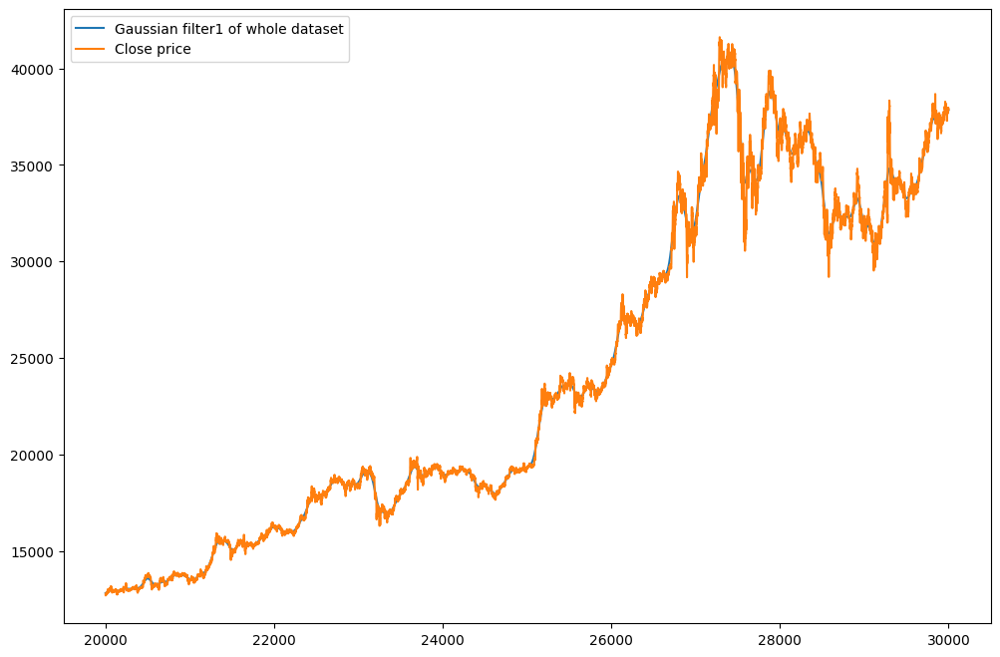

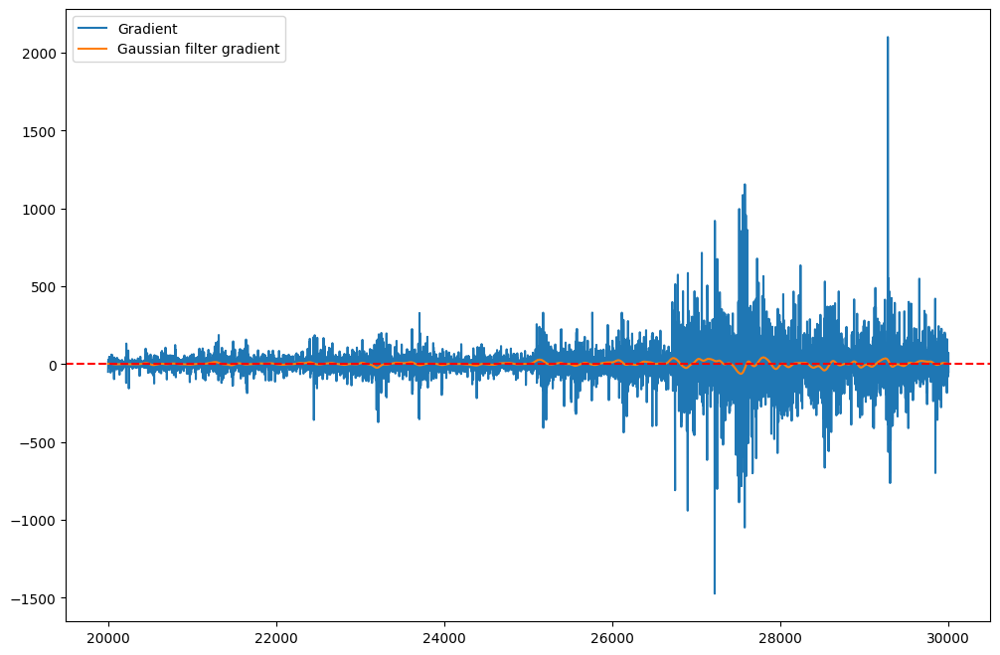

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
11:15:40.245: Fold column fold_numbers will be used for cross-validation. nfolds parameter will be ignored.

███████████████████████████████████████████████████████████████| (done) 100%


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
DeepLearning_grid_3_AutoML_64_20240202_111540_model_3,4.71161,22.1993,3.76641,0.559747,22.1993,34457,0.009922,DeepLearning
DeepLearning_grid_2_AutoML_64_20240202_111540_model_1,6.04496,36.5415,4.71194,nan,36.5415,43636,0.023859,DeepLearning
DeepLearning_grid_2_AutoML_64_20240202_111540_model_2,6.67394,44.5415,5.12304,nan,44.5415,45589,0.021737,DeepLearning
DeepLearning_grid_2_AutoML_64_20240202_111540_model_3,6.82265,46.5485,5.4224,1.06852,46.5485,37483,0.012565,DeepLearning
DeepLearning_grid_1_AutoML_64_20240202_111540_model_3,7.40848,54.8856,5.44997,nan,54.8856,35607,0.008328,DeepLearning
DeepLearning_grid_1_AutoML_64_20240202_111540_model_2,7.46789,55.7694,6.18283,0.978842,55.7694,54179,0.012384,DeepLearning
DeepLearning_grid_3_AutoML_64_20240202_111540_model_2,7.61881,58.0462,6.71734,nan,58.0462,60964,0.027012,DeepLearning
DeepLearning_grid_3_AutoML_64_20240202_111540_model_1,7.64318,58.4182,5.98902,1.27423,58.4182,35525,0.009492,DeepLearning
DeepLearning_grid_1_AutoML_64_20240202_111540_model_1,8.46534,71.662,6.13914,nan,71.662,40285,0.011922,DeepLearning
DeepLearning_1_AutoML_64_20240202_111540,13.1678,173.39,12.5471,nan,173.39,440,0.007158,DeepLearning


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

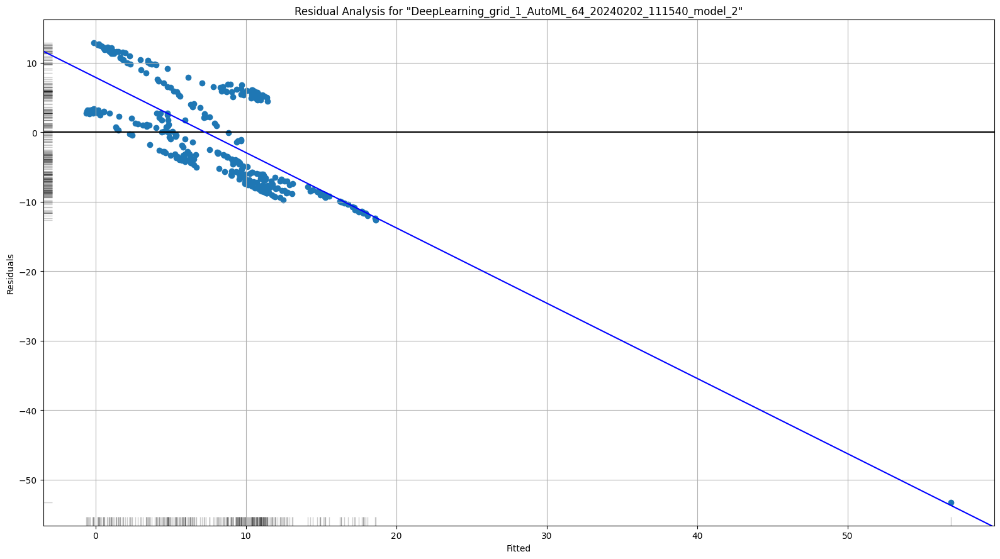

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

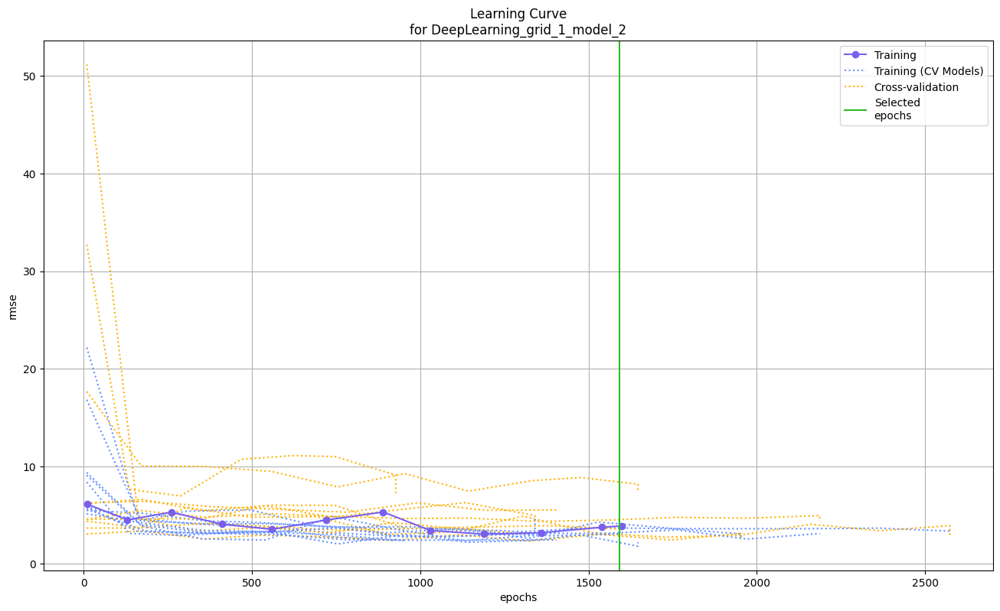

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

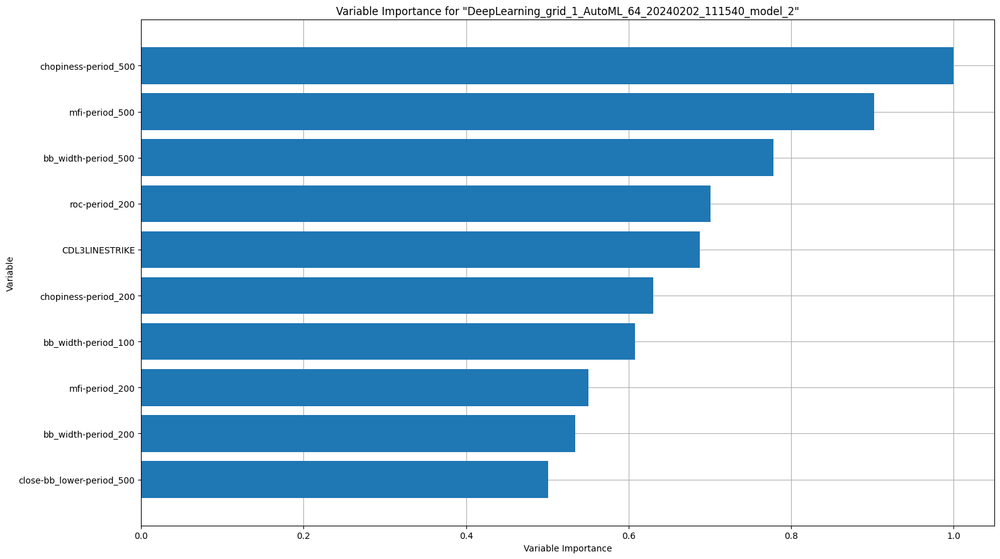

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

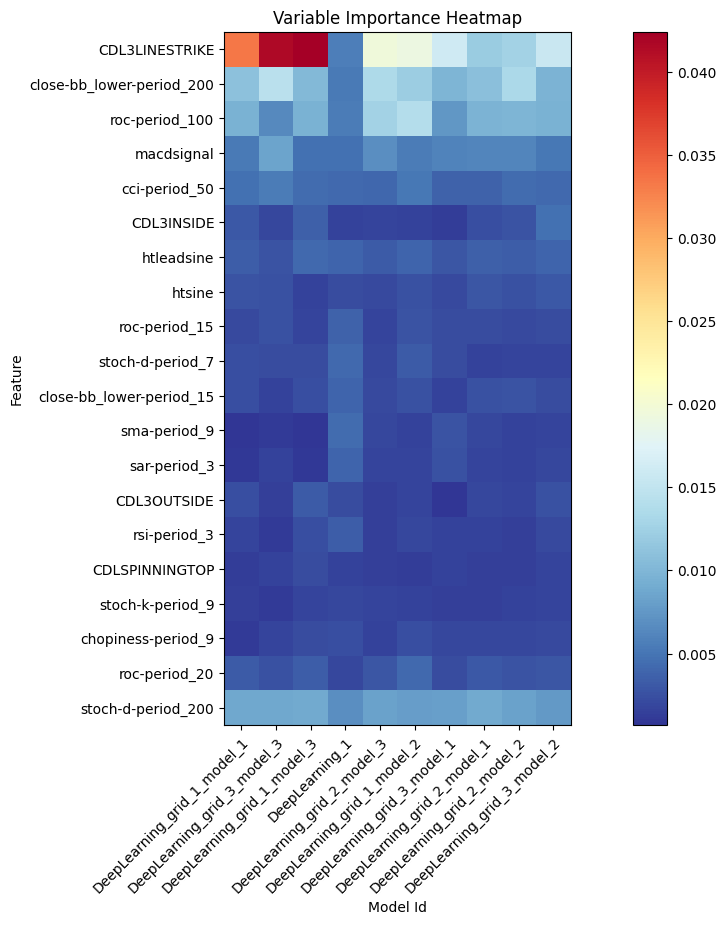

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

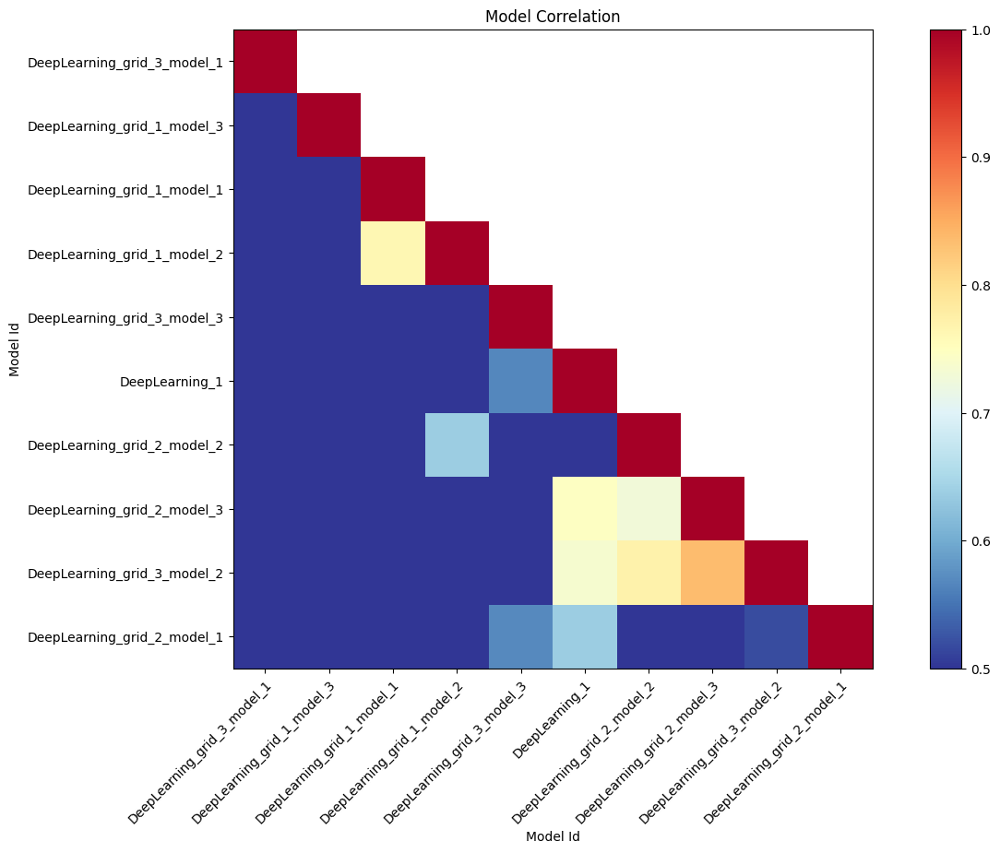

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

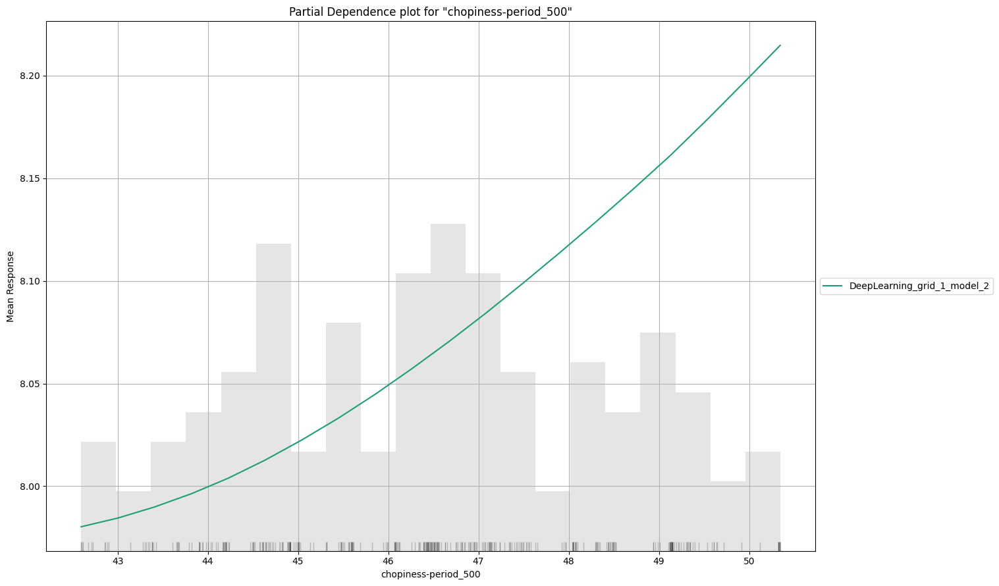

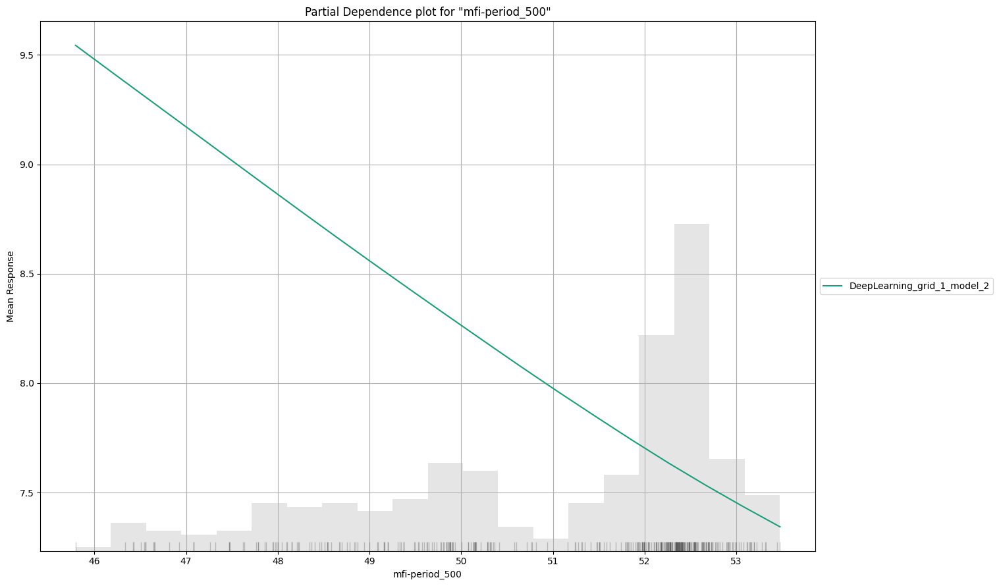

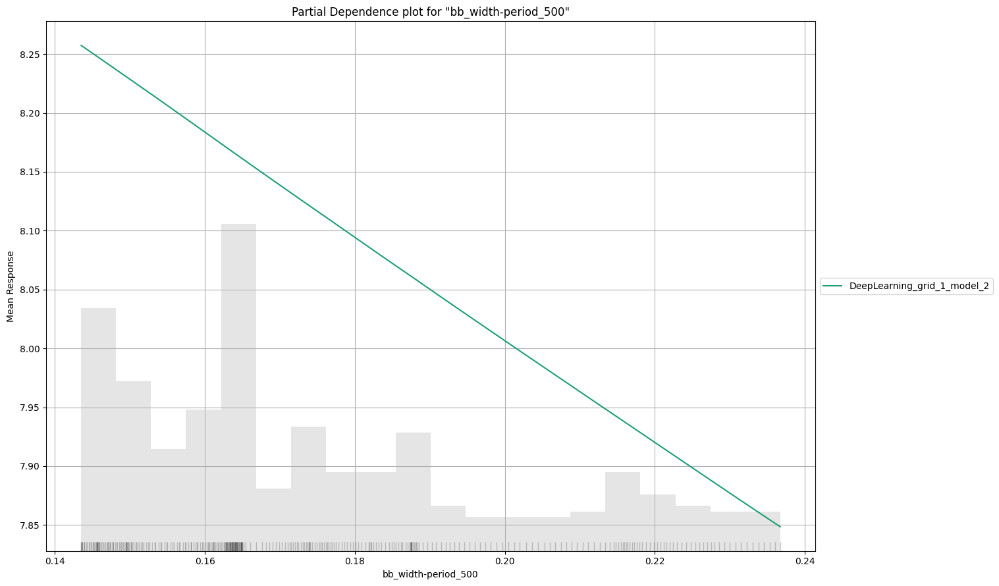

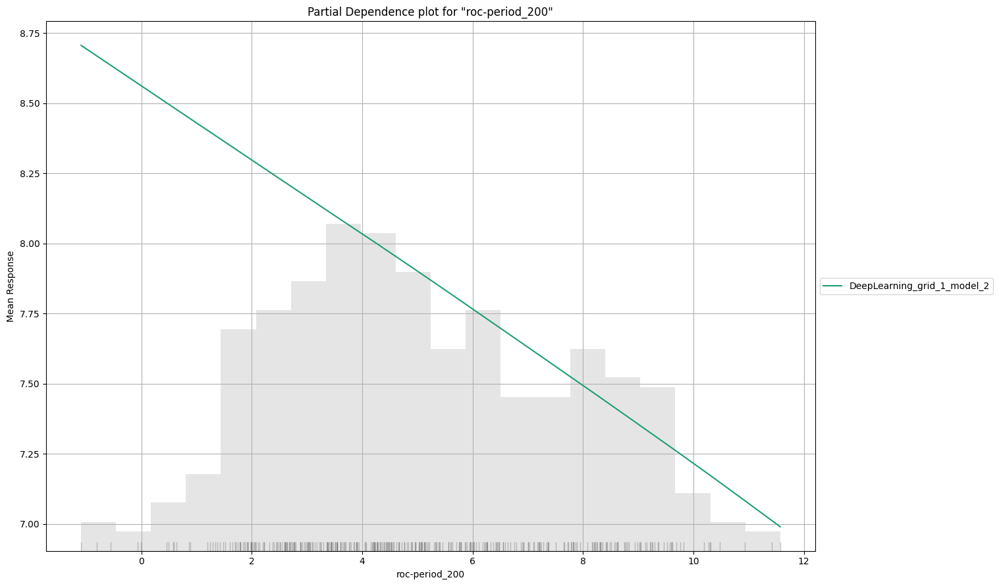

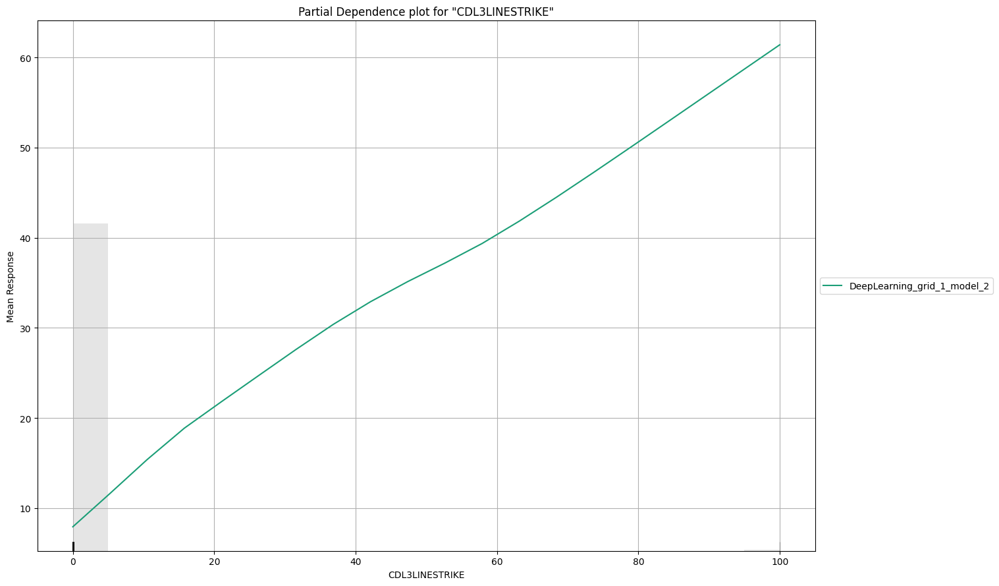

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

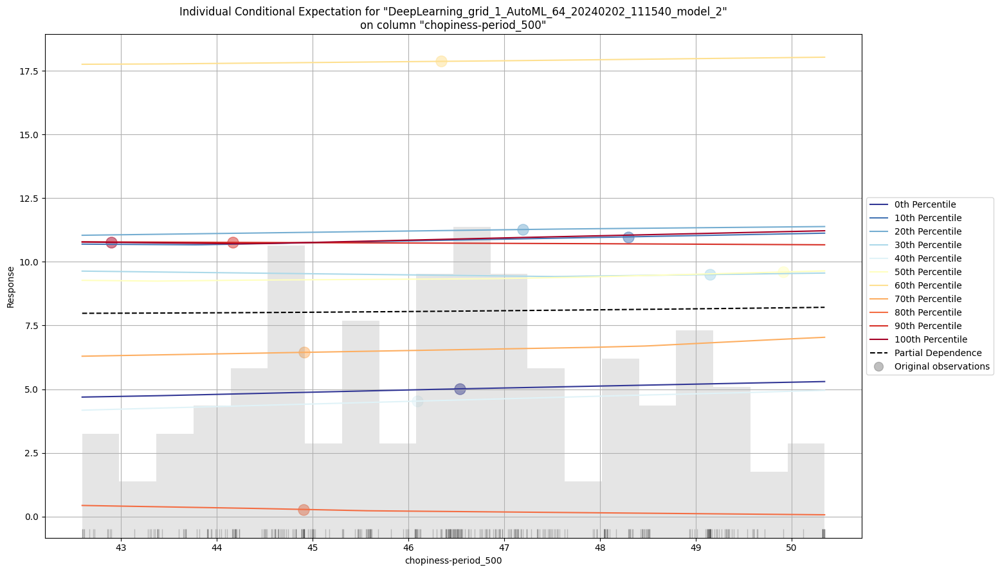

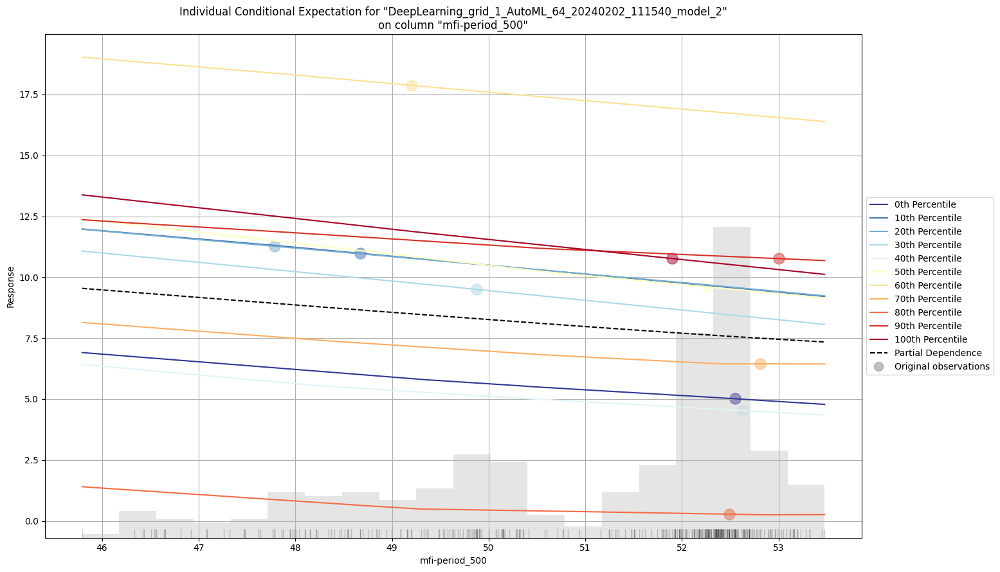

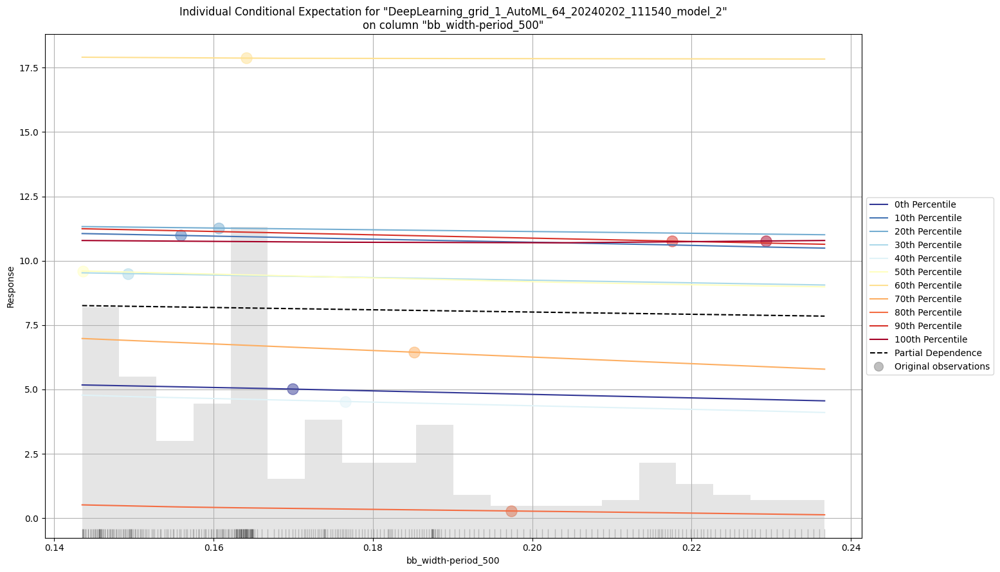

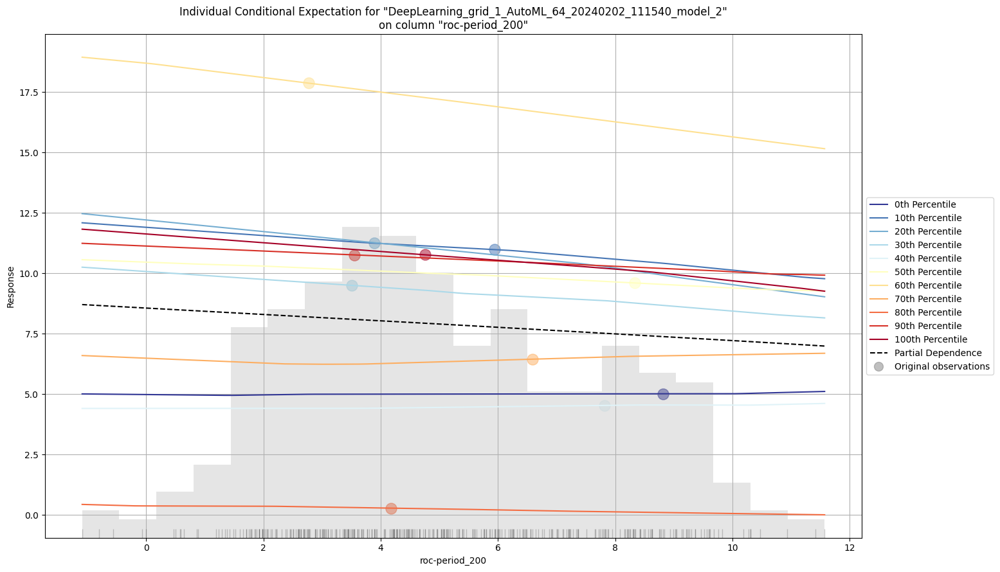

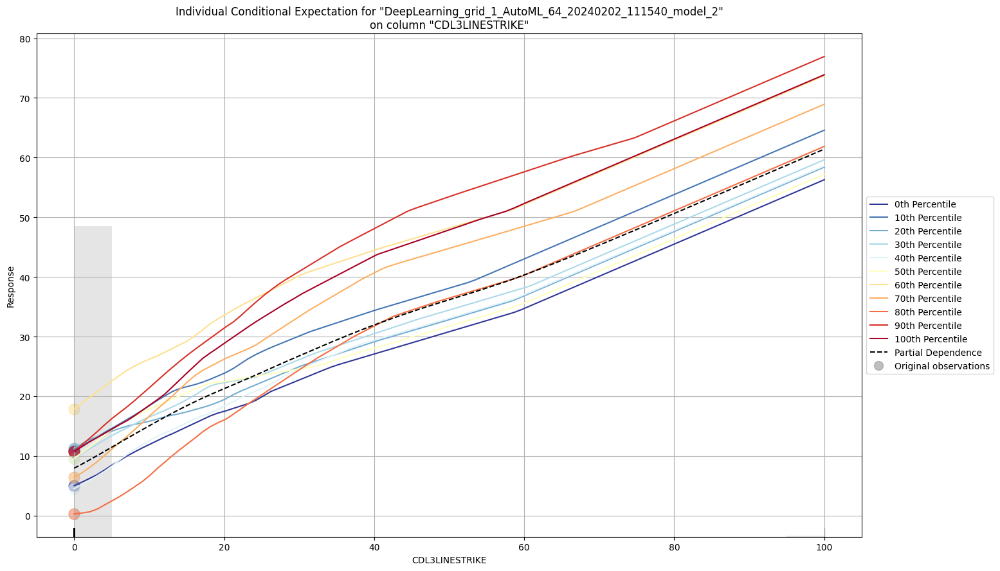



Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


/Users/dad/Library/Python/3.9/lib/python/site-packages/h2o/frame.py:1979: H2ODependencyWarning: converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above).
  warnings.warn("converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


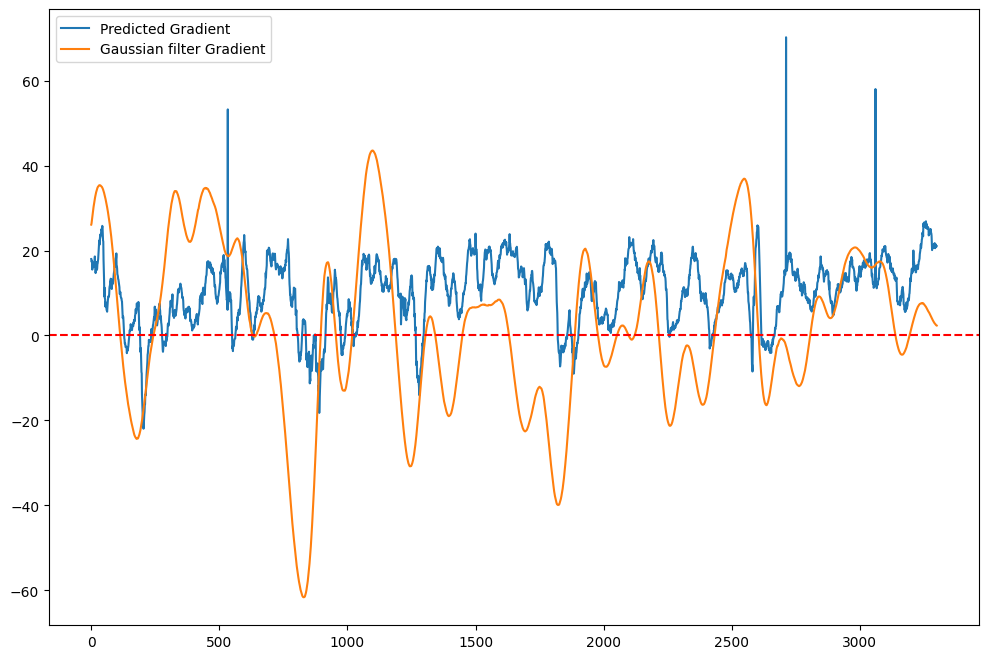

/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_37159/4155402193.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[(predicted_values['extrema'].values == 'sell'), 'exit_max'] = 1
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_37159/4155402193.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[(predicted_values['extrema'].values == 'buy'), 'enter_min'] = 1


Buy signals: 25.0 Sell signals: 25.0 Candles: 3301


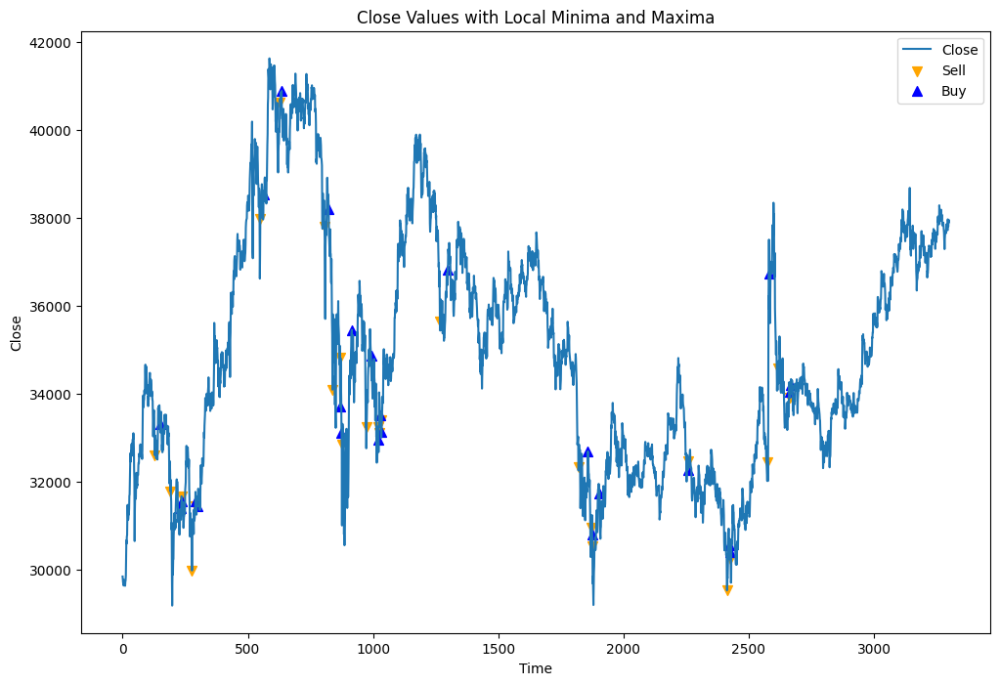

Ending Capital: 866.9447455096478
Total Theoretical Profit: -133.05525449035224
Win Percentage: 33.33333333333333%
Max Drawdown: 51.04364629401289
Max Drawdown Percent: 5.031261934271369
Total Trades: 24
Average Return: -1.323969372138255
Average Return pct: -1.3256373018436387
Sharpe Ratio: -0.19650054142841838
Buy signals: 25.0 Sell signals: 25.0 Candles: 3301
Percent of candles with signal (buy or sell): 1.5146925174189638%


In [ ]:
# 15m gaussian gradient
train_and_evaluate_gradient_model(df_15m[20000:30000], testsize=0.33, kernel_size=201, sigma=3)

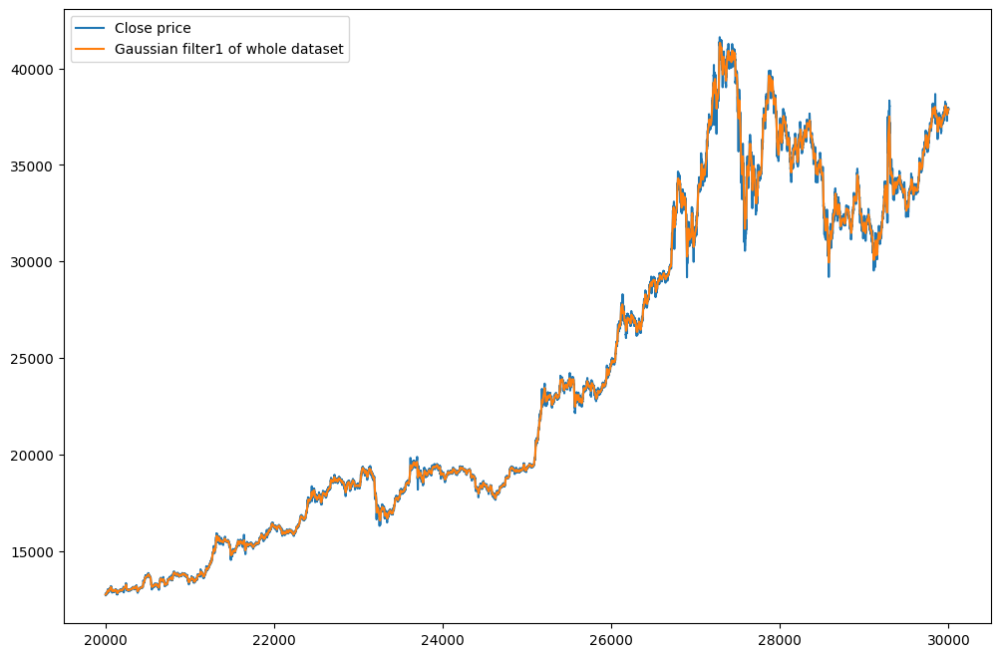

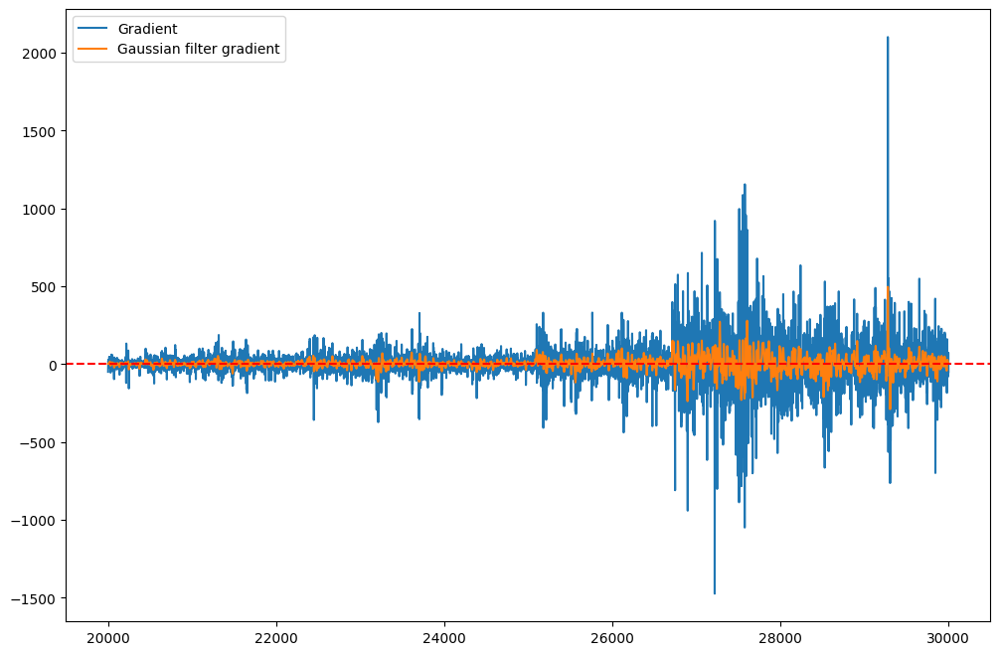

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
16:15:02.732: Fold column fold_numbers will be used for cross-validation. nfolds parameter will be ignored.

███████████████████████████████████████████████████████████████| (done) 100%


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
DeepLearning_1_AutoML_70_20240202_161502,21.5845,465.893,17.0526,nan,465.893,404,0.007141,DeepLearning
DeepLearning_grid_3_AutoML_70_20240202_161502_model_2,22.7418,517.188,17.9987,nan,517.188,30100,0.025654,DeepLearning
DeepLearning_grid_3_AutoML_70_20240202_161502_model_3,24.3886,594.805,19.3143,nan,594.805,31571,0.015782,DeepLearning
DeepLearning_grid_2_AutoML_70_20240202_161502_model_2,24.9009,620.057,19.7101,nan,620.057,35859,0.020163,DeepLearning
DeepLearning_grid_1_AutoML_70_20240202_161502_model_1,25.3162,640.911,20.2841,nan,640.911,37607,0.010031,DeepLearning
DeepLearning_grid_3_AutoML_70_20240202_161502_model_1,25.5808,654.376,20.3823,nan,654.376,37596,0.069394,DeepLearning
DeepLearning_grid_2_AutoML_70_20240202_161502_model_3,27.2869,744.573,22.4124,nan,744.573,28969,0.012158,DeepLearning
DeepLearning_grid_2_AutoML_70_20240202_161502_model_1,27.4199,751.853,22.4625,nan,751.853,40434,0.013458,DeepLearning
DeepLearning_grid_1_AutoML_70_20240202_161502_model_2,30.59,935.745,24.6102,nan,935.745,41878,0.022289,DeepLearning
DeepLearning_grid_1_AutoML_70_20240202_161502_model_3,40.4342,1634.93,31.3203,nan,1634.93,48028,0.015381,DeepLearning


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

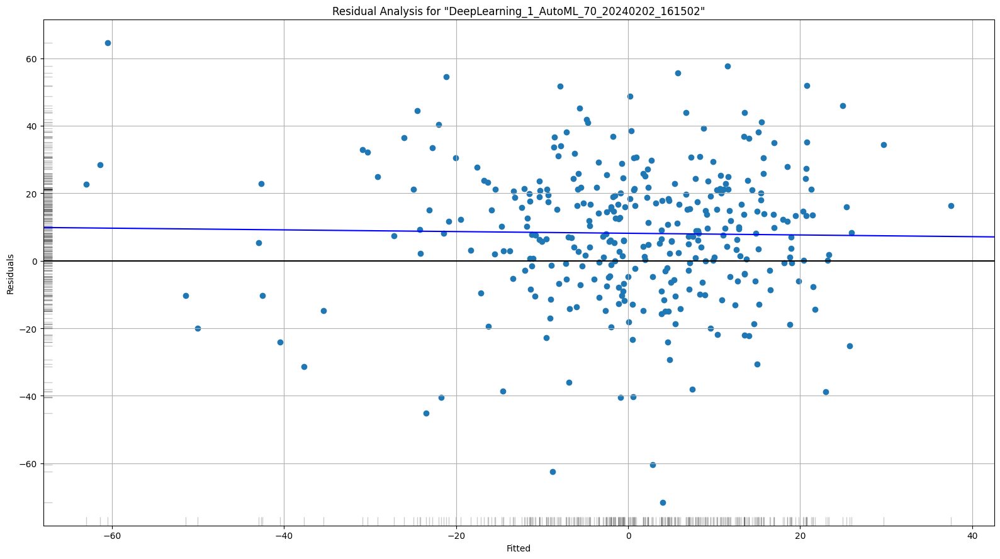

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

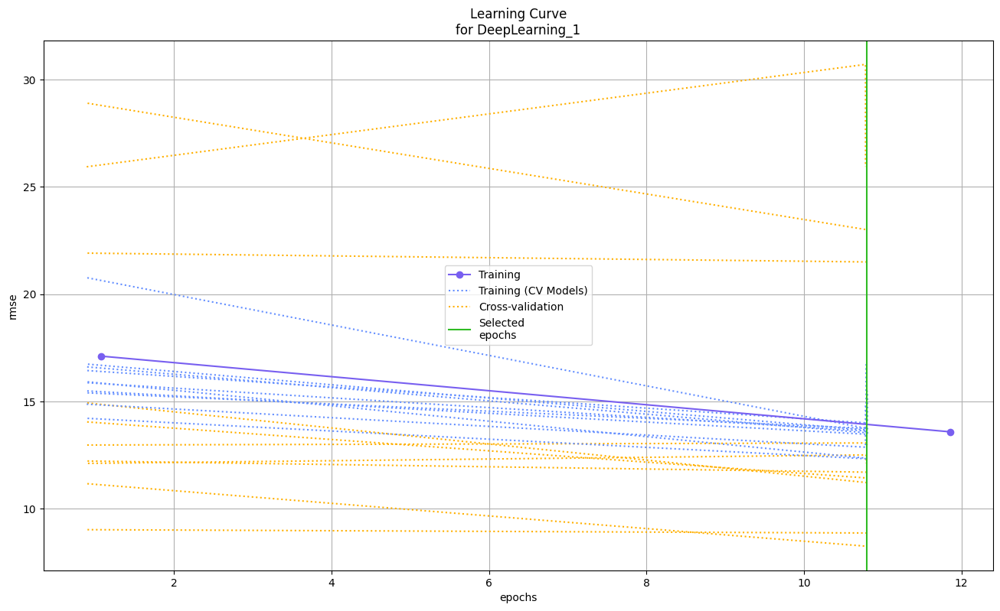

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

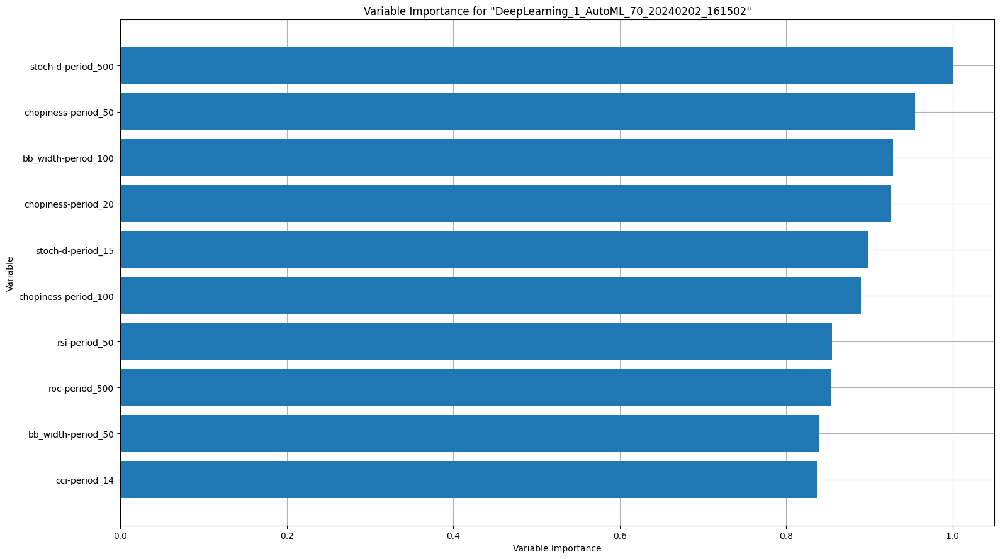

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

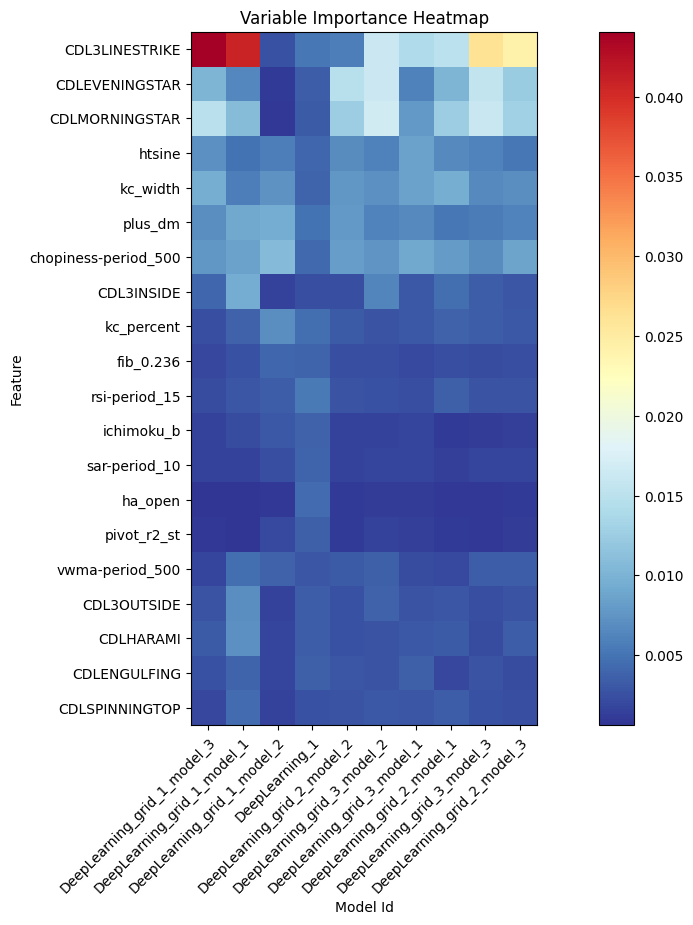

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

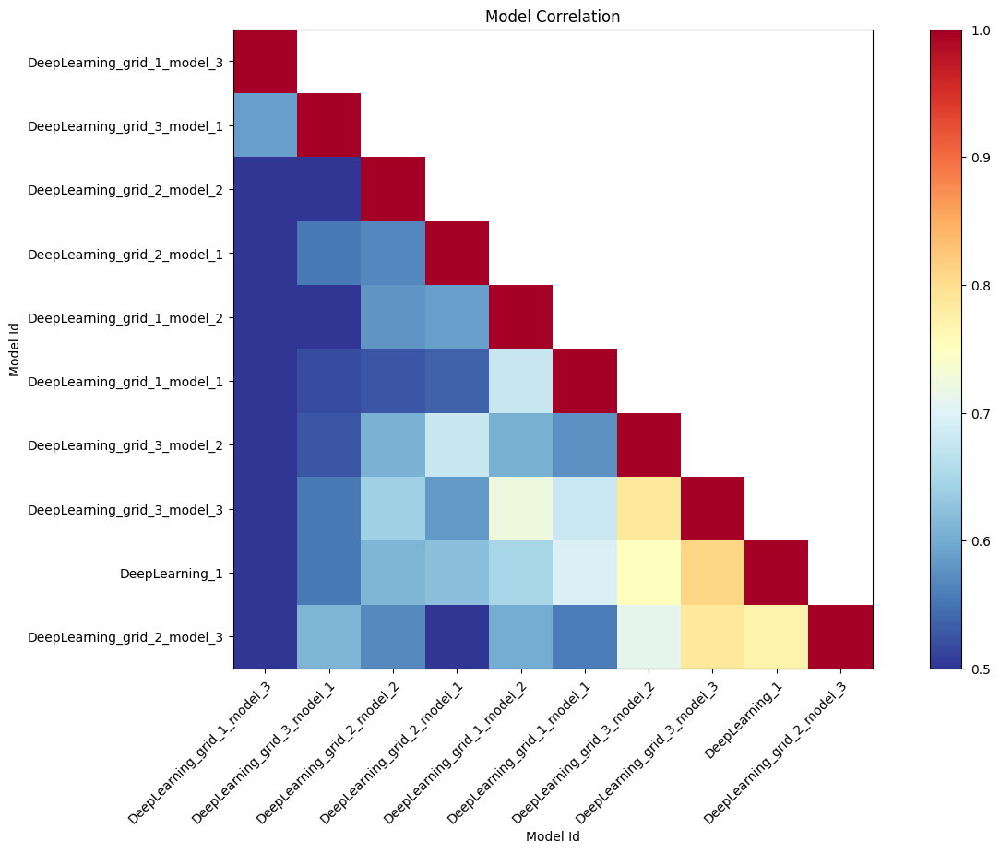

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

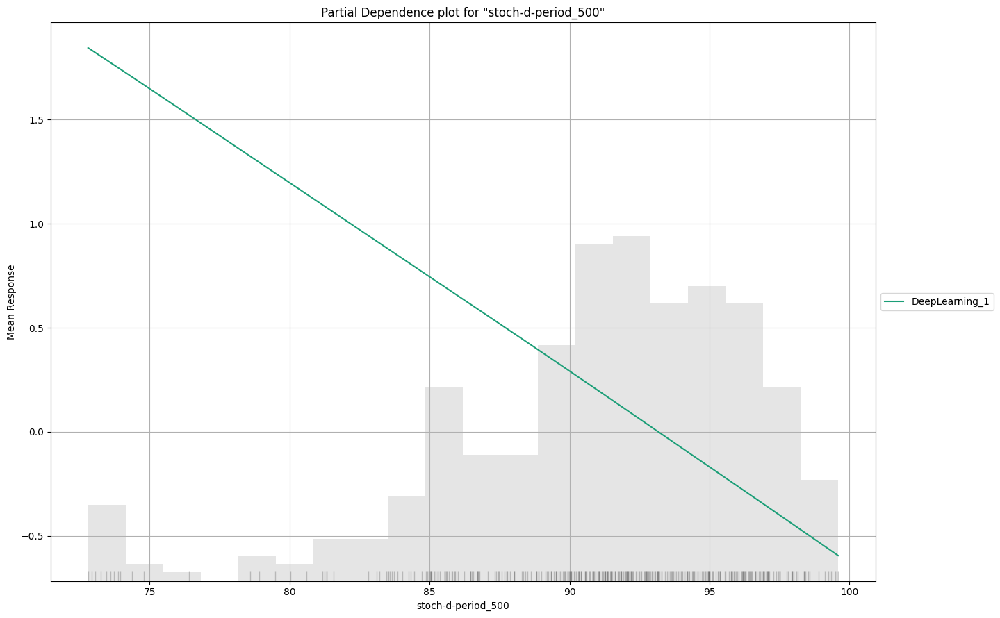

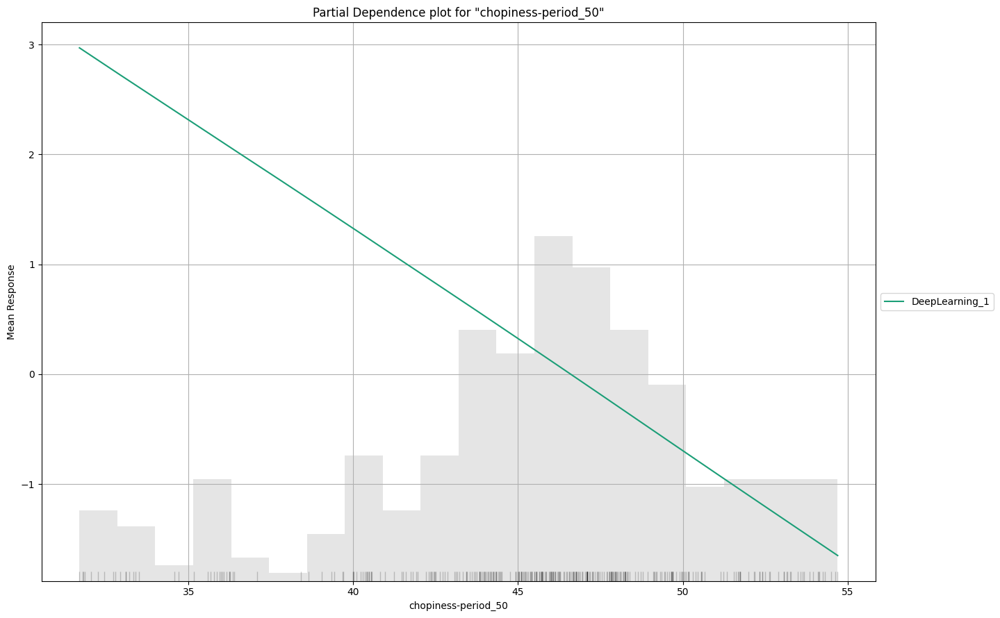

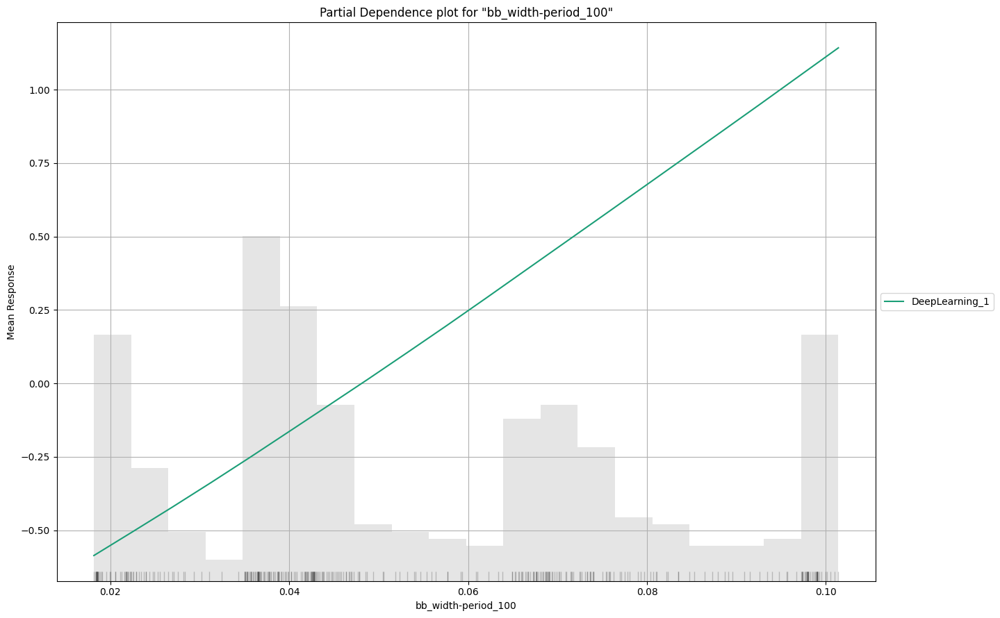

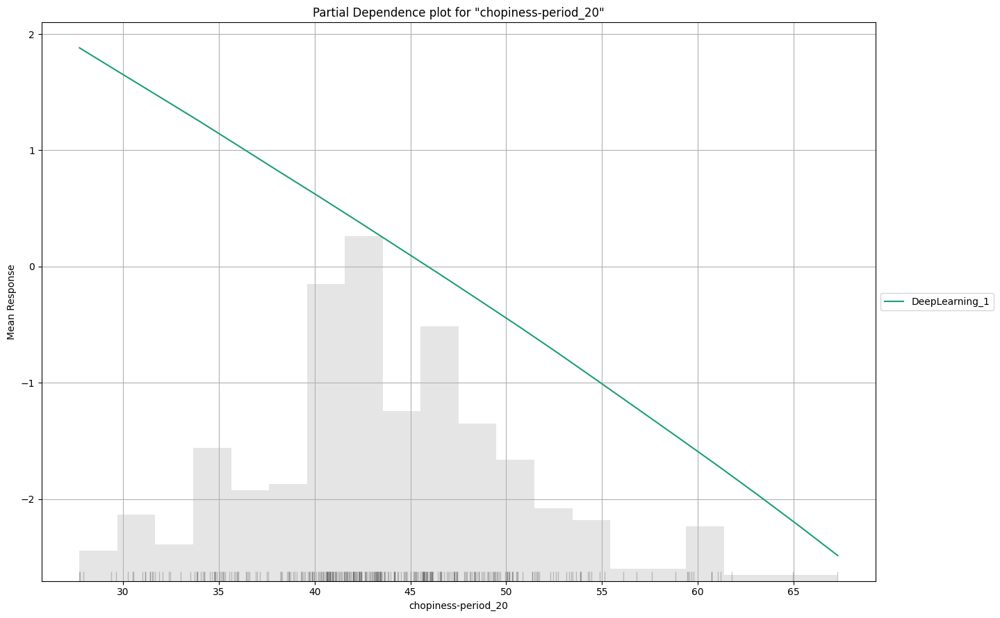

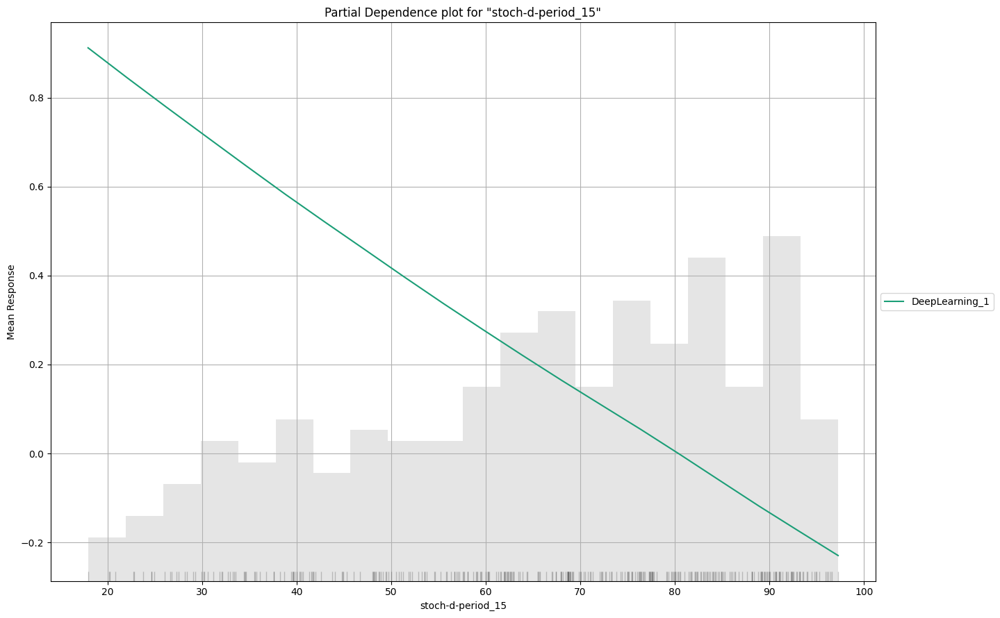

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

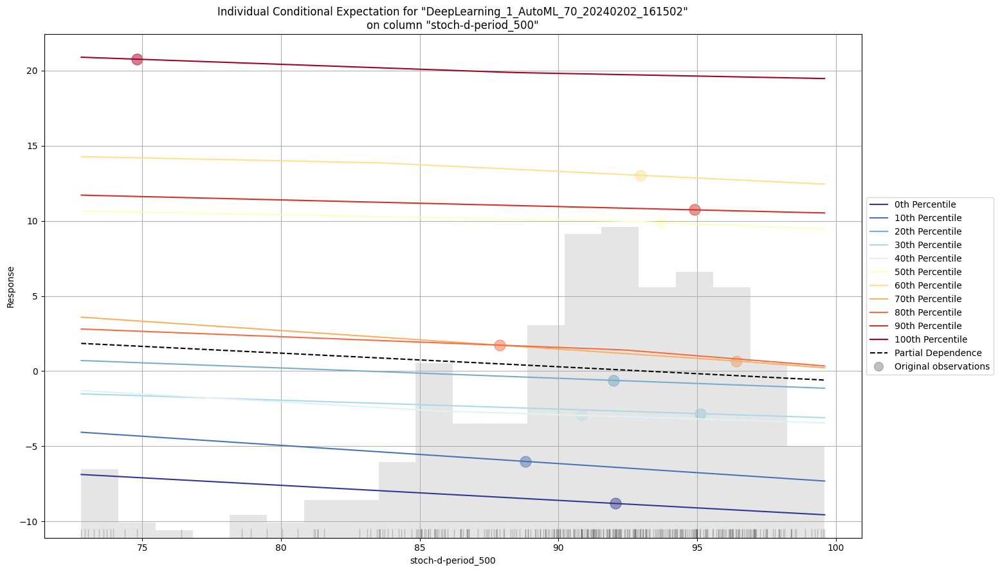

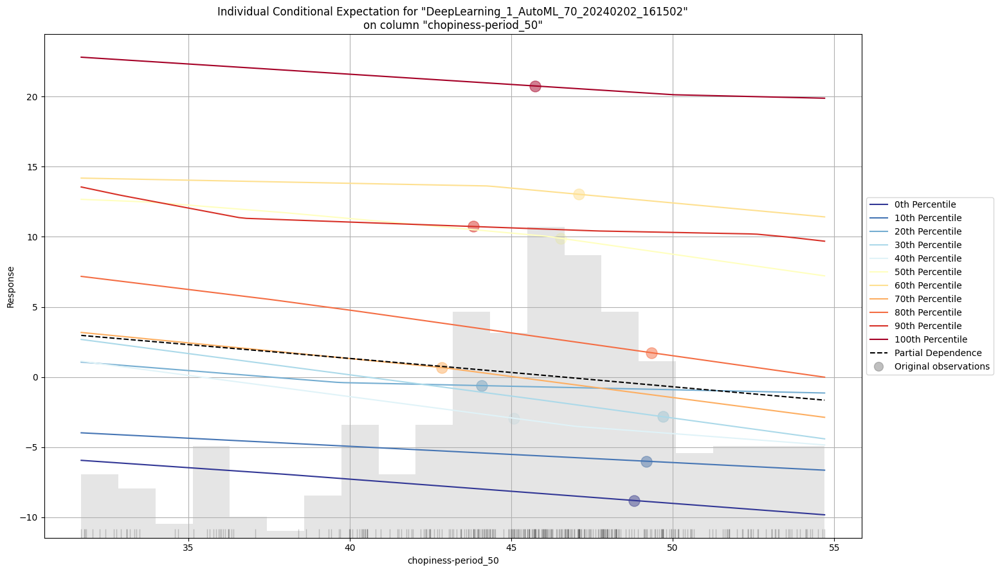

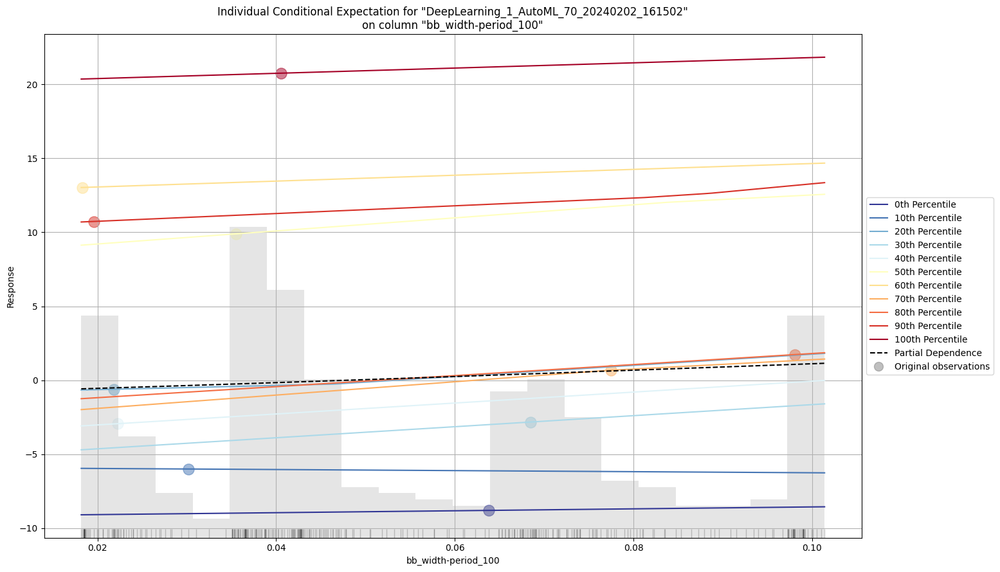

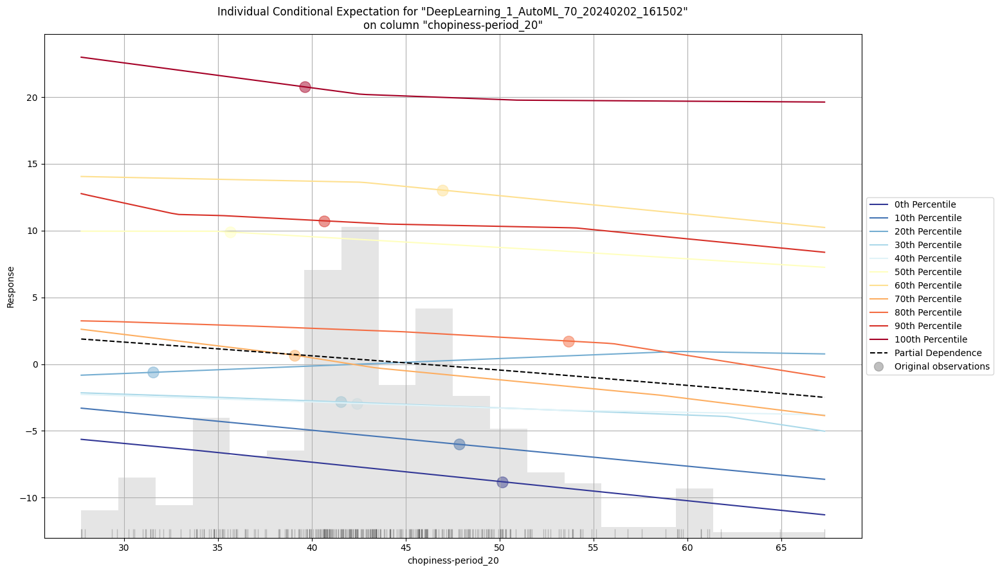

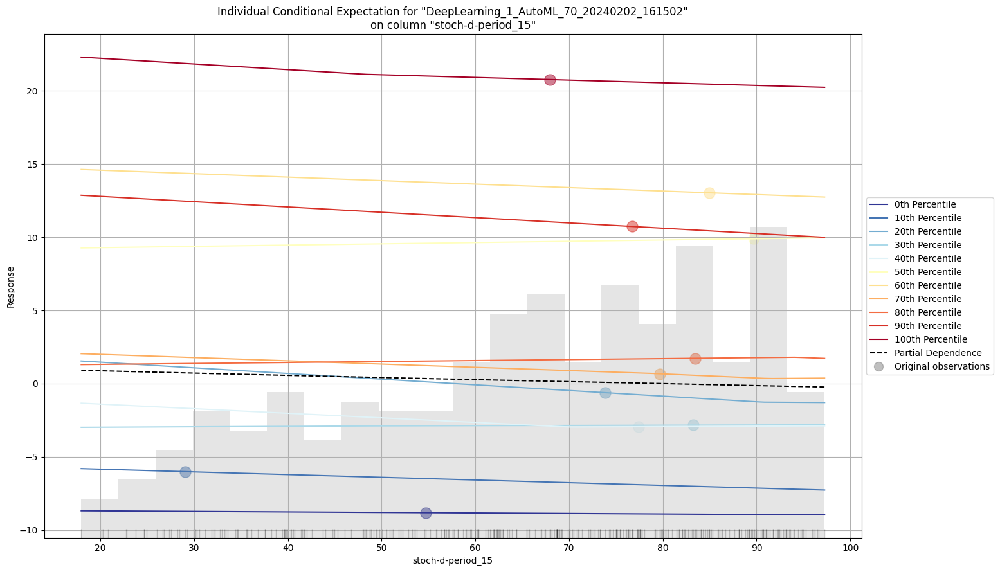



Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


/Users/dad/Library/Python/3.9/lib/python/site-packages/h2o/frame.py:1979: H2ODependencyWarning: converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above).
  warnings.warn("converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


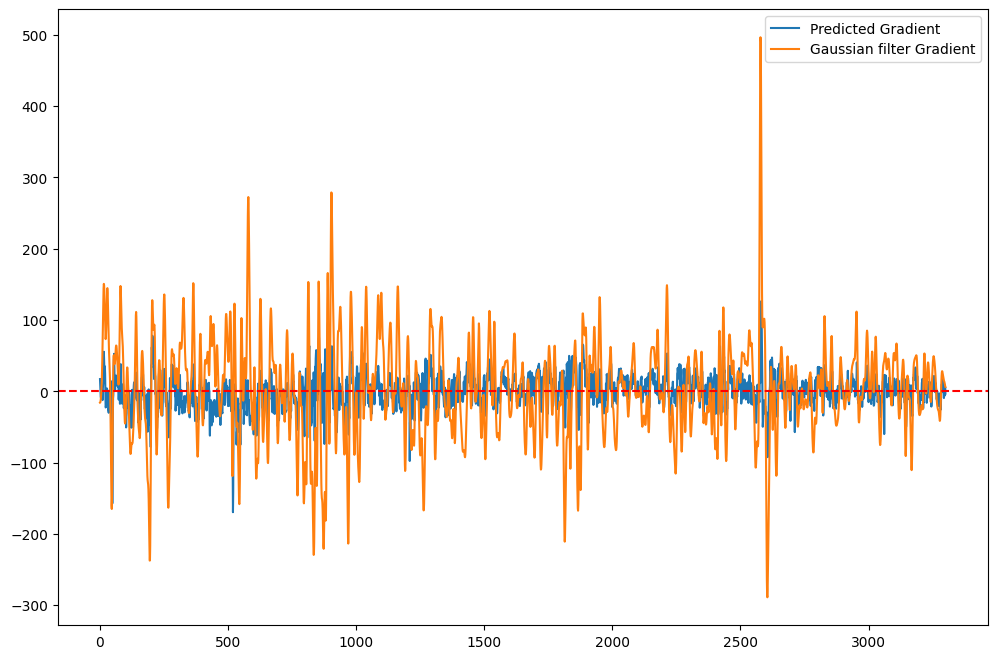

/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_37159/4155402193.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[(predicted_values['extrema'].values == 'sell'), 'exit_max'] = 1
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_37159/4155402193.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[(predicted_values['extrema'].values == 'buy'), 'enter_min'] = 1


Buy signals: 317.0 Sell signals: 318.0 Candles: 3301


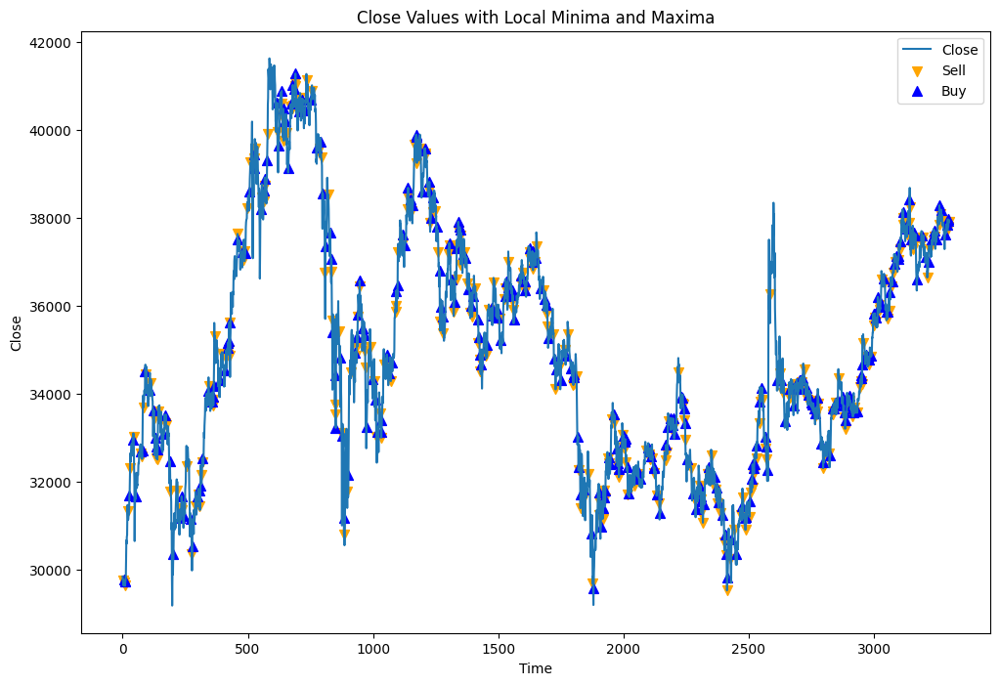

Ending Capital: 903.9719931476311
Total Theoretical Profit: -96.02800685236889
Win Percentage: 33.4384858044164%
Max Drawdown: 107.17883057825975
Max Drawdown Percent: 10.599687807534686
Total Trades: 317
Average Return: -0.11125405017179275
Average Return pct: -0.11674213232905573
Sharpe Ratio: -0.06261739345870047
Buy signals: 317.0 Sell signals: 318.0 Candles: 3301
Percent of candles with signal (buy or sell): 19.236594971220843%


In [ ]:
# 15m gaussian gradient
train_and_evaluate_gradient_model(df_15m[20000:30000], testsize=0.33, kernel_size=21, sigma=3)

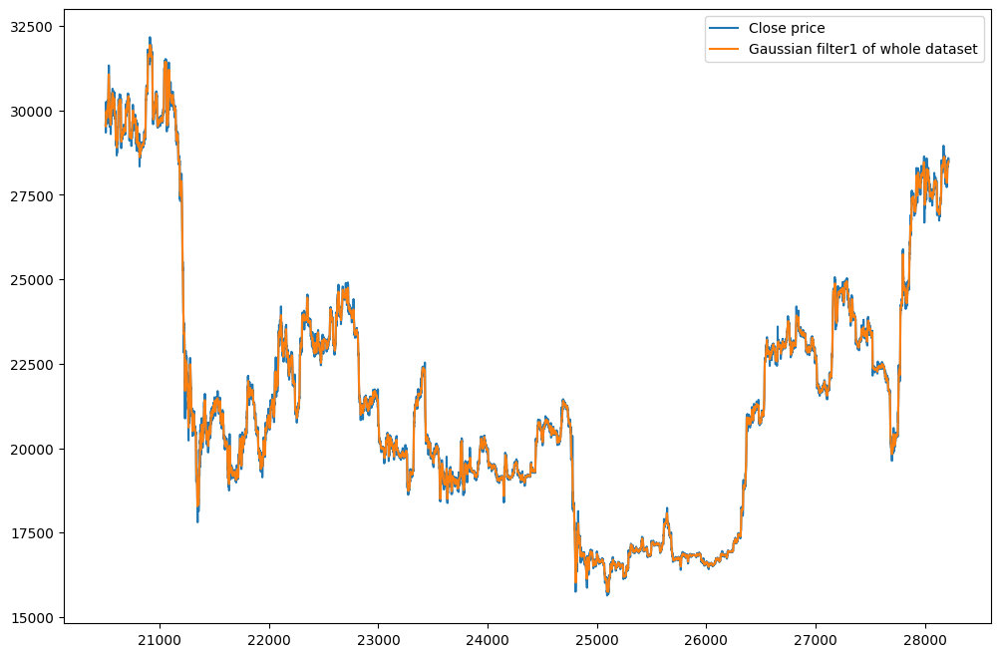

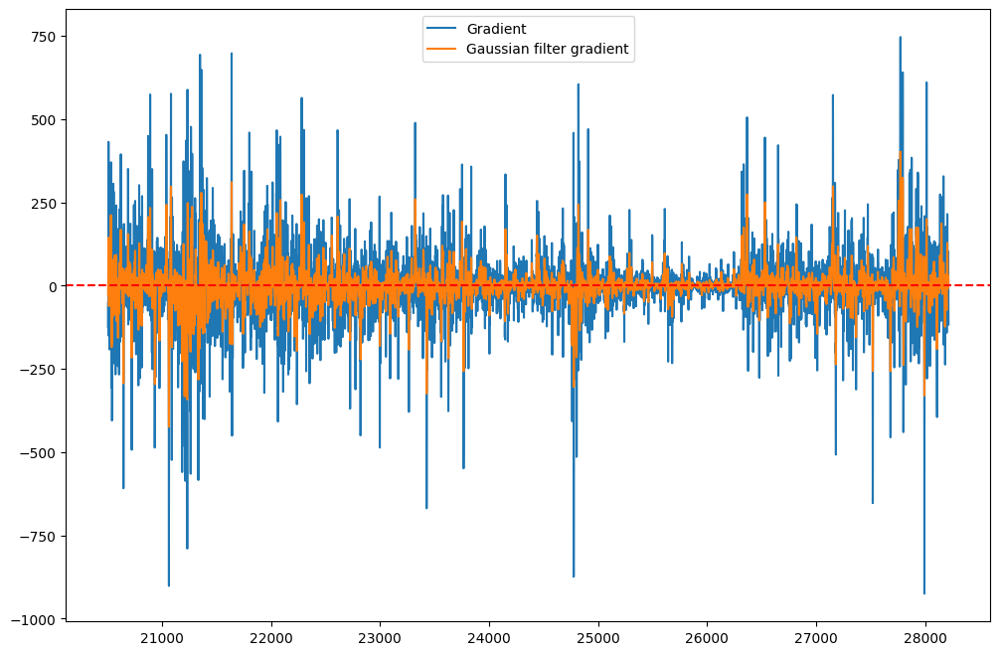

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
15:13:50.634: Fold column fold_numbers will be used for cross-validation. nfolds parameter will be ignored.

███████████████████████████████████████████████████████████████| (done) 100%


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
DeepLearning_grid_3_AutoML_69_20240202_151350_model_2,17.7391,314.675,10.9462,nan,314.675,42364,0.031877,DeepLearning
DeepLearning_1_AutoML_69_20240202_151350,18.9783,360.176,12.9585,nan,360.176,271,0.012606,DeepLearning
DeepLearning_grid_2_AutoML_69_20240202_151350_model_3,20.4186,416.921,13.143,nan,416.921,29994,0.046162,DeepLearning
DeepLearning_grid_3_AutoML_69_20240202_151350_model_3,20.8336,434.04,13.3649,nan,434.04,37841,0.076112,DeepLearning
DeepLearning_grid_2_AutoML_69_20240202_151350_model_2,21.0559,443.351,13.1822,nan,443.351,27854,0.016056,DeepLearning
DeepLearning_grid_3_AutoML_69_20240202_151350_model_1,23.1664,536.68,16.7586,nan,536.68,56237,0.026951,DeepLearning
DeepLearning_grid_1_AutoML_69_20240202_151350_model_1,24.6385,607.054,15.913,nan,607.054,39834,0.02122,DeepLearning
DeepLearning_grid_1_AutoML_69_20240202_151350_model_2,28.3719,804.964,21.6672,nan,804.964,42429,0.029756,DeepLearning
DeepLearning_grid_2_AutoML_69_20240202_151350_model_1,33.4618,1119.69,24.3023,nan,1119.69,40517,0.008603,DeepLearning
DeepLearning_grid_1_AutoML_69_20240202_151350_model_3,44.1023,1945.02,17.4642,nan,1945.02,30327,0.026812,DeepLearning


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

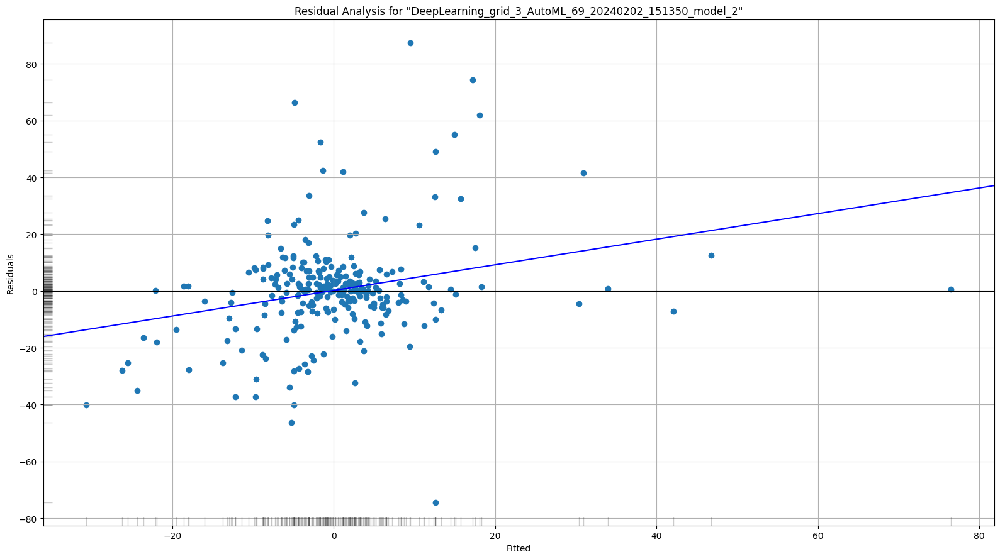

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

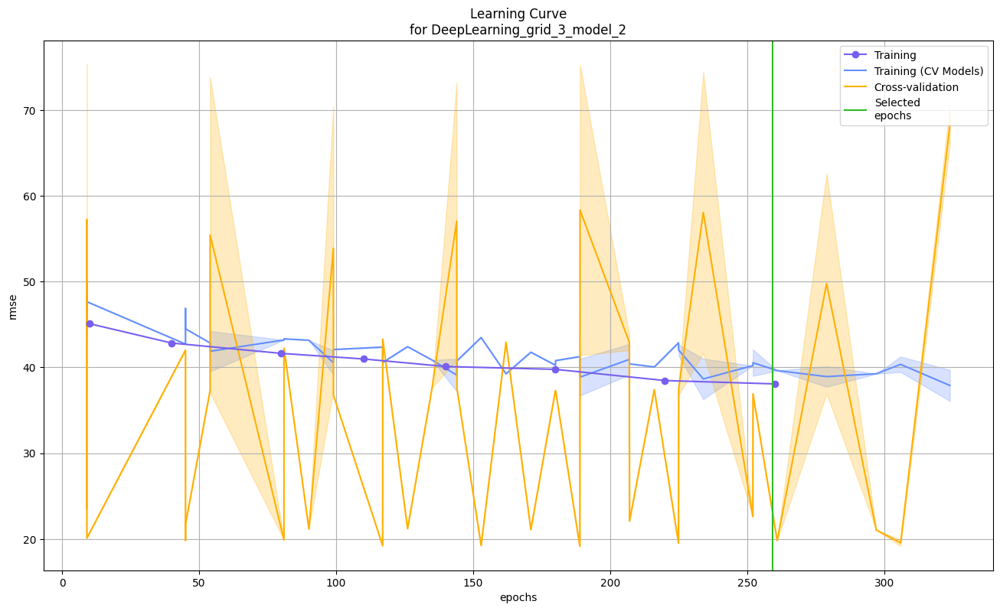

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

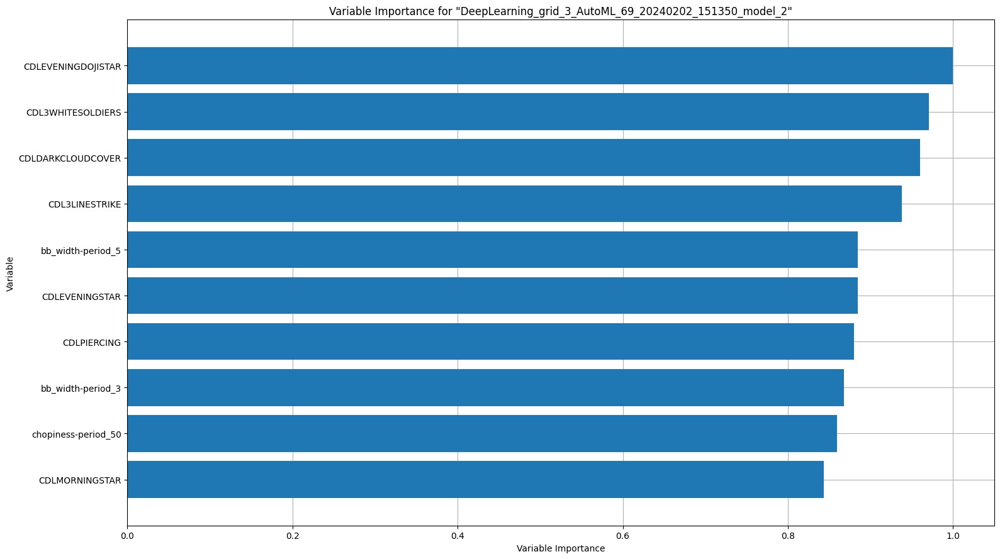

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

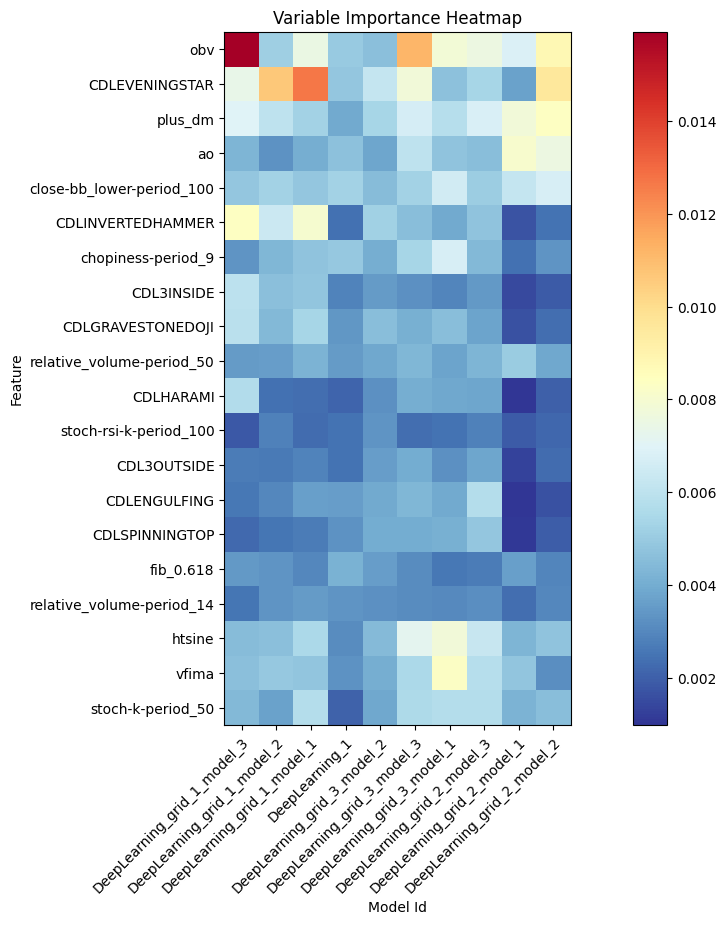

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

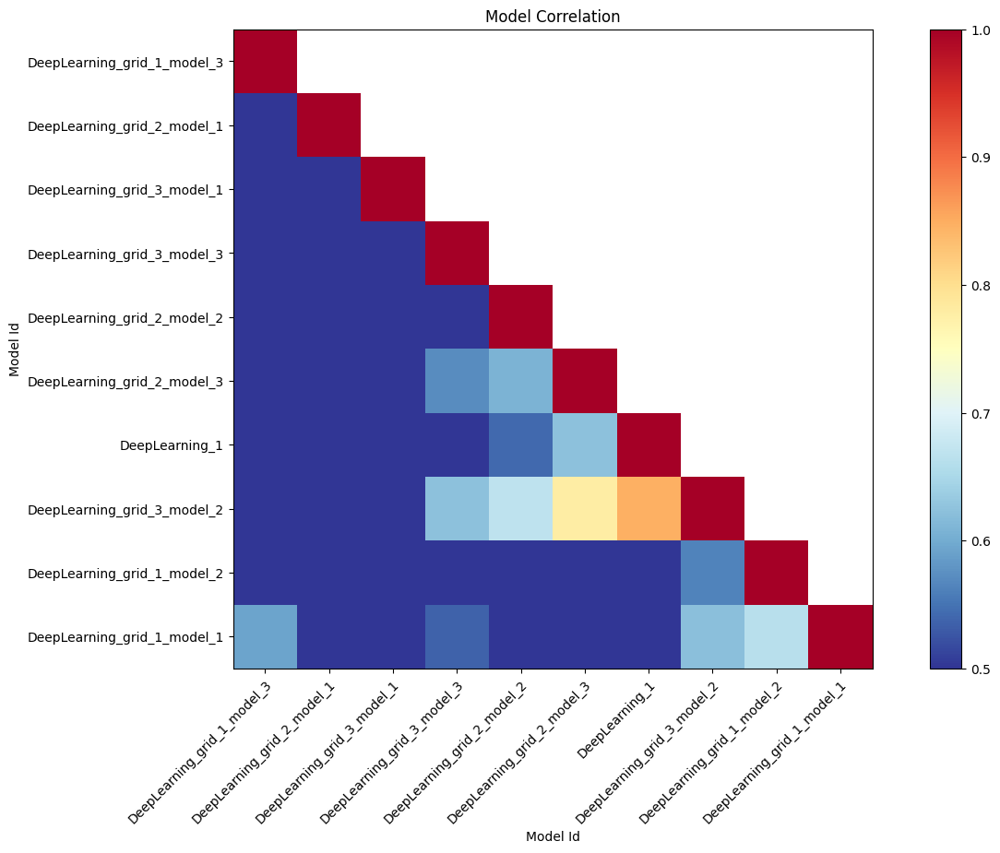

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

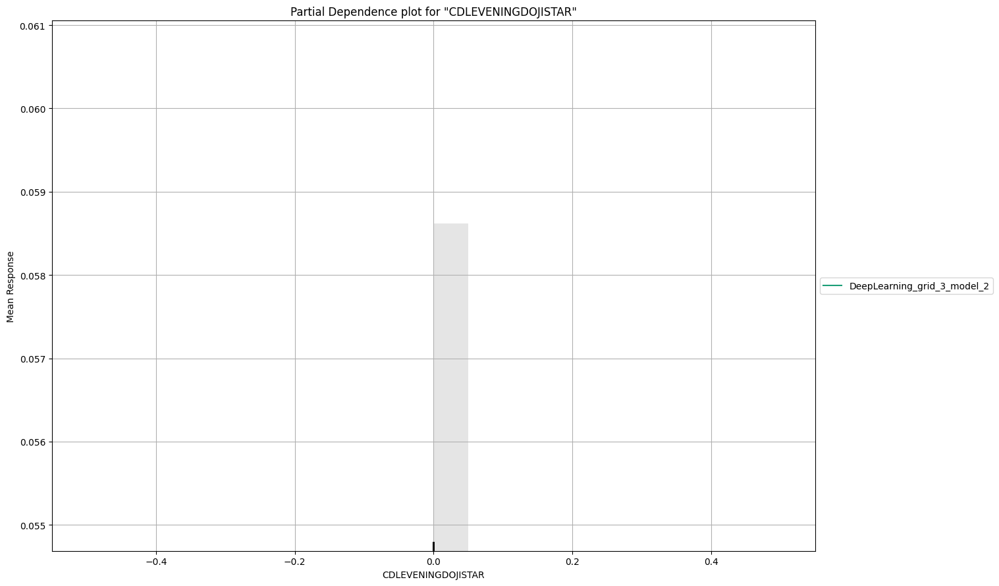

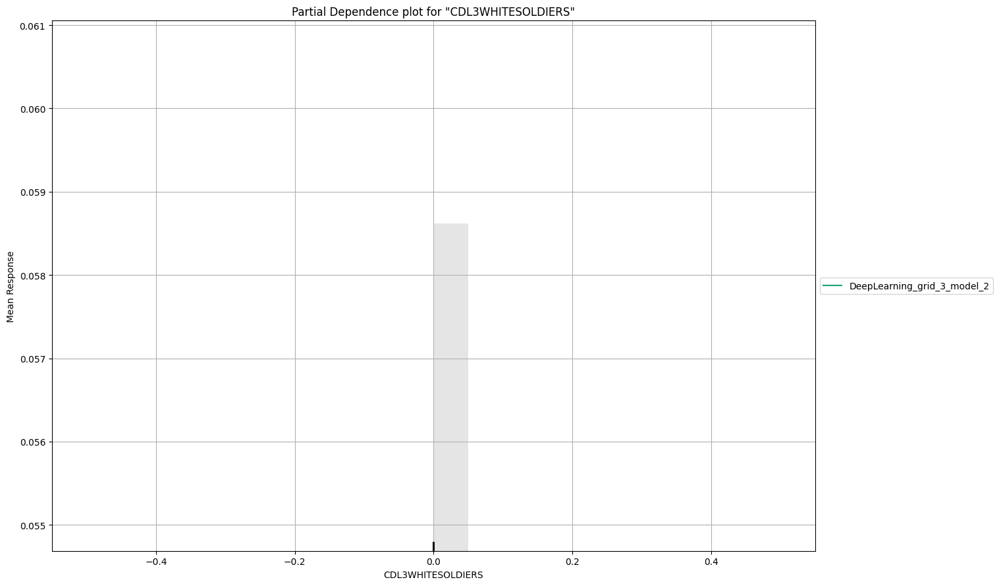

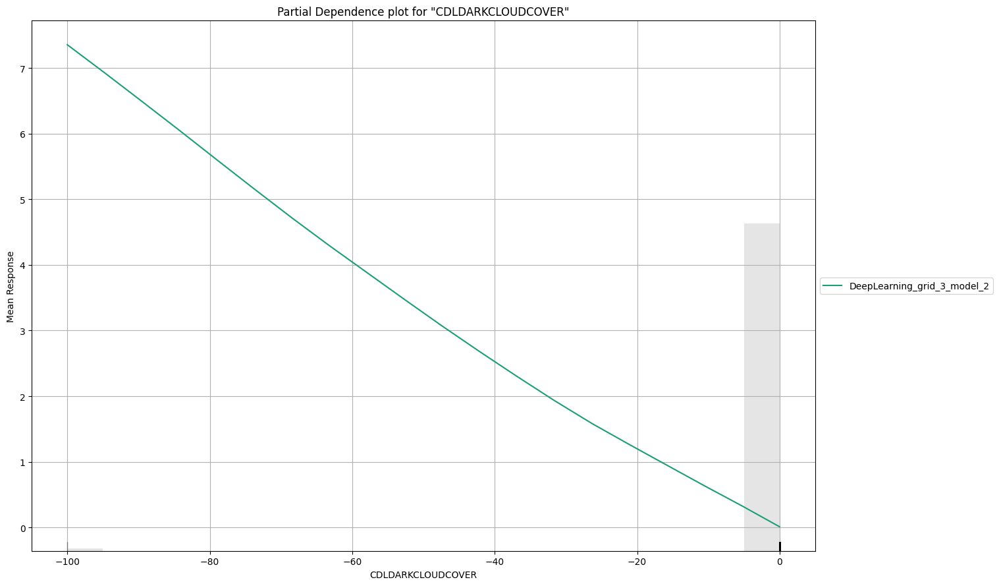

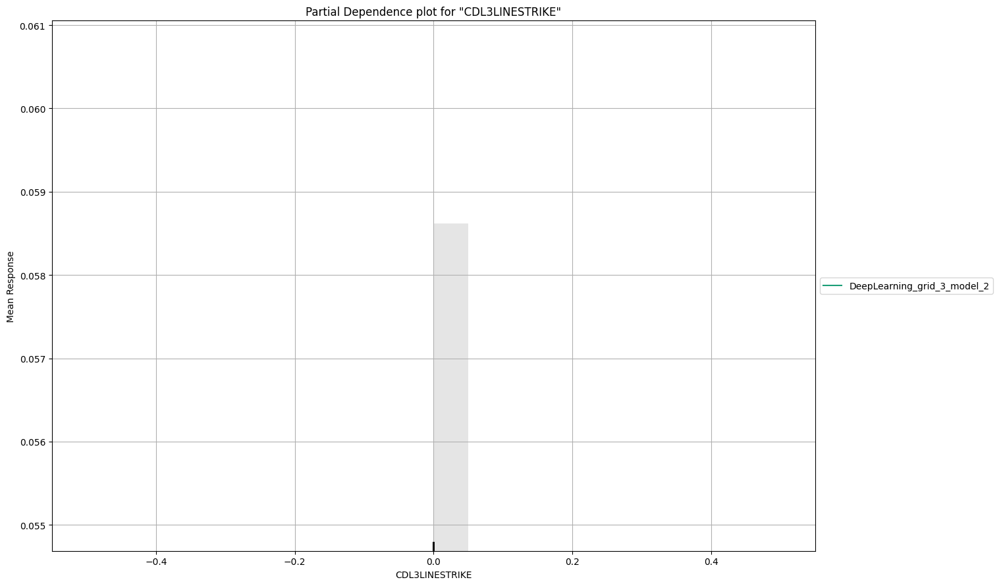

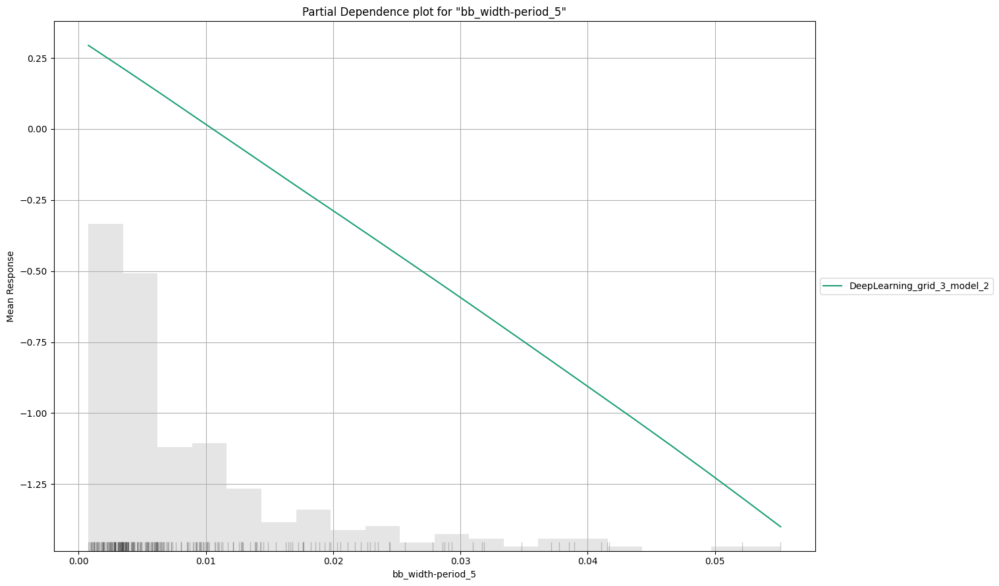

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

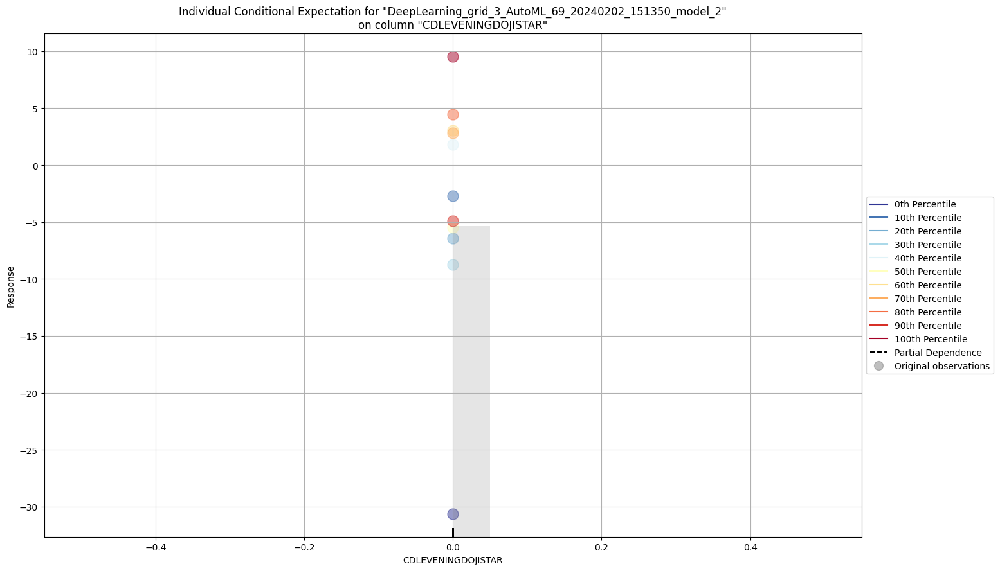

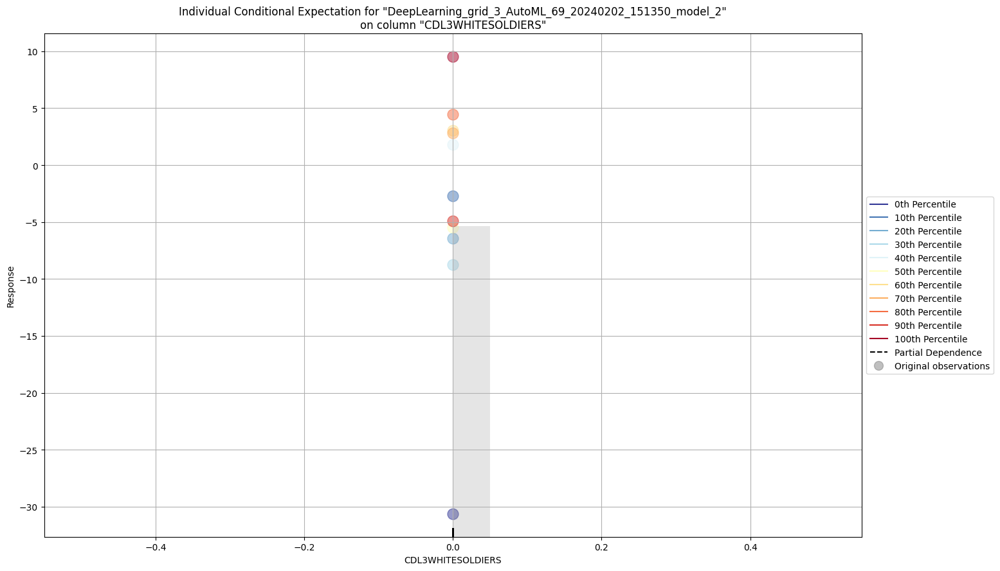

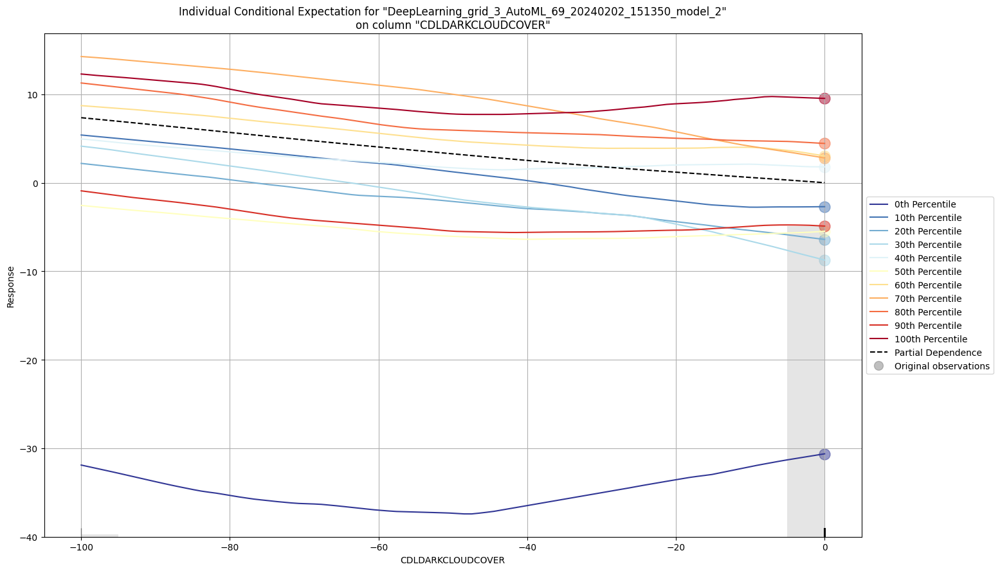

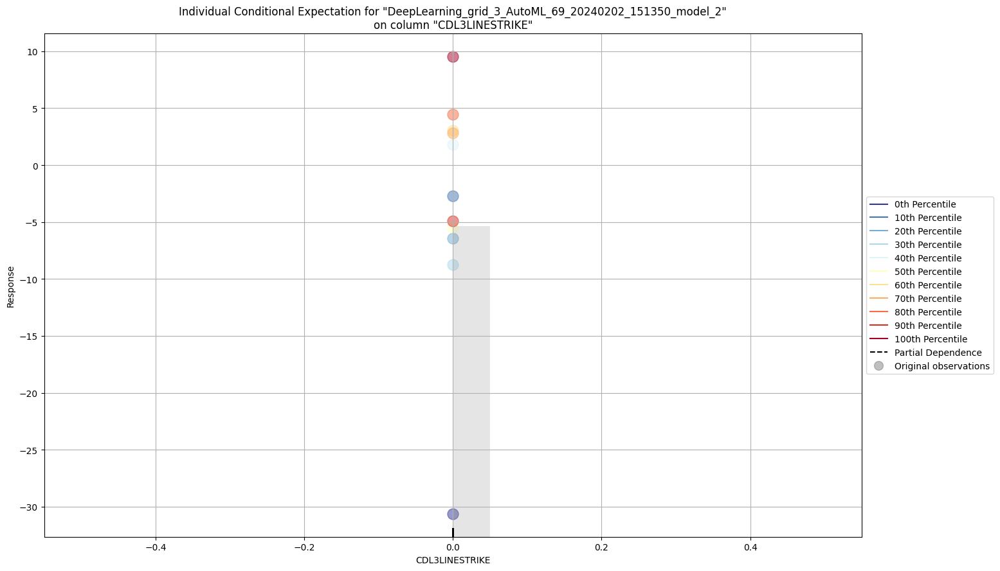

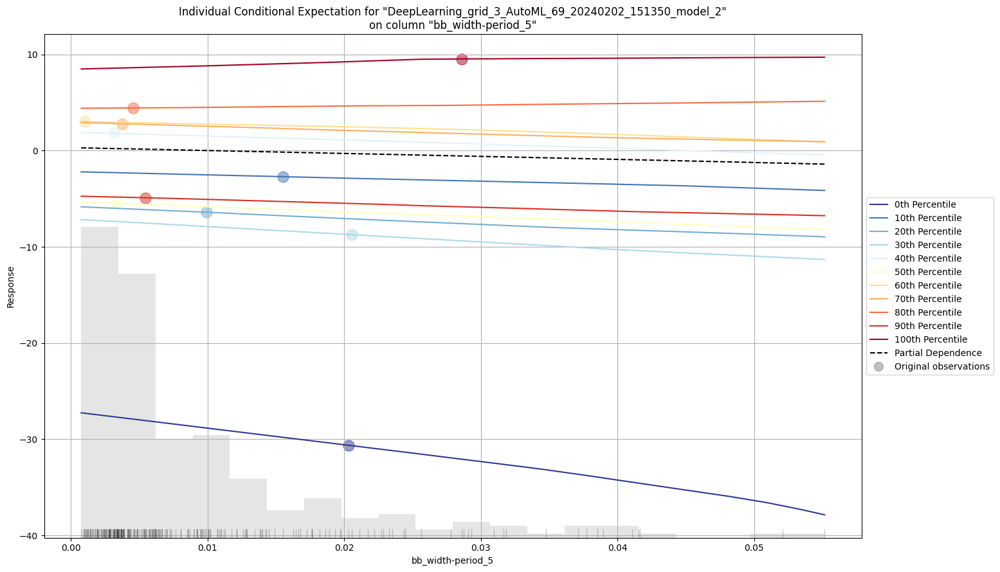



Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


/Users/dad/Library/Python/3.9/lib/python/site-packages/h2o/frame.py:1979: H2ODependencyWarning: converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above).
  warnings.warn("converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


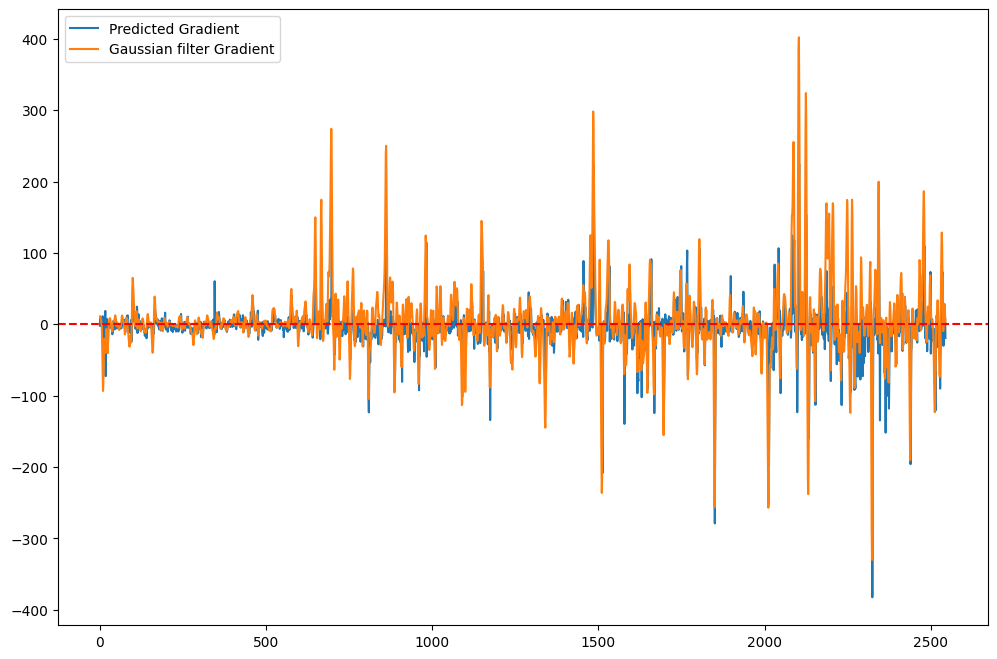

Buy signals: 347.0 Sell signals: 347.0 Candles: 2545


/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_37159/4155402193.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[(predicted_values['extrema'].values == 'sell'), 'exit_max'] = 1
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_37159/4155402193.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[(predicted_values['extrema'].values == 'buy'), 'enter_min'] = 1


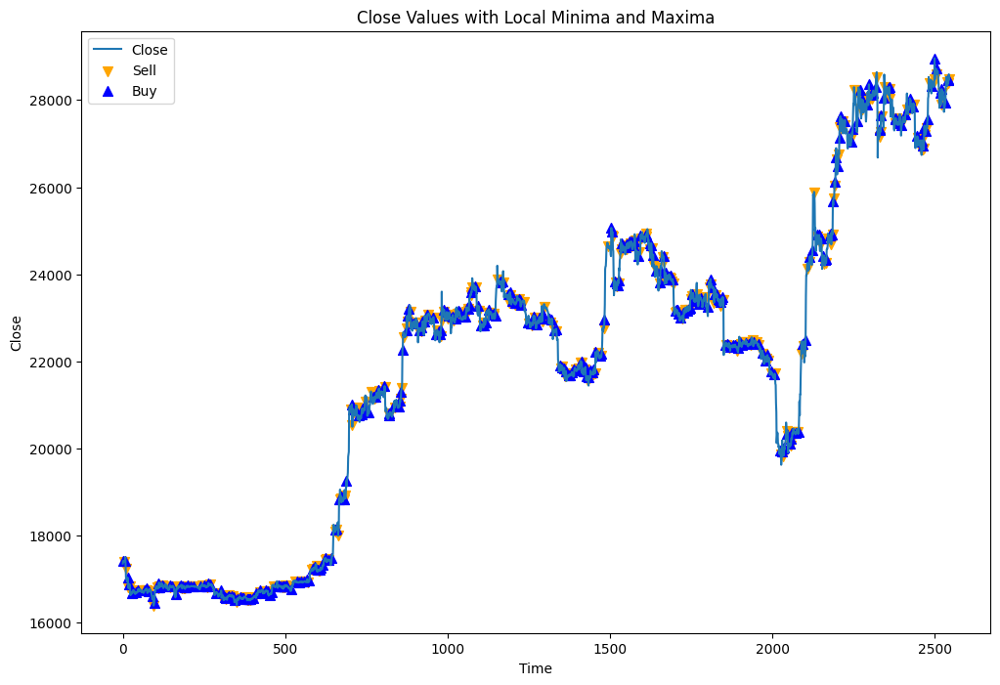

Ending Capital: 899.3596981791817
Total Theoretical Profit: -100.64030182081831
Win Percentage: 19.020172910662826%
Max Drawdown: 100.85719962904682
Max Drawdown Percent: 10.085719962904683
Total Trades: 347
Average Return: -0.10109571724145956
Average Return pct: -0.10501490409647334
Sharpe Ratio: -0.09706082404884946
Buy signals: 347.0 Sell signals: 347.0 Candles: 2545
Percent of candles with signal (buy or sell): 27.26915520628684%


In [ ]:
# 15m gaussian gradient
train_and_evaluate_gradient_model(df_15m_order2[20000:30000], testsize=0.33, kernel_size=11, sigma=3)

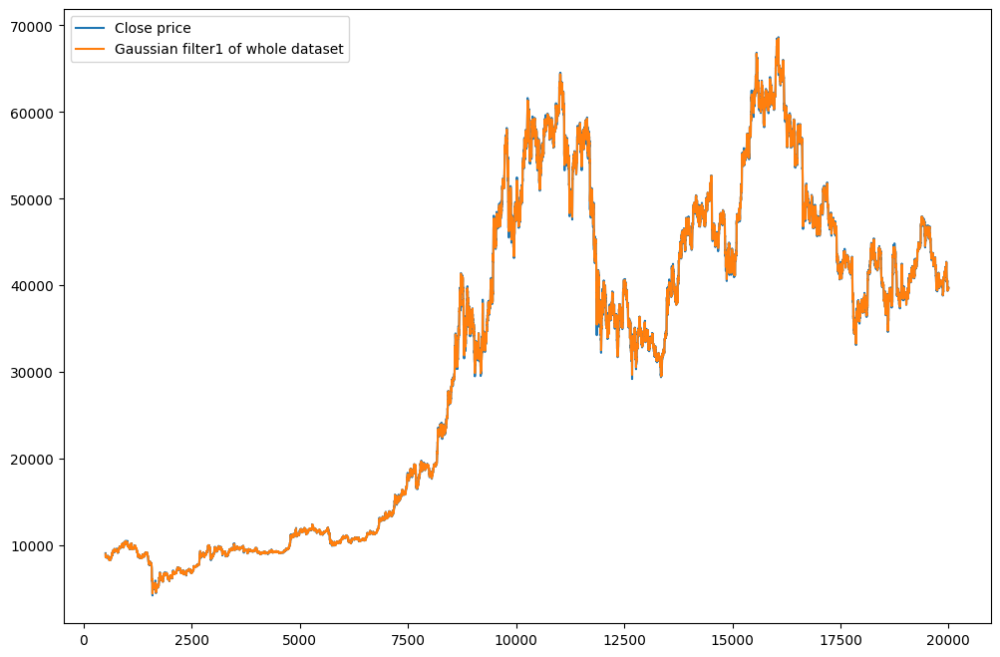

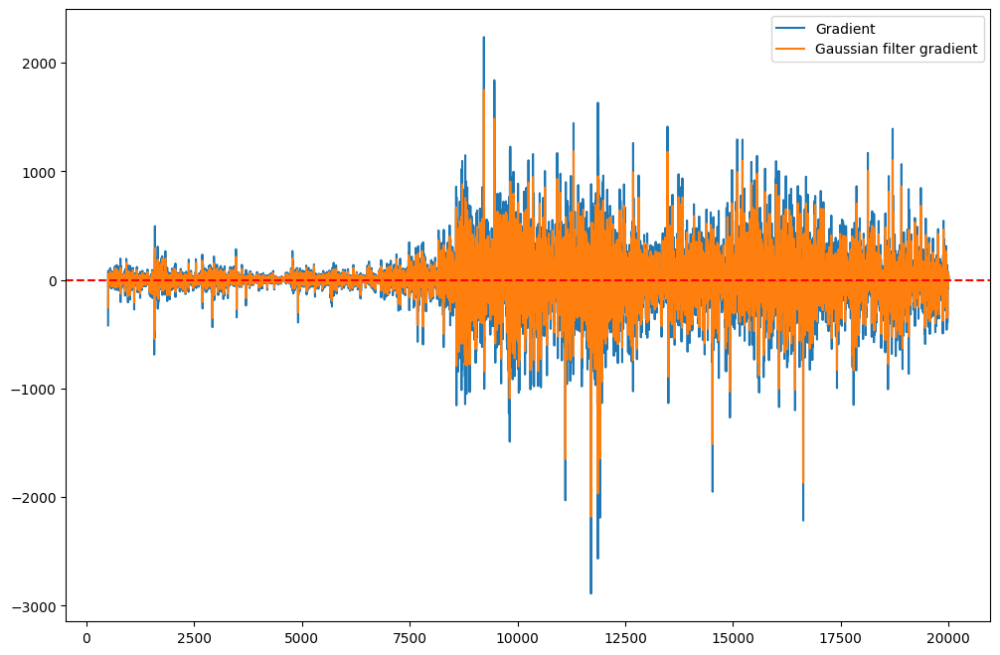

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
17:13:55.743: Fold column fold_numbers will be used for cross-validation. nfolds parameter will be ignored.

███████████████████████████████████████████████████████████████| (done) 100%


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
DeepLearning_1_AutoML_71_20240202_171355,112.421,12638.4,75.615,nan,12638.4,1880,0.025509,DeepLearning
DeepLearning_grid_3_AutoML_71_20240202_171355_model_1,120.509,14522.4,77.9881,nan,14522.4,41409,0.010873,DeepLearning
DeepLearning_grid_1_AutoML_71_20240202_171355_model_1,123.122,15159.1,87.4884,nan,15159.1,39671,0.021405,DeepLearning
DeepLearning_grid_3_AutoML_71_20240202_171355_model_2,124.032,15384,78.9567,nan,15384,38505,0.018699,DeepLearning
DeepLearning_grid_2_AutoML_71_20240202_171355_model_2,129.19,16690,86.4694,nan,16690,41102,0.026528,DeepLearning
DeepLearning_grid_2_AutoML_71_20240202_171355_model_1,129.213,16695.9,86.6515,nan,16695.9,39293,0.015317,DeepLearning
DeepLearning_grid_3_AutoML_71_20240202_171355_model_3,130.078,16920.2,84.8138,nan,16920.2,51820,0.045401,DeepLearning
DeepLearning_grid_2_AutoML_71_20240202_171355_model_3,131.021,17166.5,85.9774,nan,17166.5,39338,0.047639,DeepLearning
DeepLearning_grid_1_AutoML_71_20240202_171355_model_2,152.141,23146.8,110.884,nan,23146.8,41943,0.042523,DeepLearning
DeepLearning_grid_1_AutoML_71_20240202_171355_model_3,192.211,36944.9,110.143,nan,36944.9,38988,0.017267,DeepLearning


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

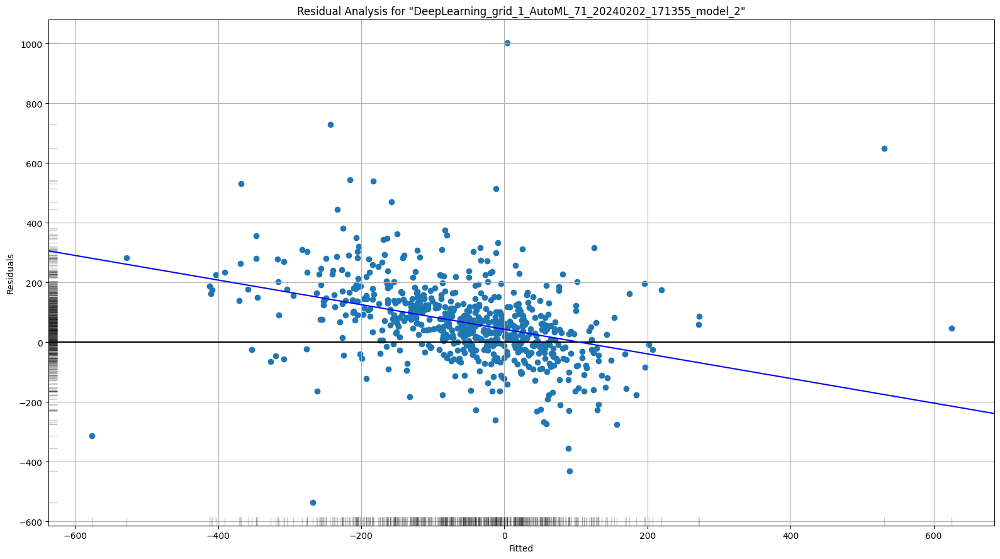

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

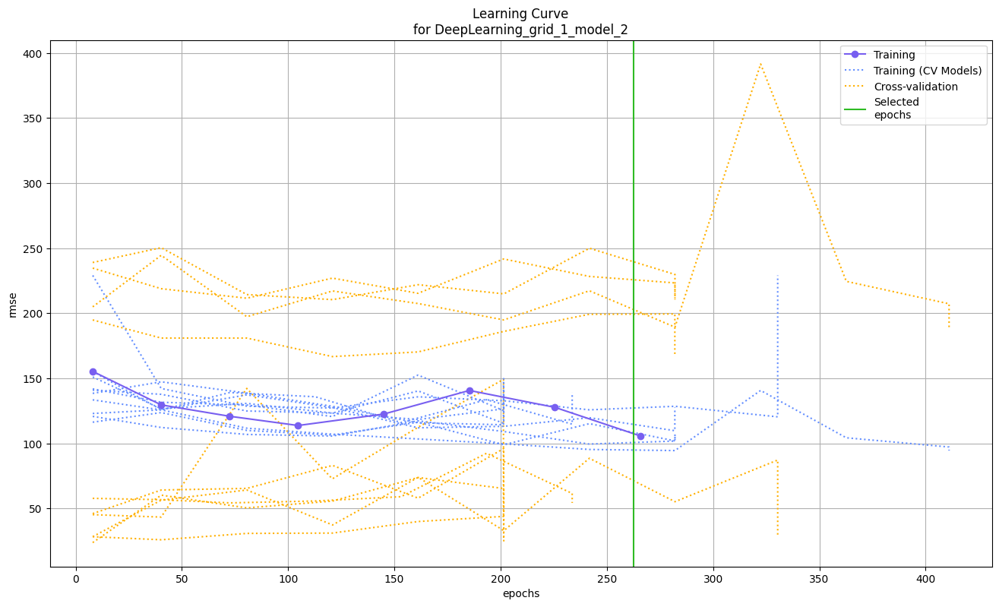

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

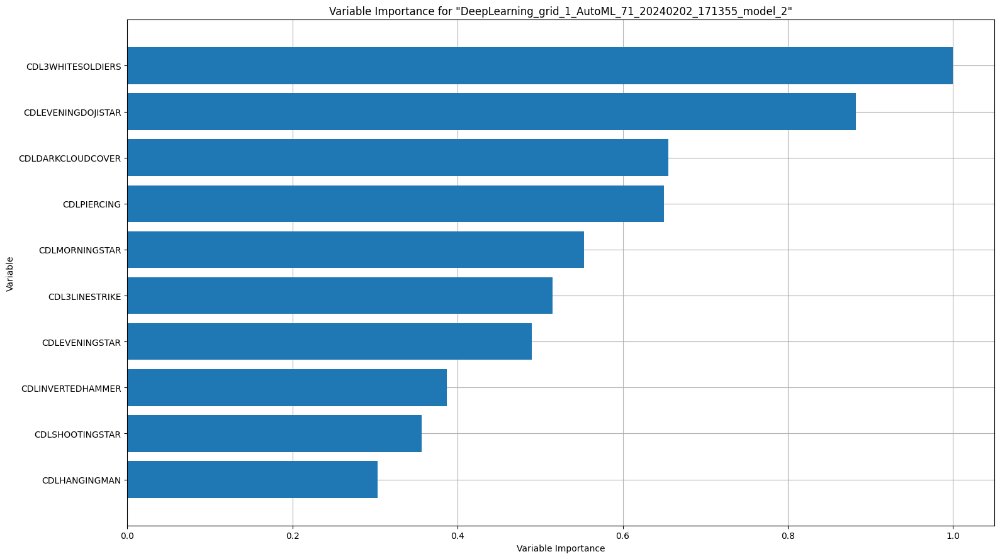

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

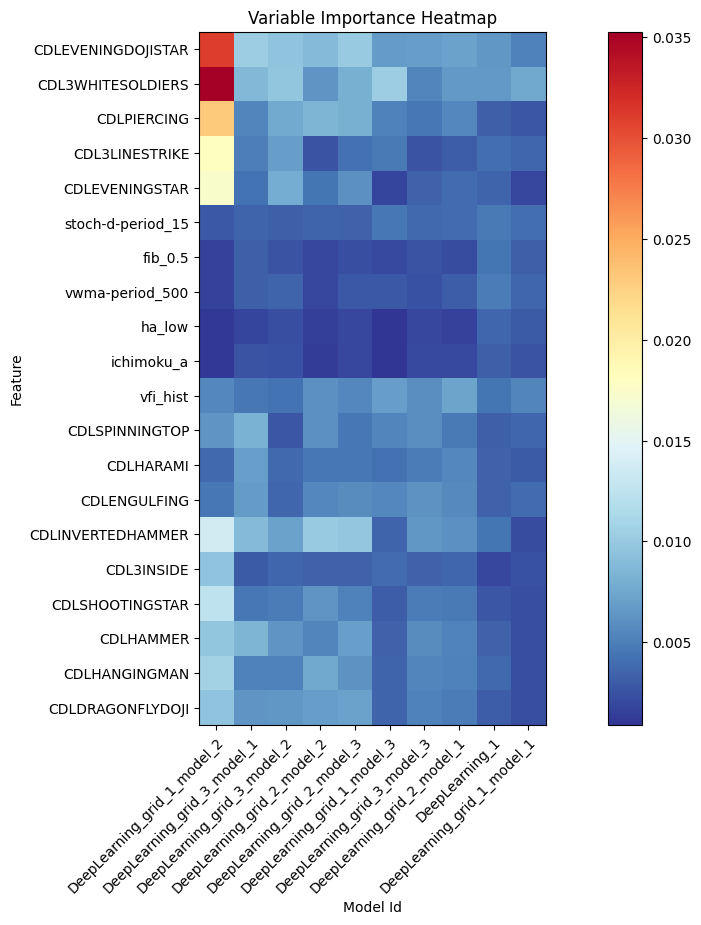

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

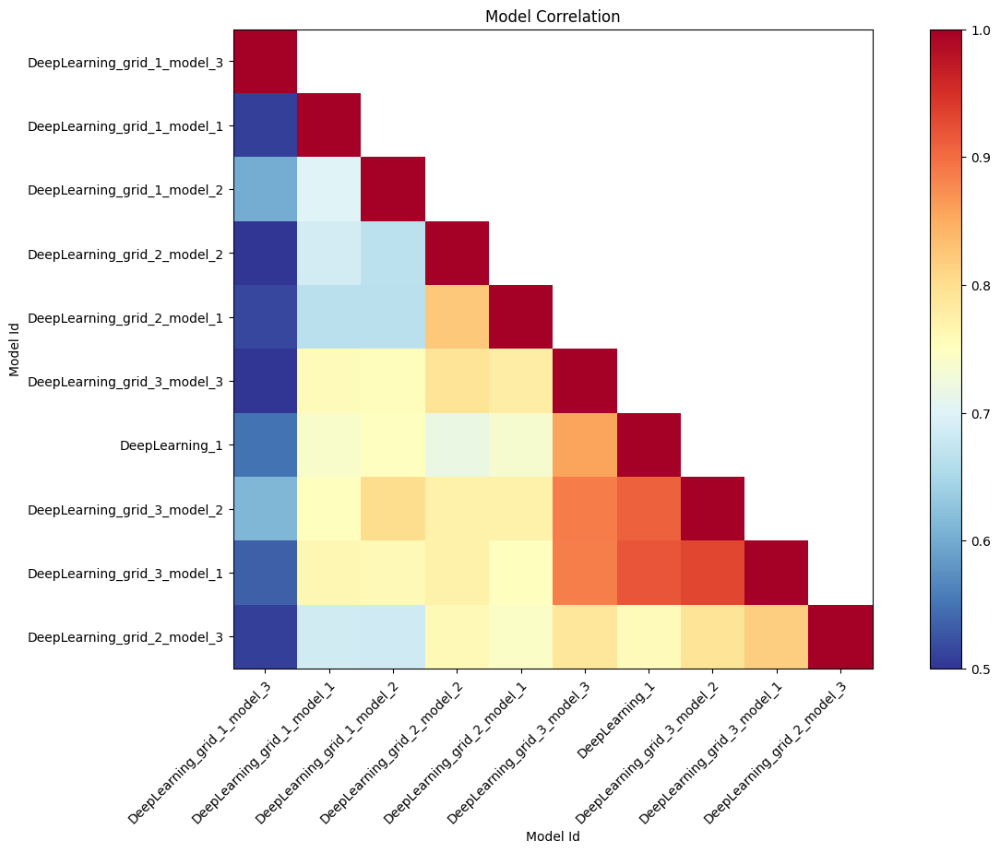

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

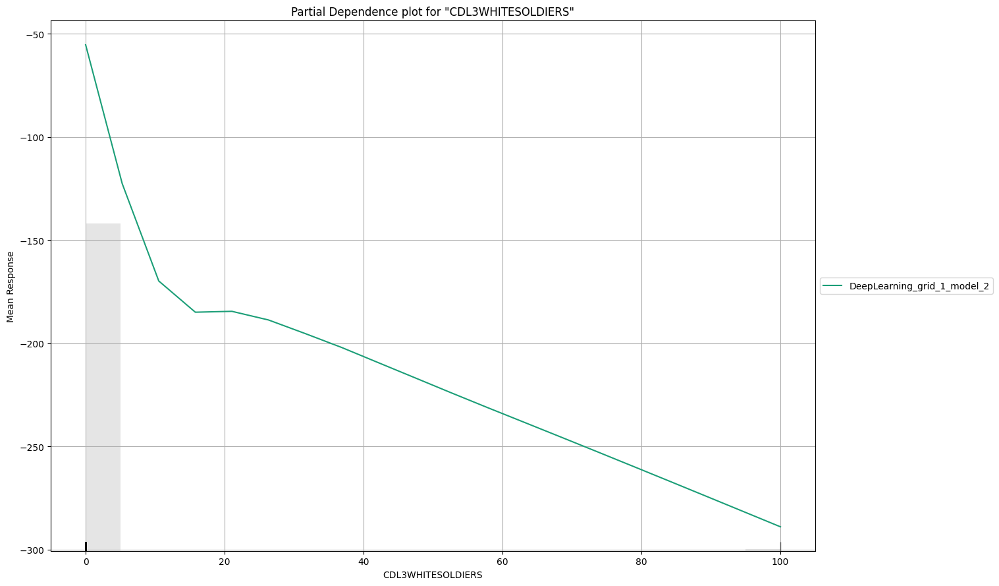

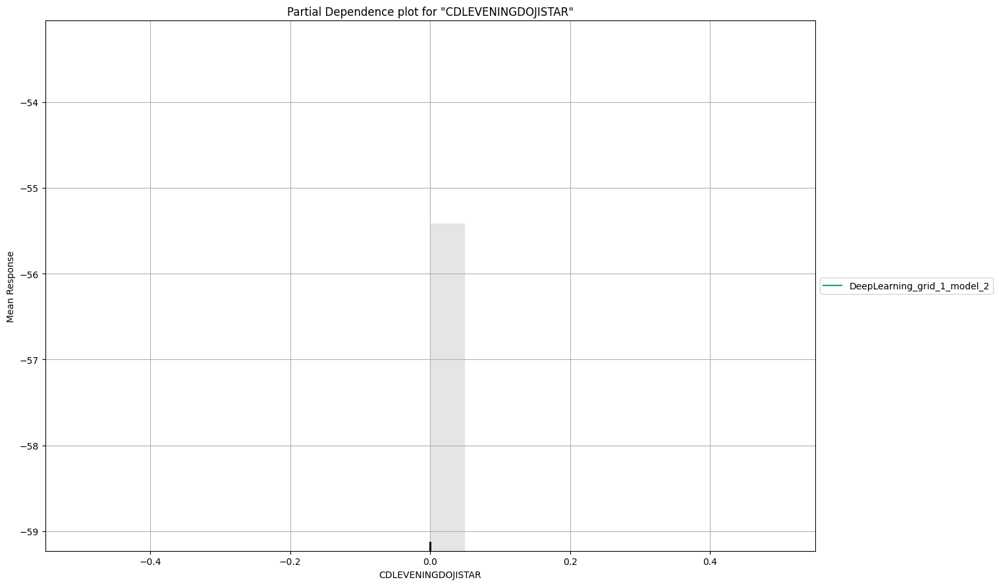

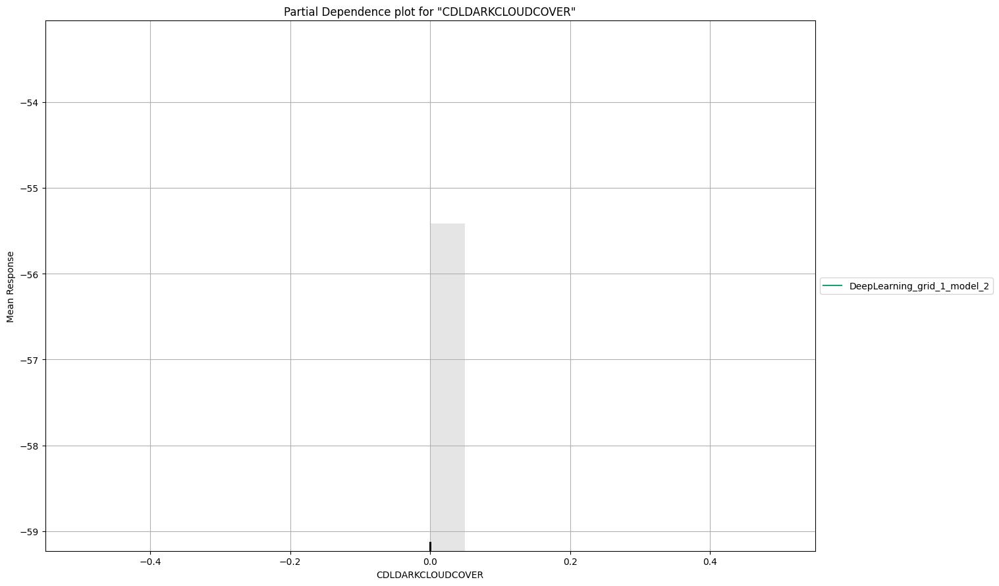

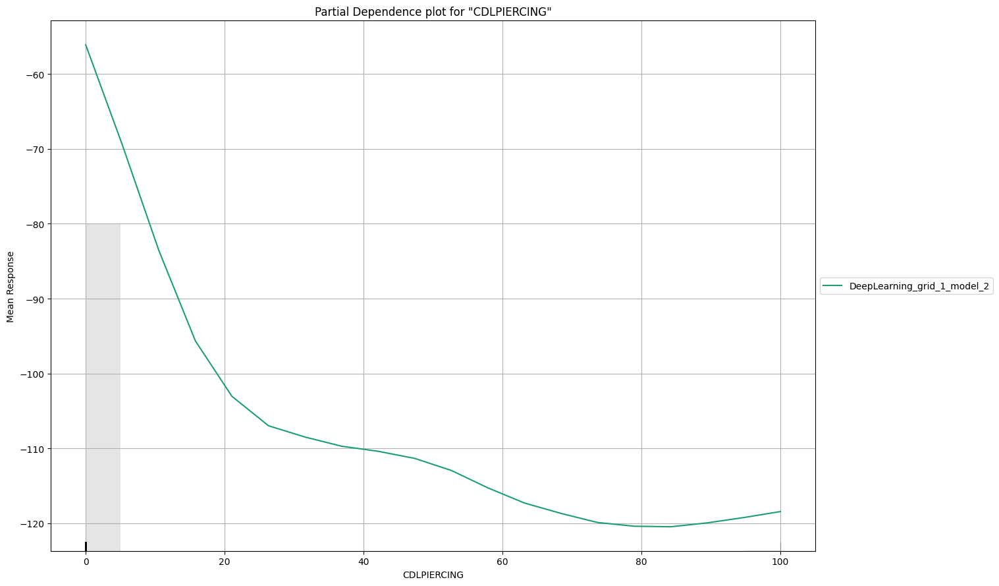

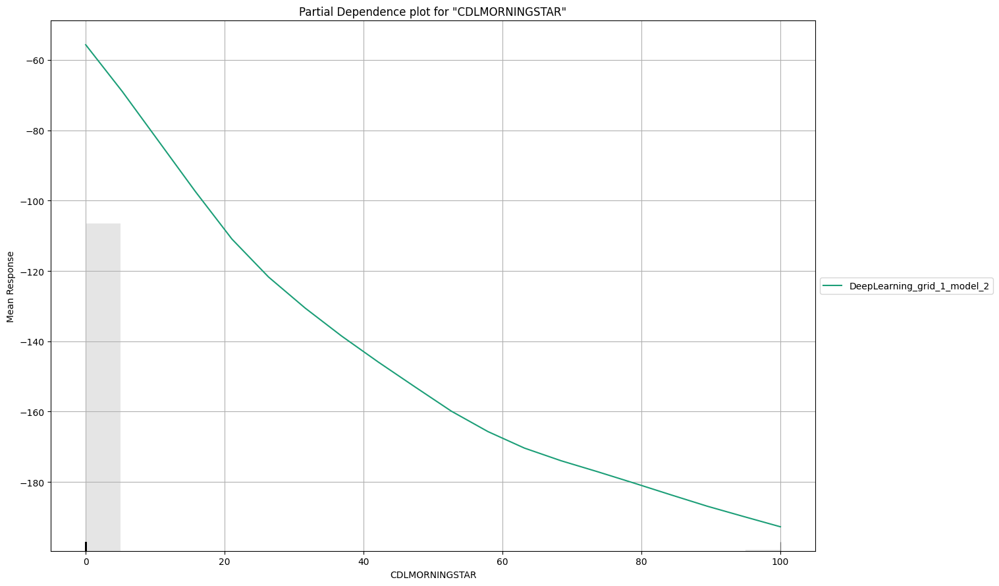

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

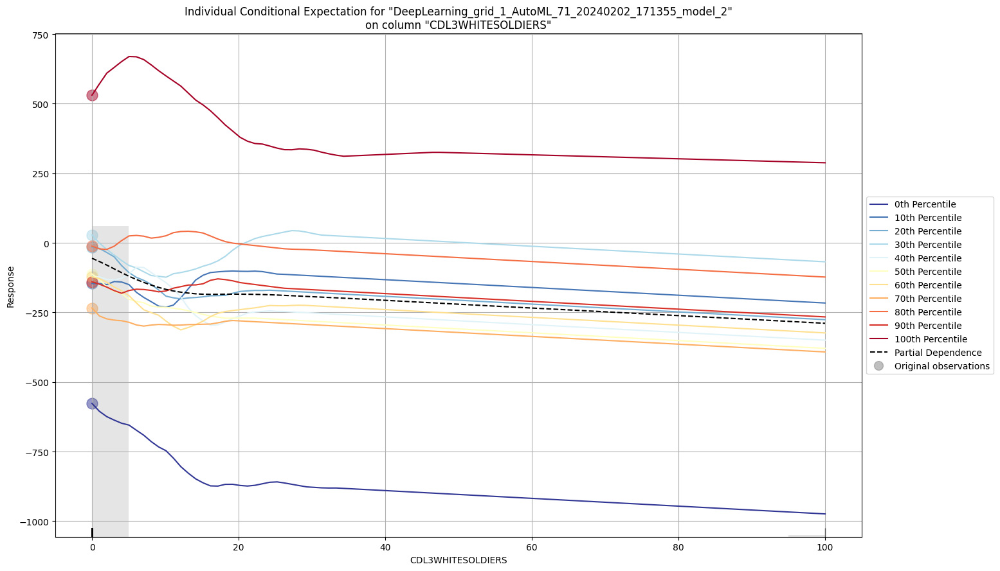

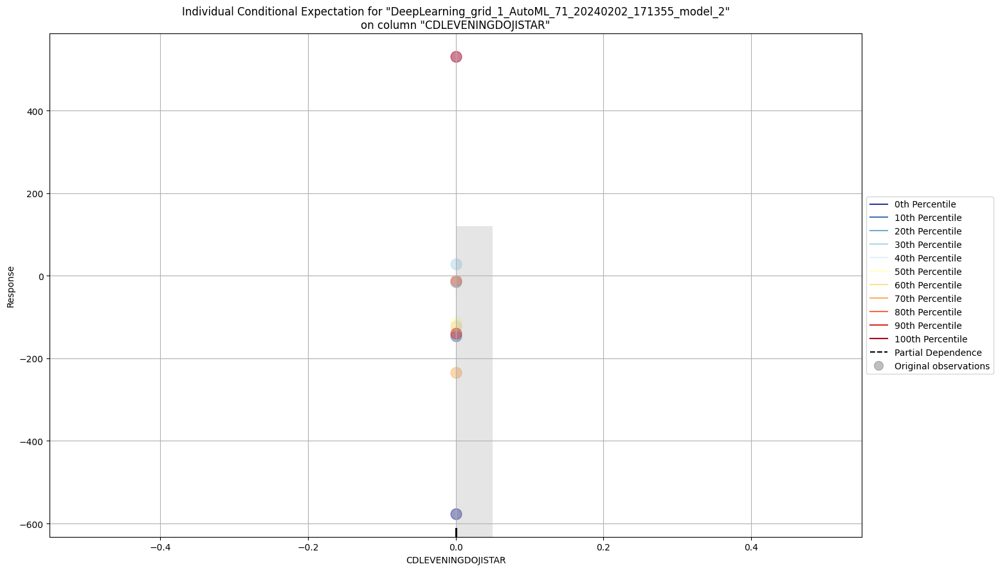

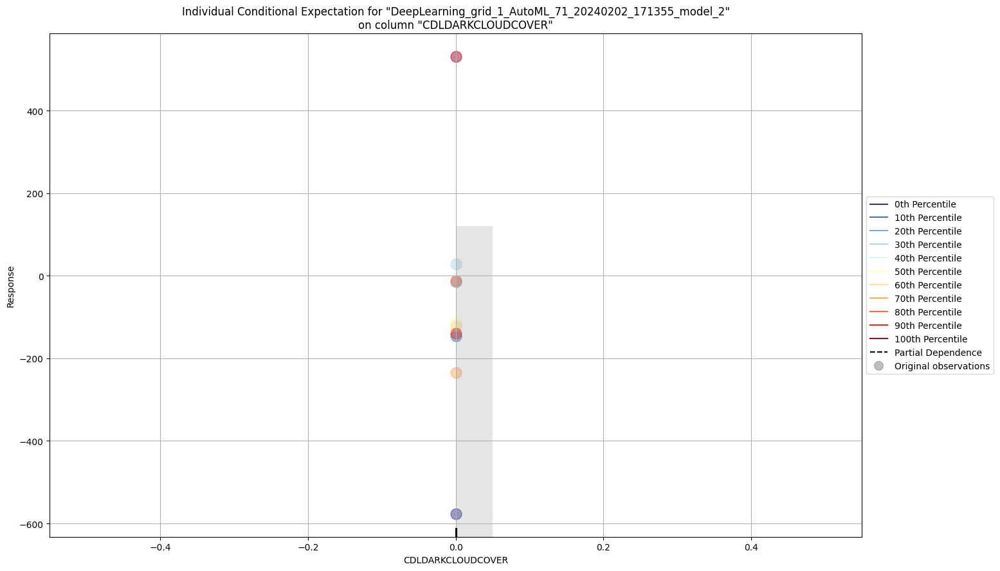

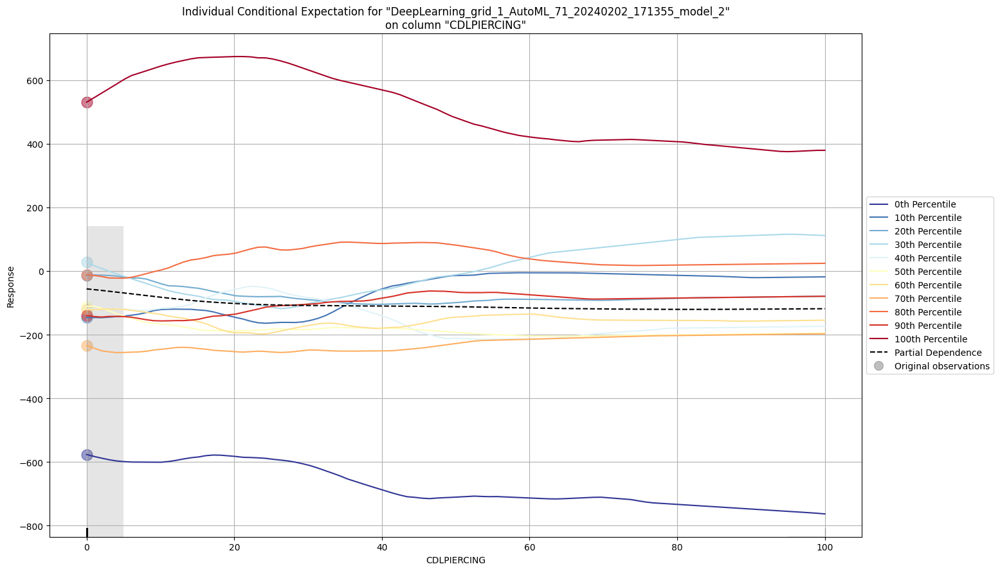

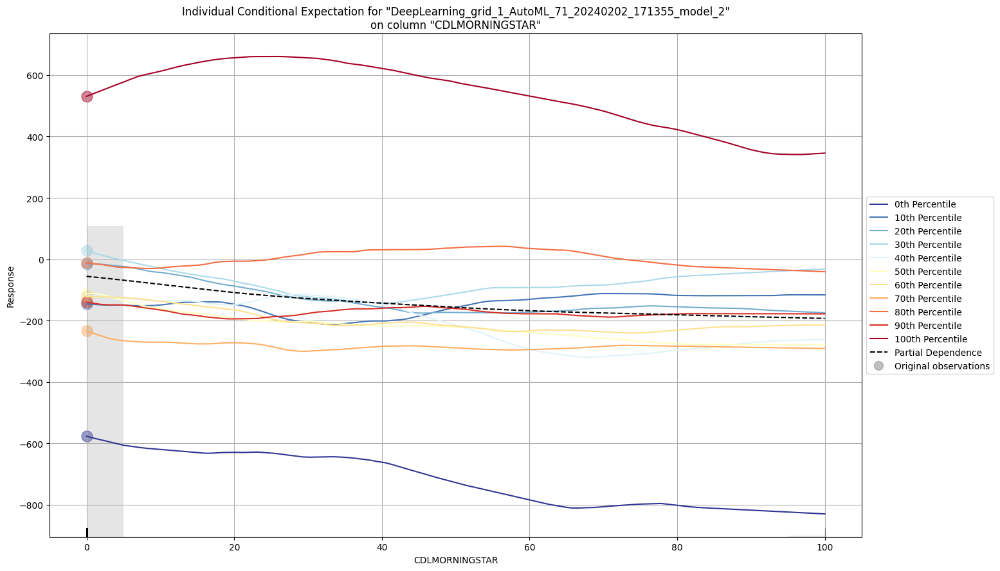



Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


/Users/dad/Library/Python/3.9/lib/python/site-packages/h2o/frame.py:1979: H2ODependencyWarning: converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above).
  warnings.warn("converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


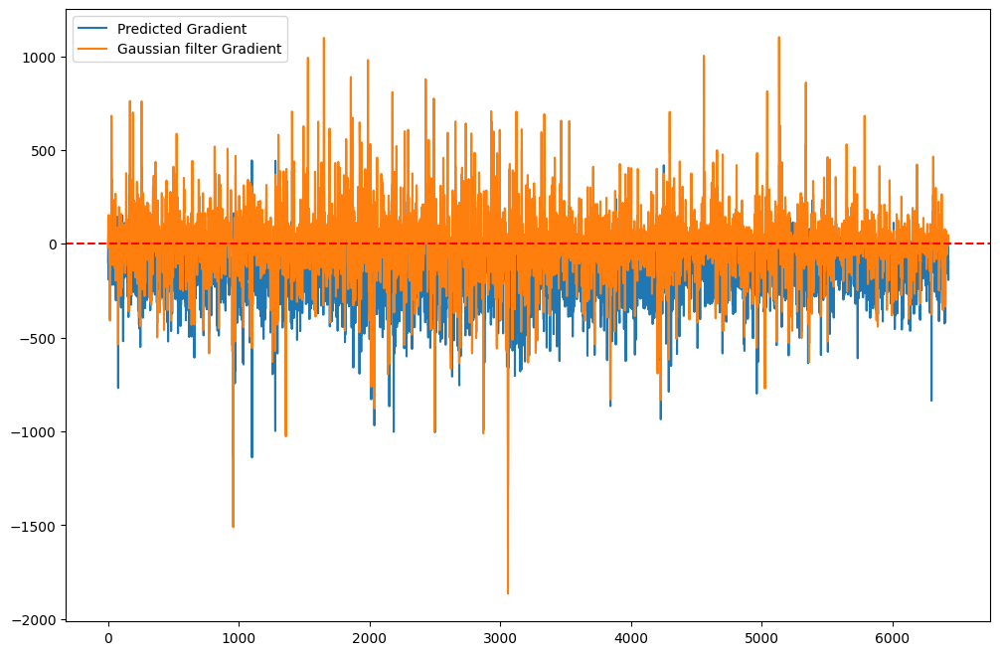

/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_37159/4155402193.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[(predicted_values['extrema'].values == 'sell'), 'exit_max'] = 1
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_37159/4155402193.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[(predicted_values['extrema'].values == 'buy'), 'enter_min'] = 1


Buy signals: 480.0 Sell signals: 480.0 Candles: 6430


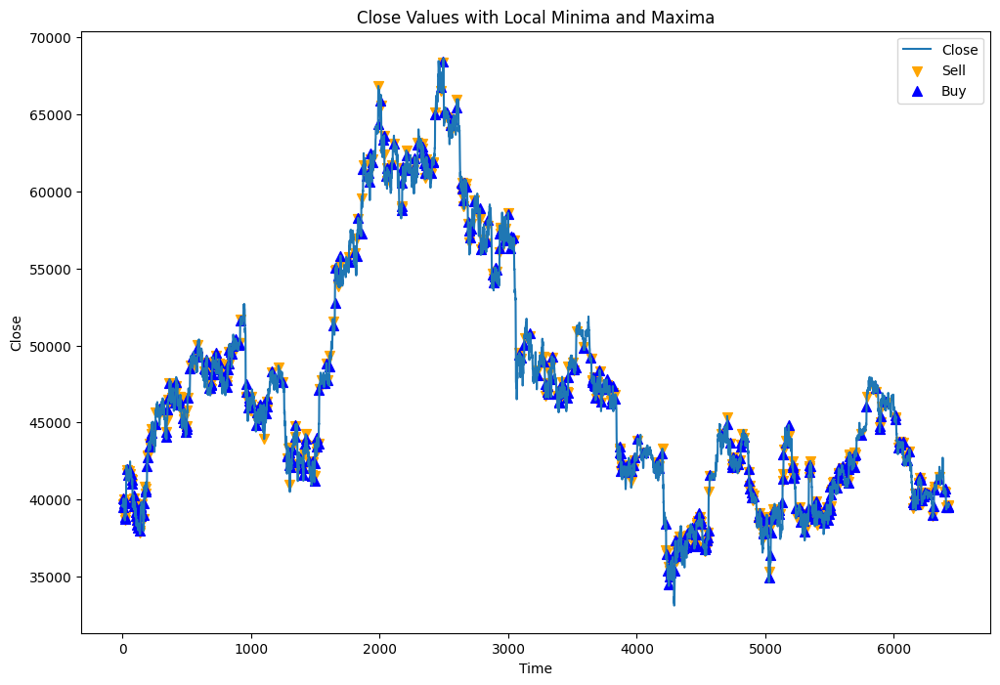

Ending Capital: 852.2336879319733
Total Theoretical Profit: -147.76631206802665
Win Percentage: 32.5%
Max Drawdown: 149.61821637740456
Max Drawdown Percent: 14.934721763437686
Total Trades: 480
Average Return: -0.1231601269960897
Average Return pct: -0.13250789014967018
Sharpe Ratio: -0.12720730855976245
Buy signals: 480.0 Sell signals: 480.0 Candles: 6430
Percent of candles with signal (buy or sell): 14.930015552099535%


In [ ]:
train_and_evaluate_gradient_model(df_1h[500:20000], testsize=0.33, kernel_size=5, sigma=1)

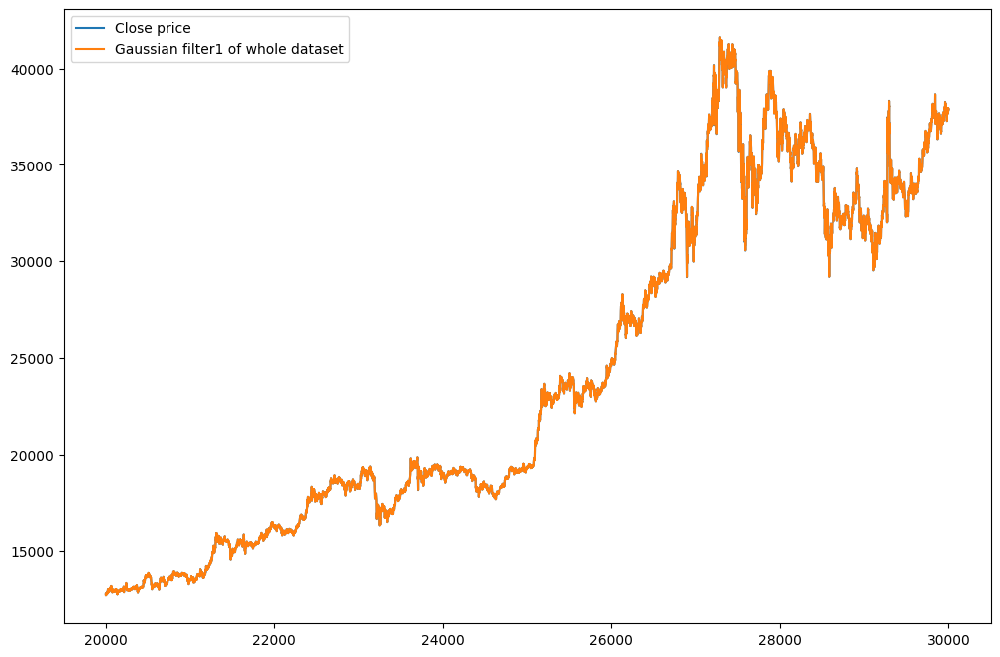

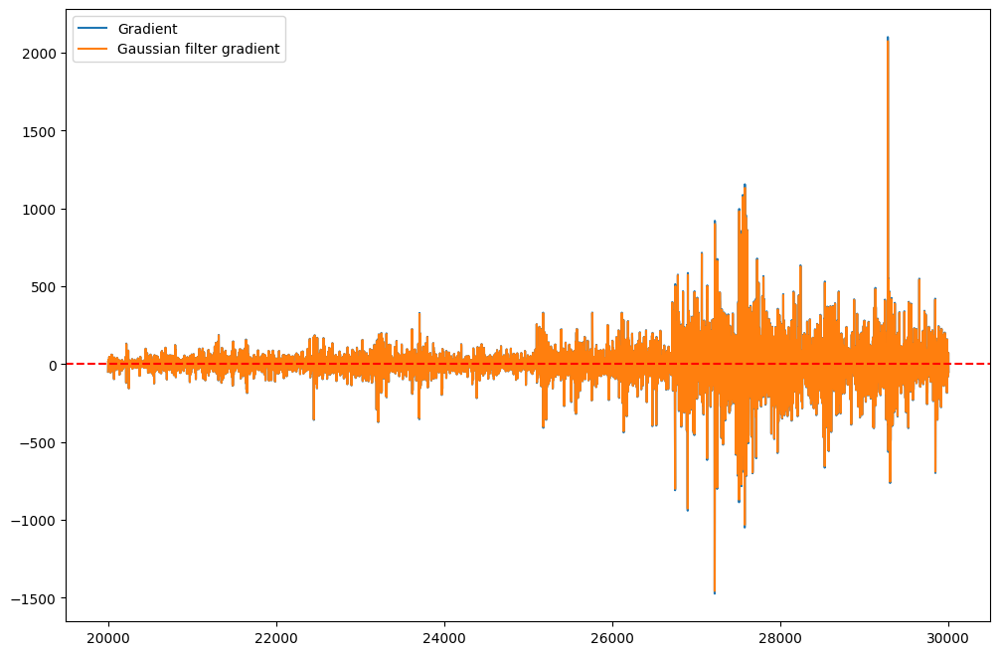

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
18:17:58.970: Fold column fold_numbers will be used for cross-validation. nfolds parameter will be ignored.

███████████████████████████████████████████████████████████████| (done) 100%


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
DeepLearning_grid_2_AutoML_72_20240202_181758_model_1,63.1938,3993.45,43.9779,nan,3993.45,32420,0.00751,DeepLearning
DeepLearning_1_AutoML_72_20240202_181758,65.3467,4270.19,47.4741,nan,4270.19,393,0.047173,DeepLearning
DeepLearning_grid_1_AutoML_72_20240202_181758_model_1,65.6593,4311.15,49.7638,nan,4311.15,35048,0.021973,DeepLearning
DeepLearning_grid_3_AutoML_72_20240202_181758_model_3,67.2985,4529.09,49.9423,nan,4529.09,35349,0.024257,DeepLearning
DeepLearning_grid_3_AutoML_72_20240202_181758_model_1,67.4528,4549.88,48.6865,nan,4549.88,34673,0.014001,DeepLearning
DeepLearning_grid_2_AutoML_72_20240202_181758_model_3,68.6779,4716.66,50.4042,nan,4716.66,38280,0.01942,DeepLearning
DeepLearning_grid_3_AutoML_72_20240202_181758_model_2,72.5411,5262.21,55.9449,nan,5262.21,40765,0.023913,DeepLearning
DeepLearning_grid_1_AutoML_72_20240202_181758_model_3,74.0247,5479.66,51.9426,nan,5479.66,35462,0.011417,DeepLearning
DeepLearning_grid_2_AutoML_72_20240202_181758_model_2,80.6703,6507.7,64.5982,nan,6507.7,37363,0.020062,DeepLearning
DeepLearning_grid_1_AutoML_72_20240202_181758_model_2,85.1249,7246.24,46.5724,nan,7246.24,40761,0.016799,DeepLearning


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

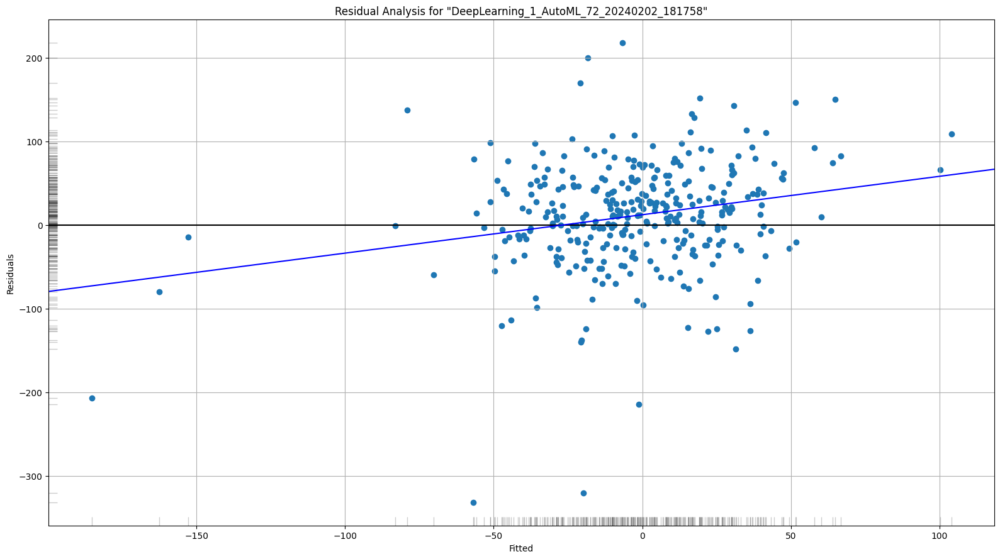

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

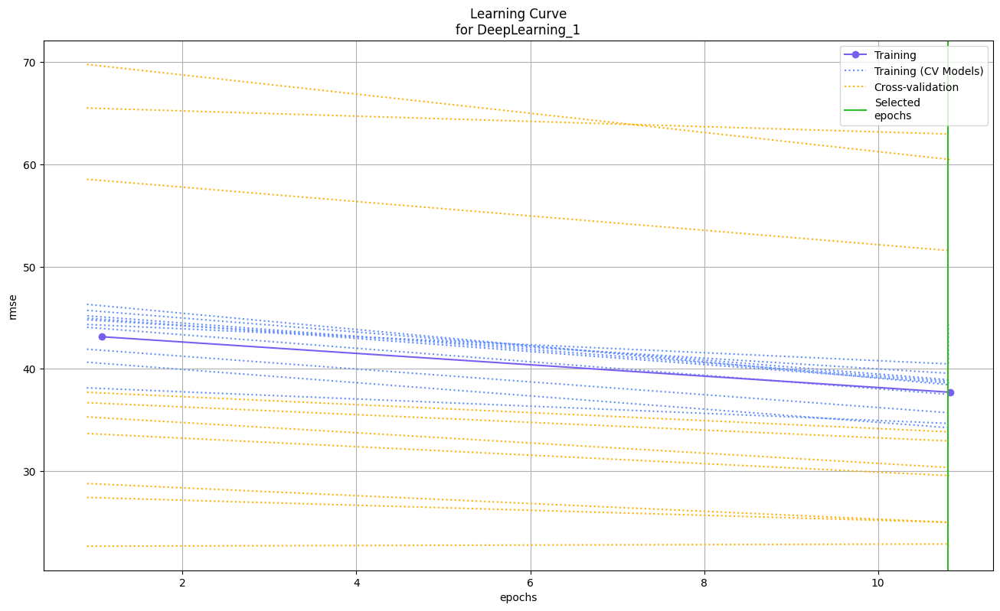

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

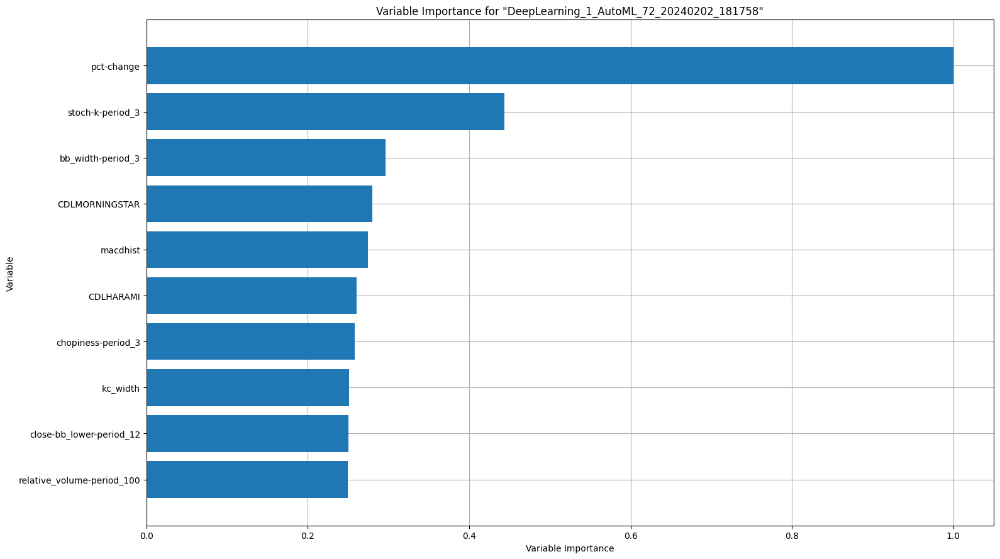

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

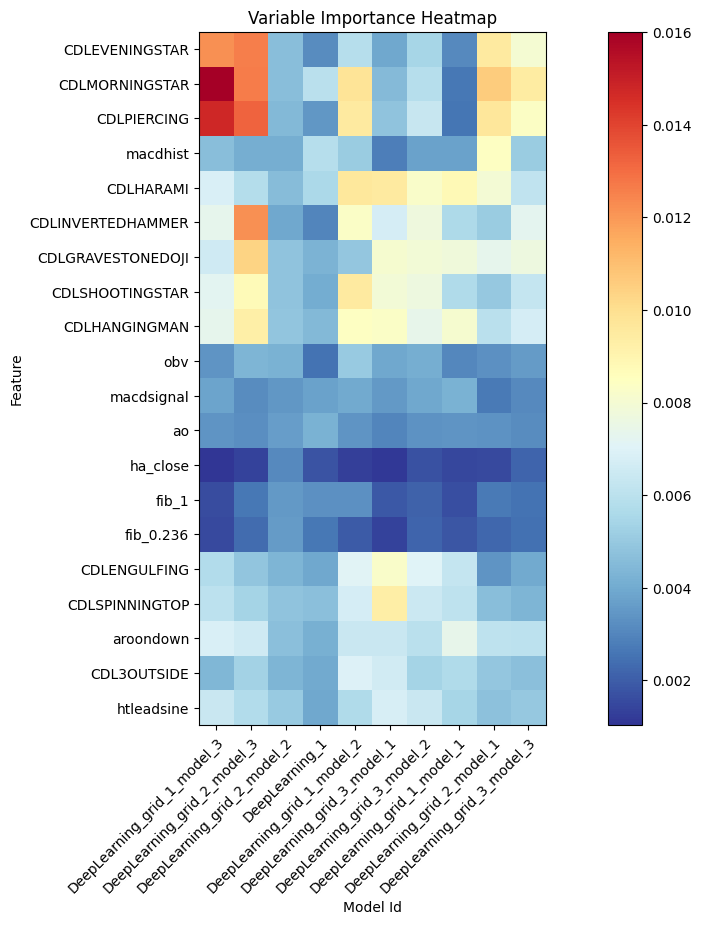

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

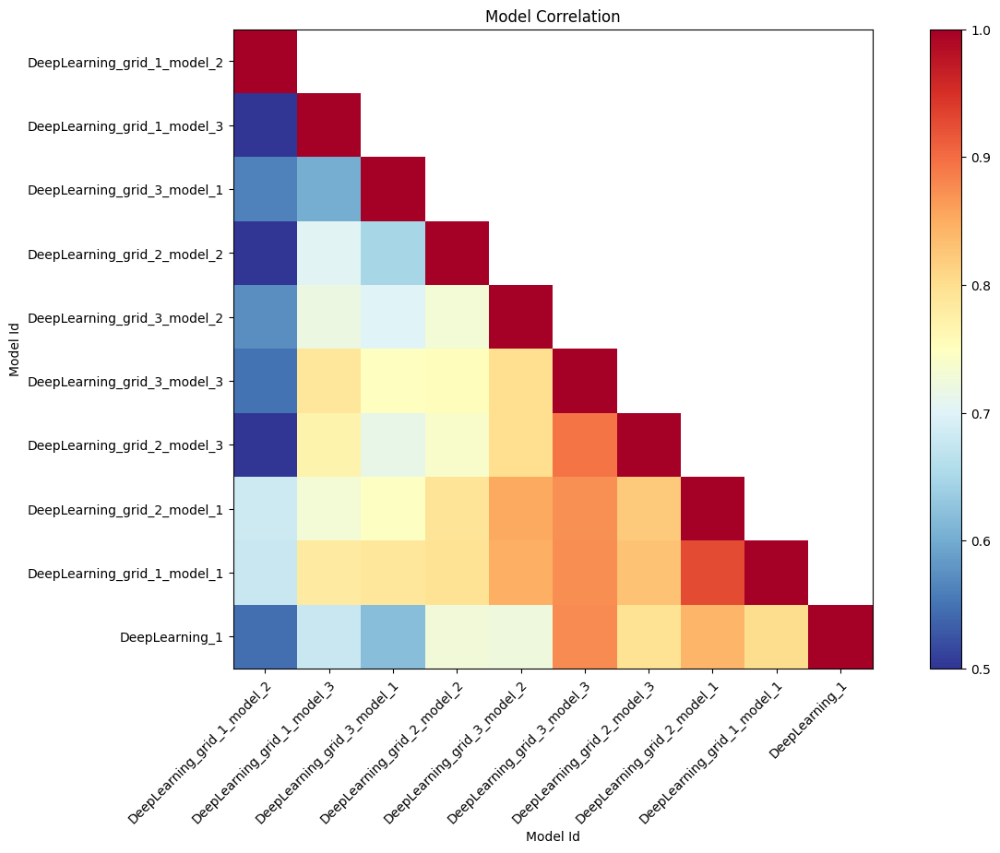

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

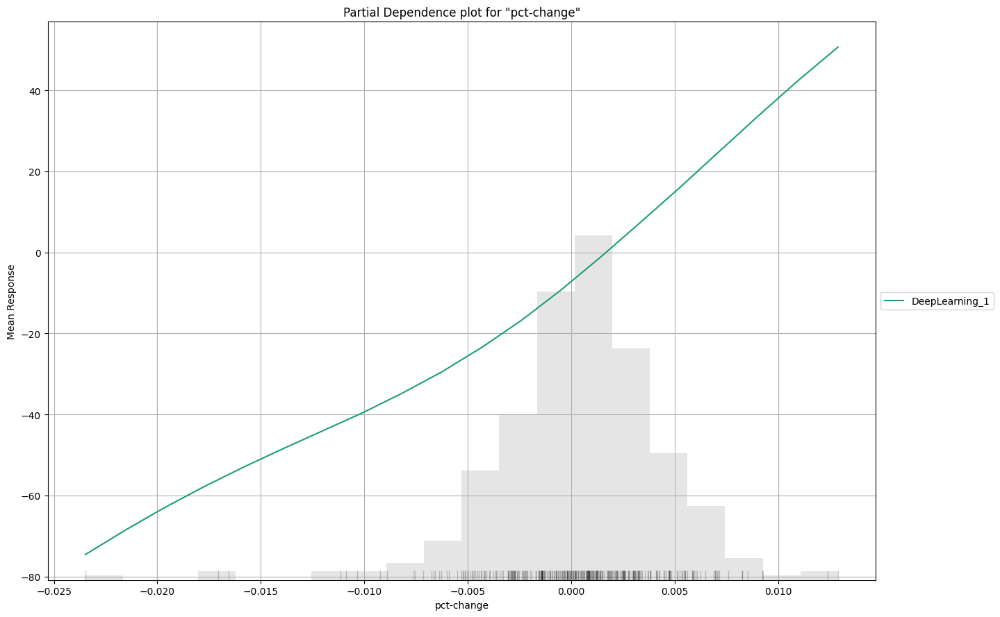

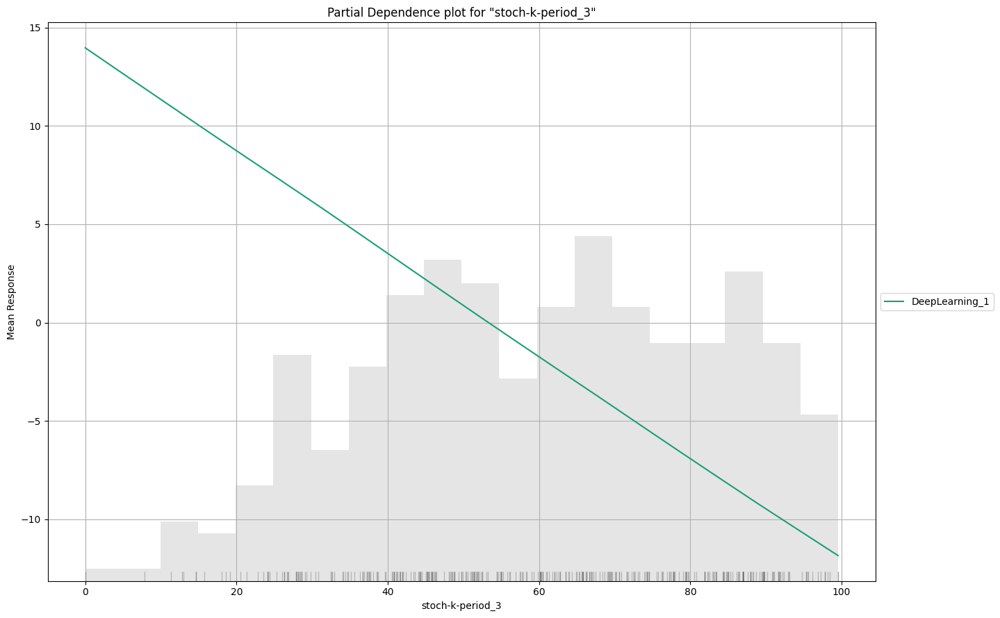

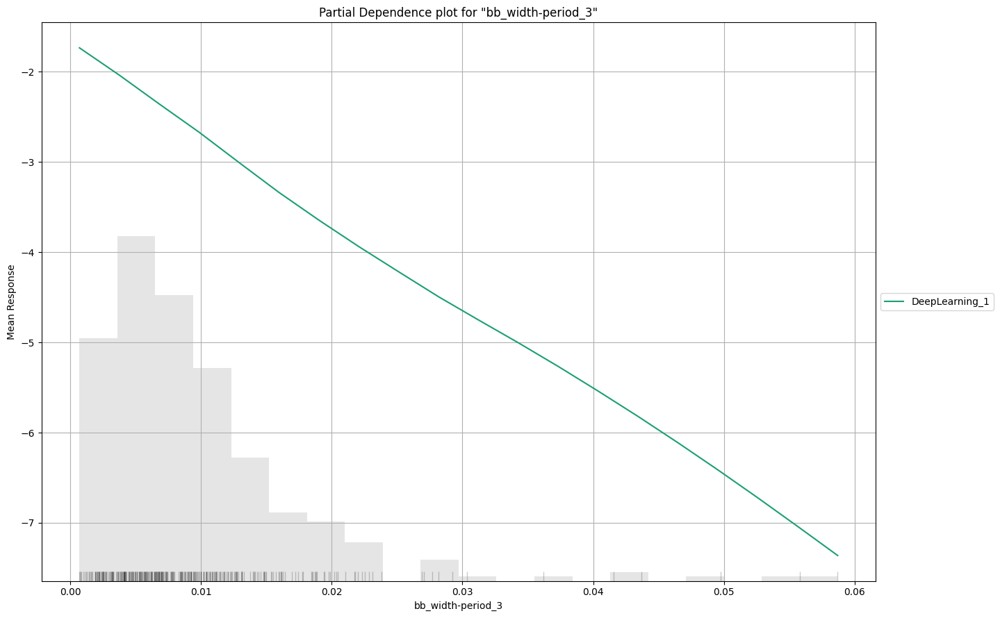

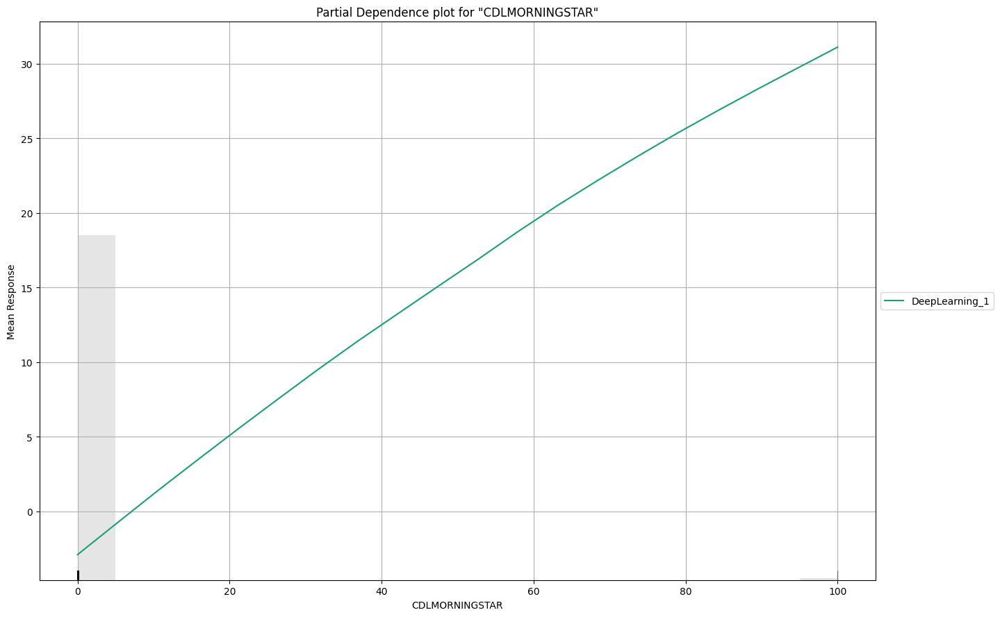

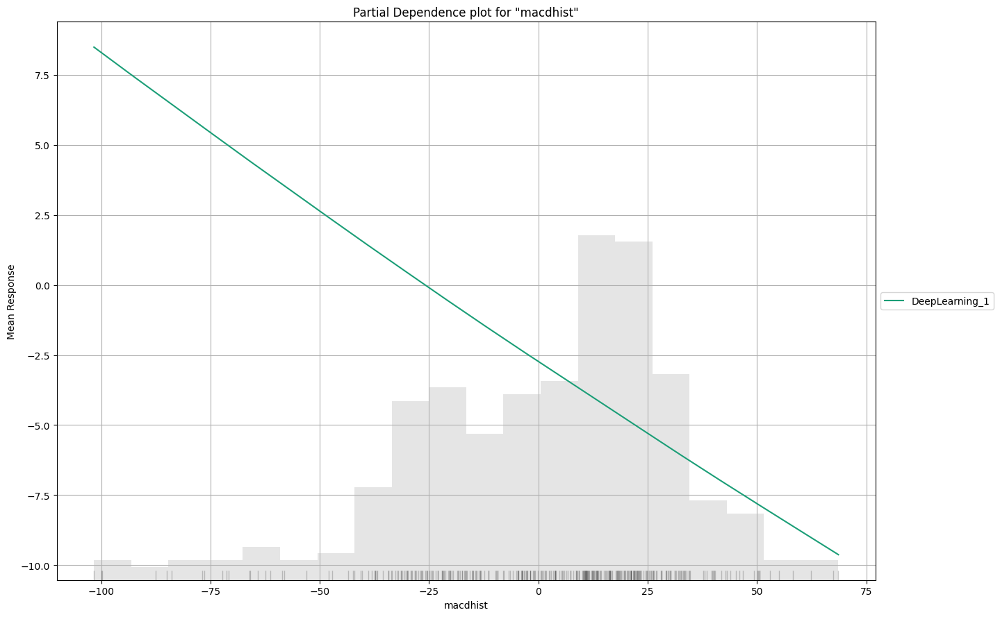

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

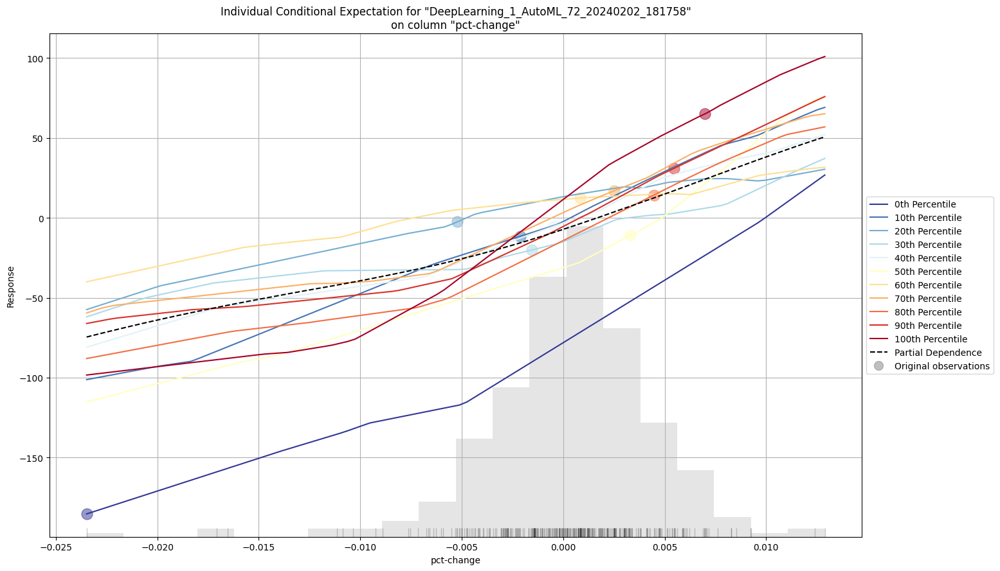

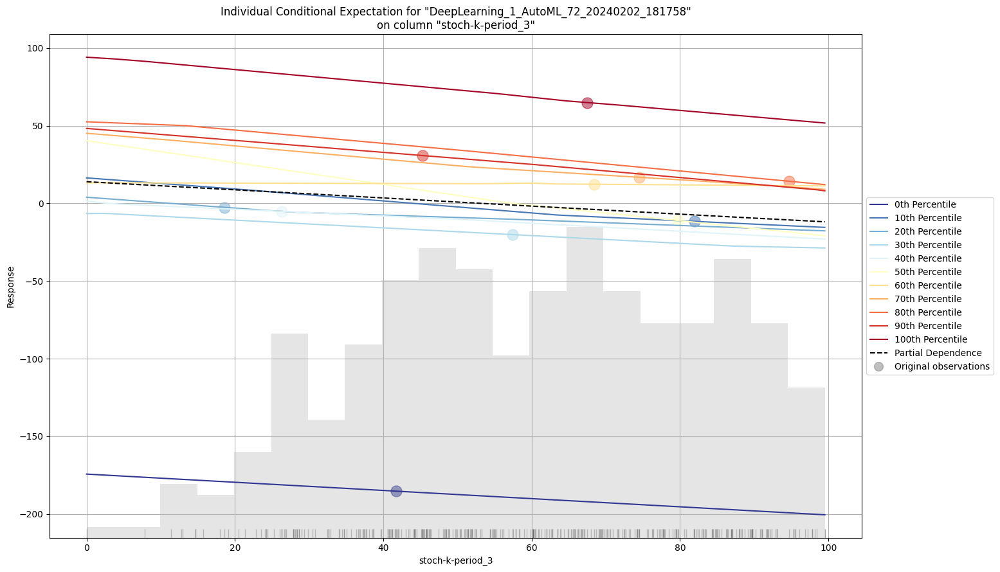

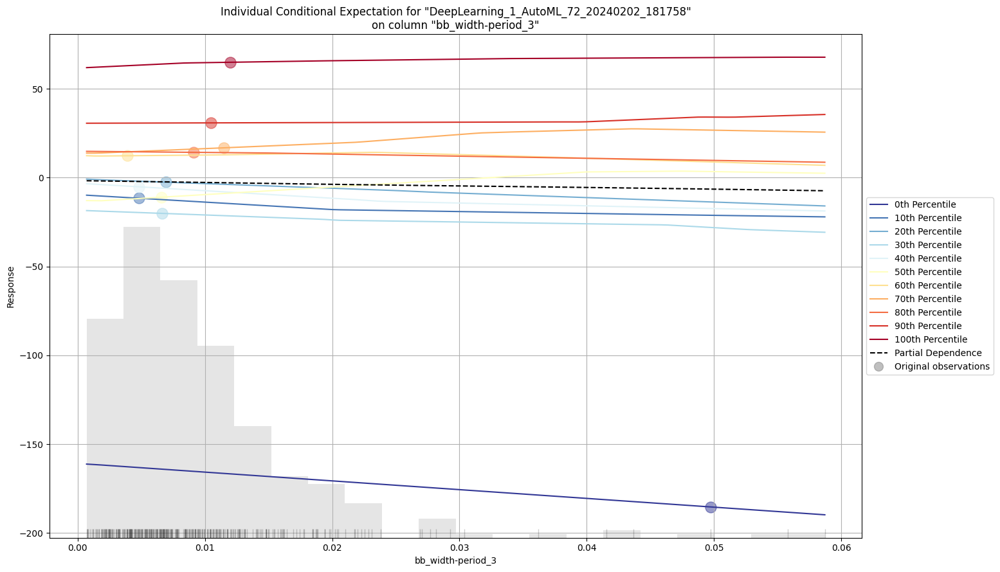

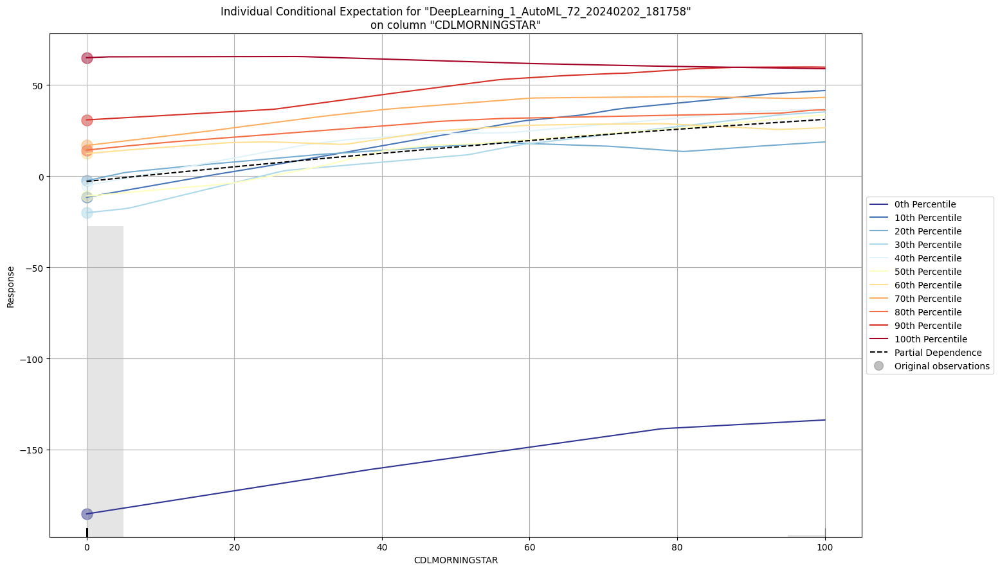

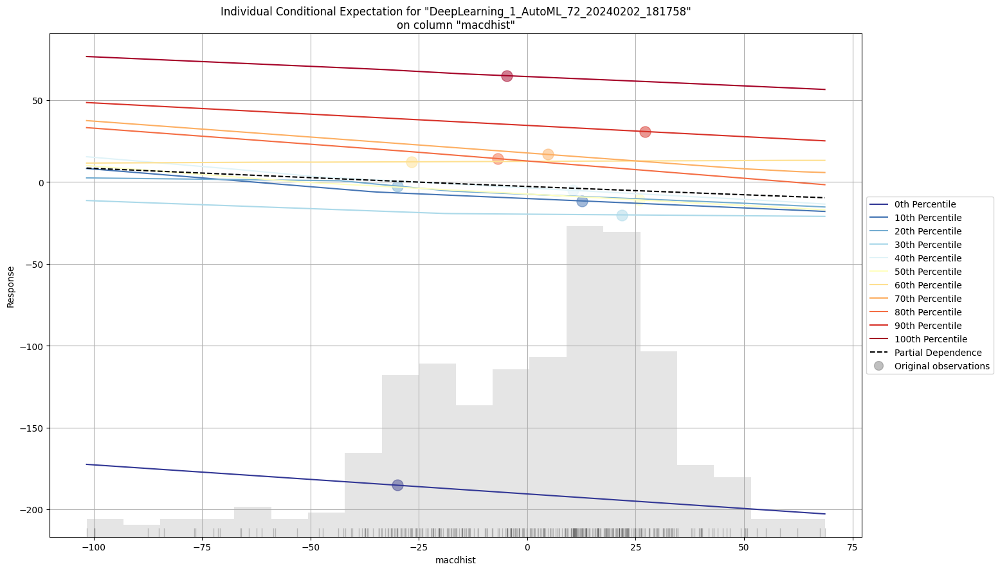



Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


/Users/dad/Library/Python/3.9/lib/python/site-packages/h2o/frame.py:1979: H2ODependencyWarning: converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above).
  warnings.warn("converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


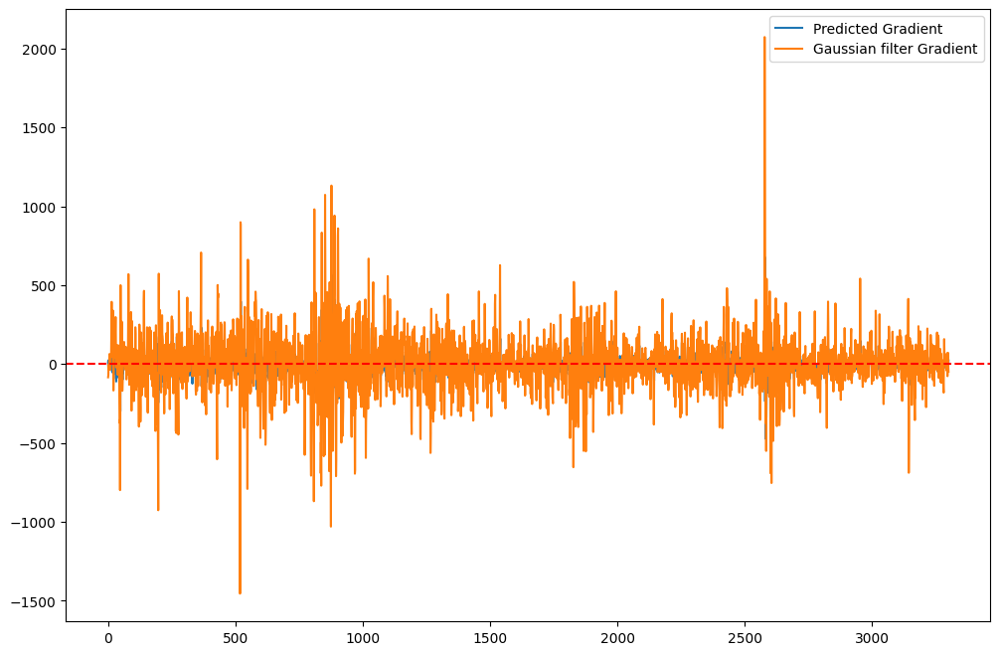

Buy signals: 719.0 Sell signals: 719.0 Candles: 3301


/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_37159/4155402193.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[(predicted_values['extrema'].values == 'sell'), 'exit_max'] = 1
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_37159/4155402193.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[(predicted_values['extrema'].values == 'buy'), 'enter_min'] = 1


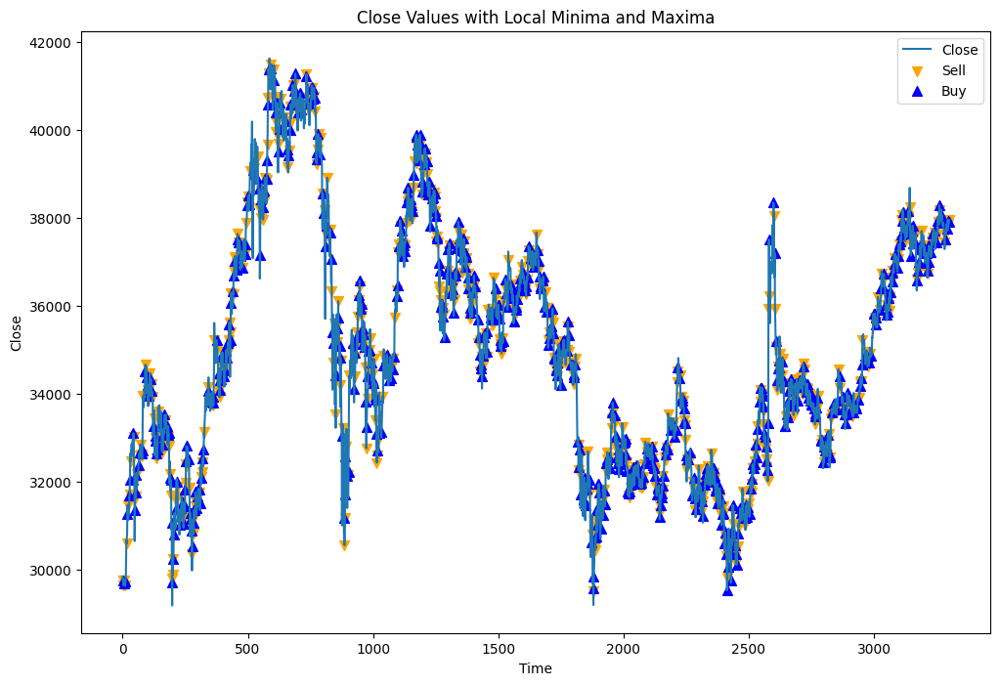

Ending Capital: 692.3290938756305
Total Theoretical Profit: -307.6709061243695
Win Percentage: 32.45125348189415%
Max Drawdown: 233.44520579195012
Max Drawdown Percent: 23.27769641168733
Total Trades: 718
Average Return: -0.14482076716636072
Average Return pct: -0.1645017132791407
Sharpe Ratio: -0.16337711672216104
Buy signals: 719.0 Sell signals: 719.0 Candles: 3301
Percent of candles with signal (buy or sell): 43.5625568009694%


In [ ]:
# 15m gaussian gradient
train_and_evaluate_gradient_model(df_15m[20000:30000], testsize=0.33, kernel_size=3, sigma=1)

1h Regressor model
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
09:55:24.747: Fold column fold_numbers will be used for cross-validation. nfolds parameter will be ignored.
09:55:24.753: AutoML: XGBoost is not available; skipping it.

███████████████████████████████████████████████████████████████| (done) 100%


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
GBM_1_AutoML_76_20240203_95524,90.0281,8105.06,55.6914,nan,8105.06,5724,0.005798,GBM
GBM_grid_1_AutoML_76_20240203_95524_model_4,91.3574,8346.17,55.5623,nan,8346.17,4385,0.002405,GBM
GBM_grid_1_AutoML_76_20240203_95524_model_3,91.7246,8413.4,55.4733,nan,8413.4,2703,0.002369,GBM
GBM_3_AutoML_76_20240203_95524,92.3418,8527,55.3367,nan,8527,4170,0.003066,GBM
GBM_grid_1_AutoML_76_20240203_95524_model_5,92.6226,8578.94,56.6983,nan,8578.94,2853,0.002195,GBM
GBM_grid_1_AutoML_76_20240203_95524_model_2,92.7027,8593.79,57.6745,nan,8593.79,4065,0.002792,GBM
DRF_1_AutoML_76_20240203_95524,93.1412,8675.28,58.4149,nan,8675.28,66503,0.007815,DRF
GBM_2_AutoML_76_20240203_95524,93.6341,8767.35,55.6799,nan,8767.35,4420,0.002009,GBM
XRT_1_AutoML_76_20240203_95524,94.7735,8982.01,60.5331,nan,8982.01,72732,0.00559,DRF
GBM_4_AutoML_76_20240203_95524,94.8768,9001.61,57.9266,nan,9001.61,7015,0.002295,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

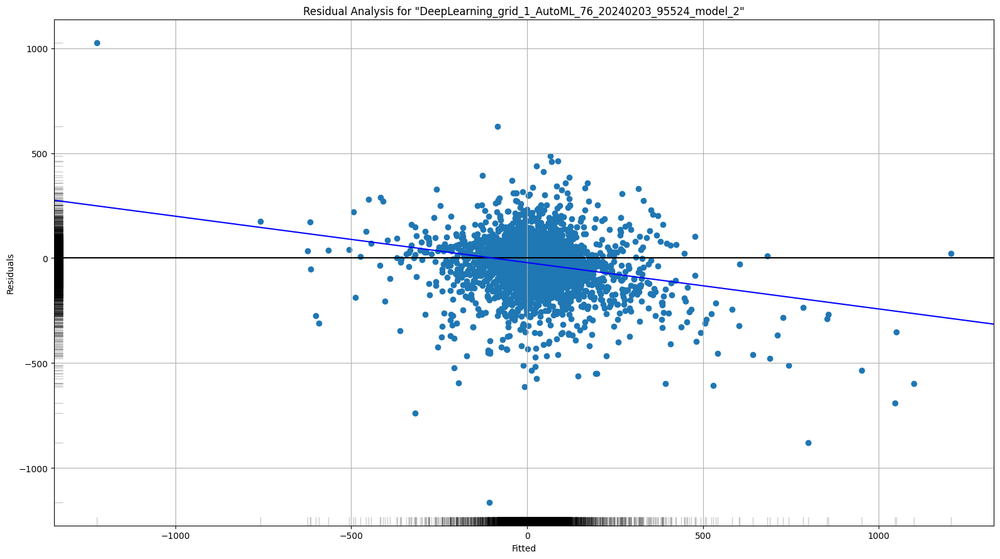

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

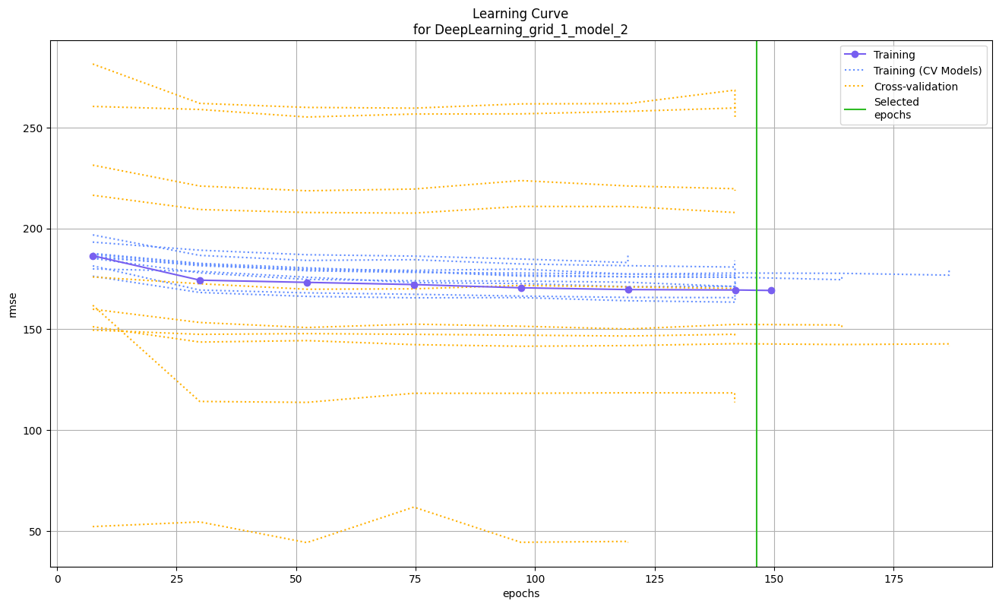

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

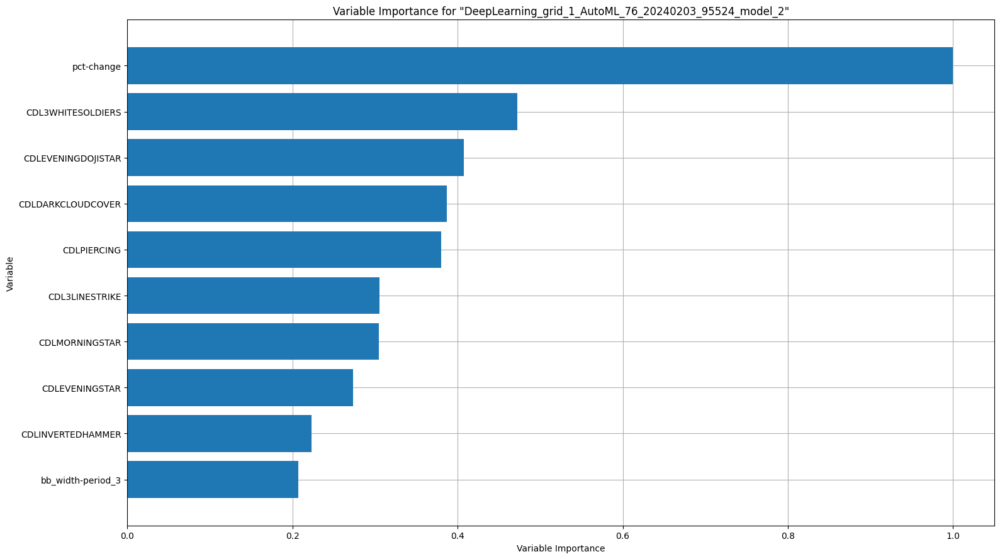

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

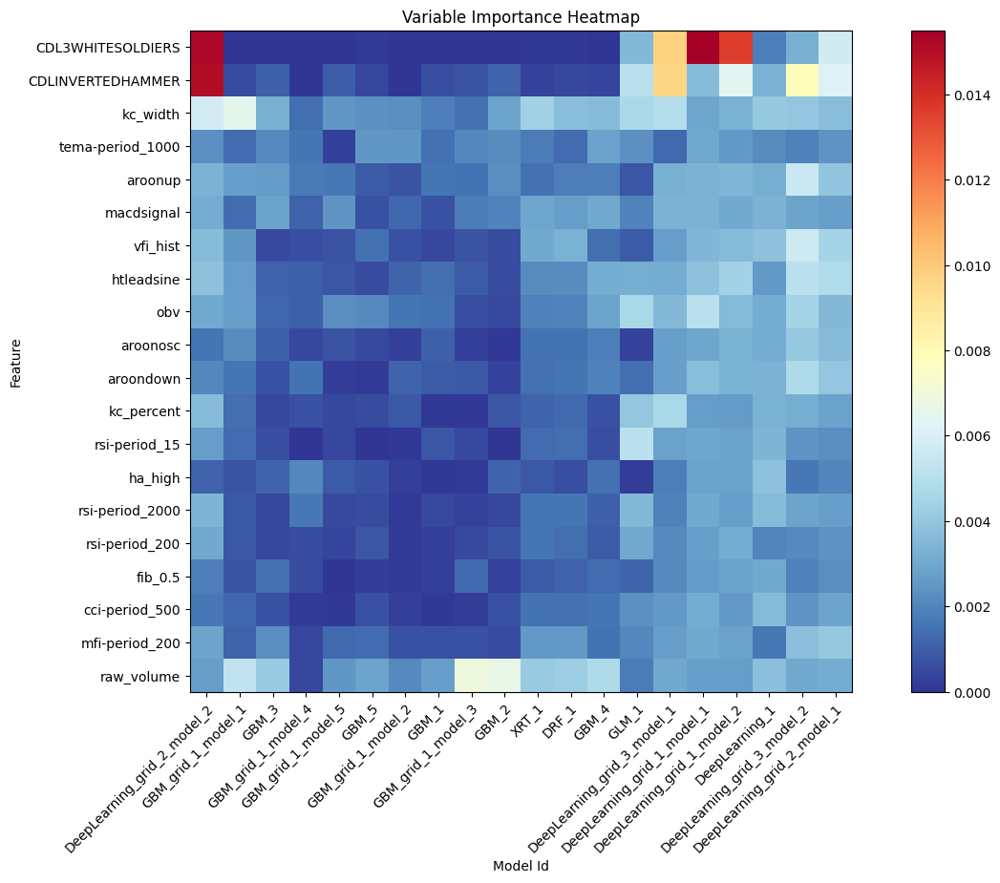

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

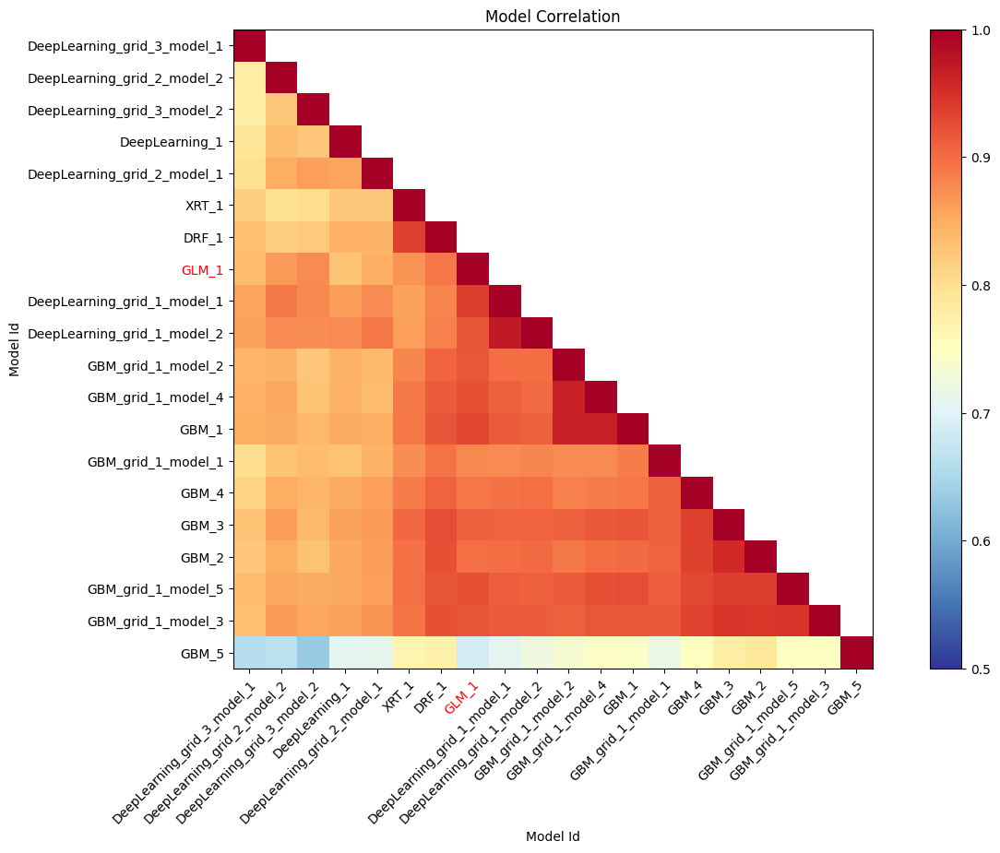

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

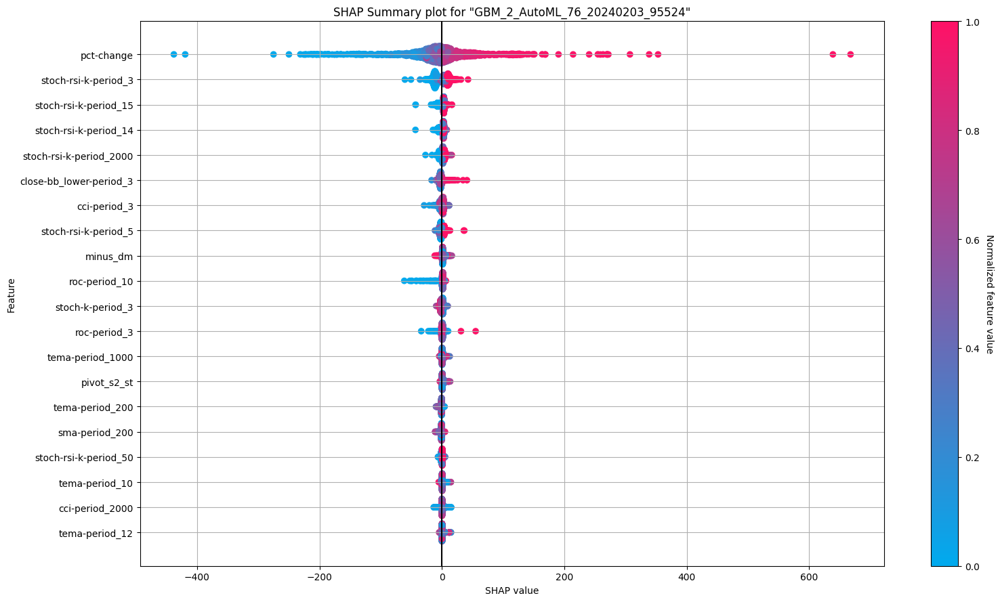

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

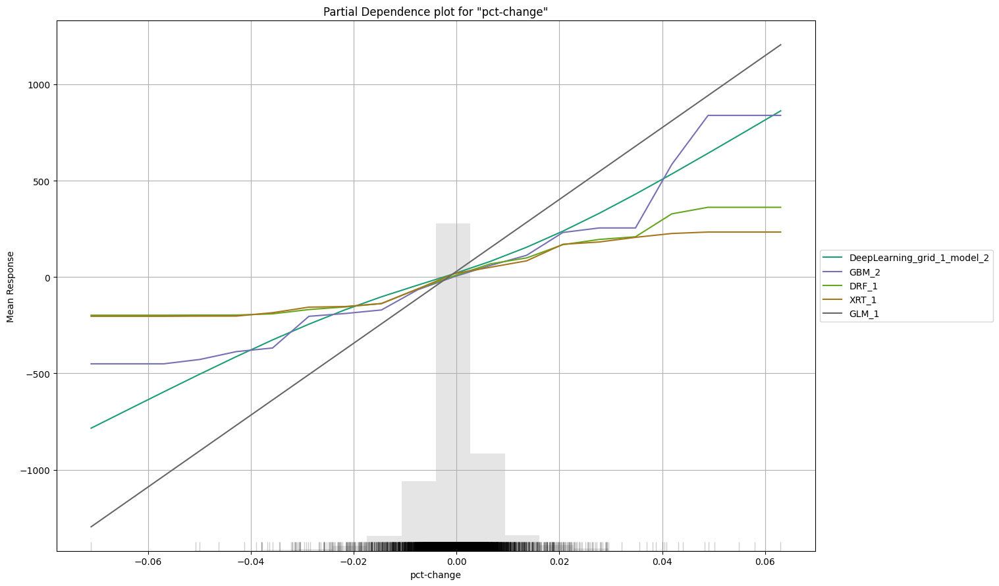

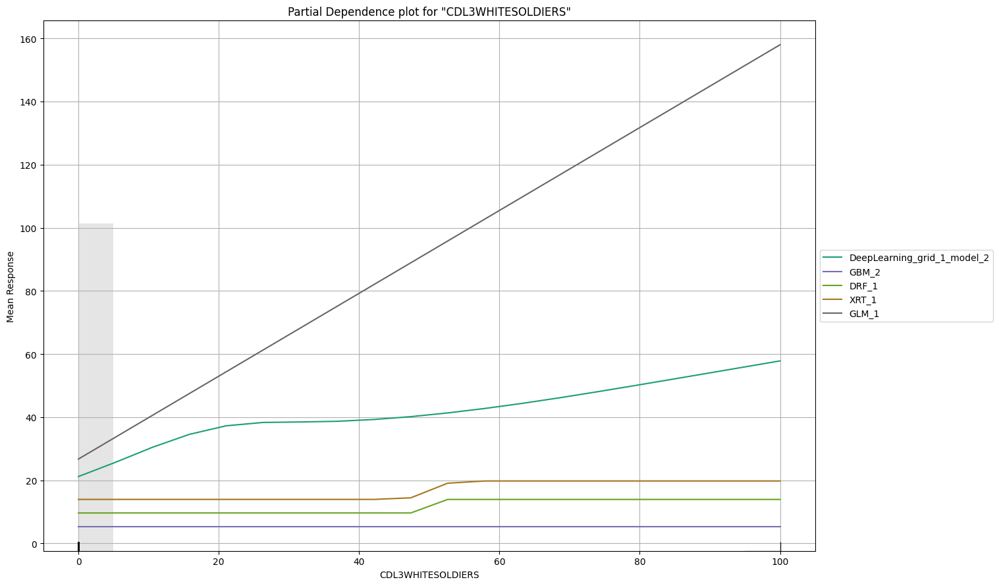

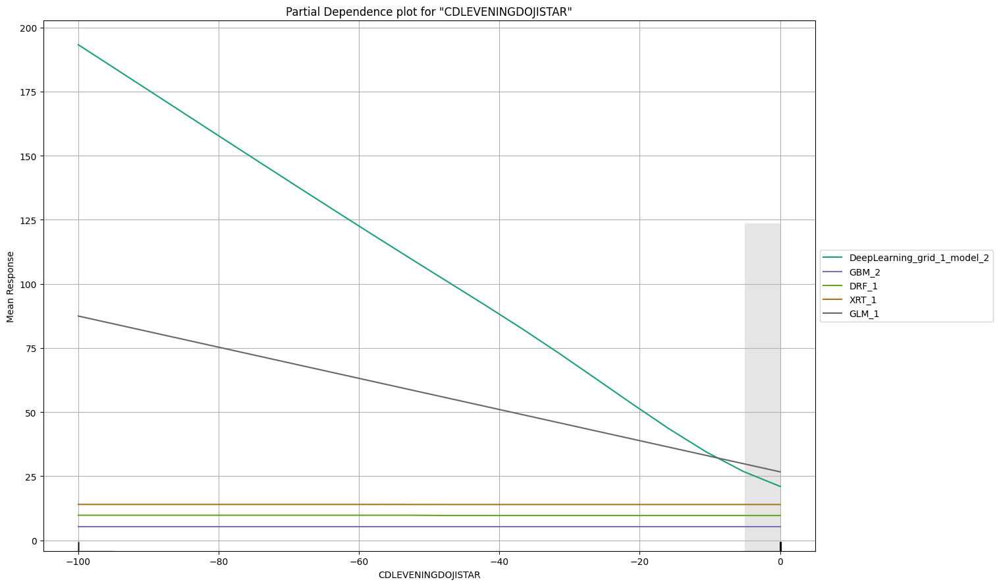

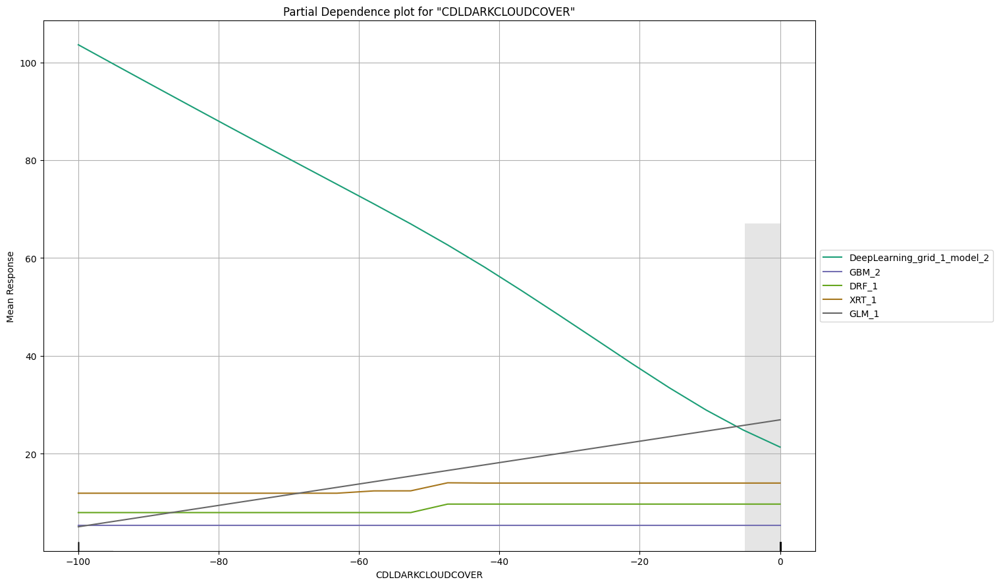

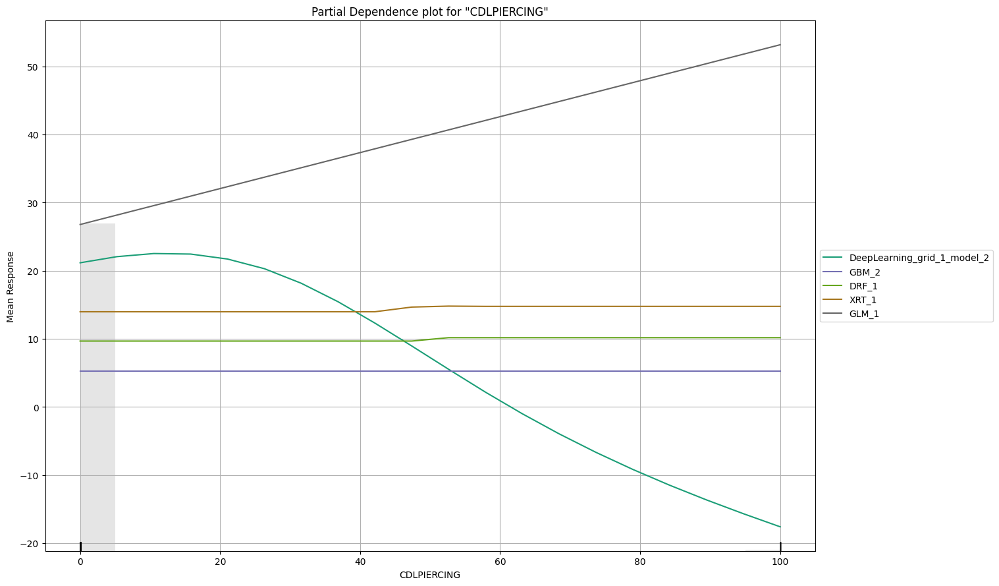

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

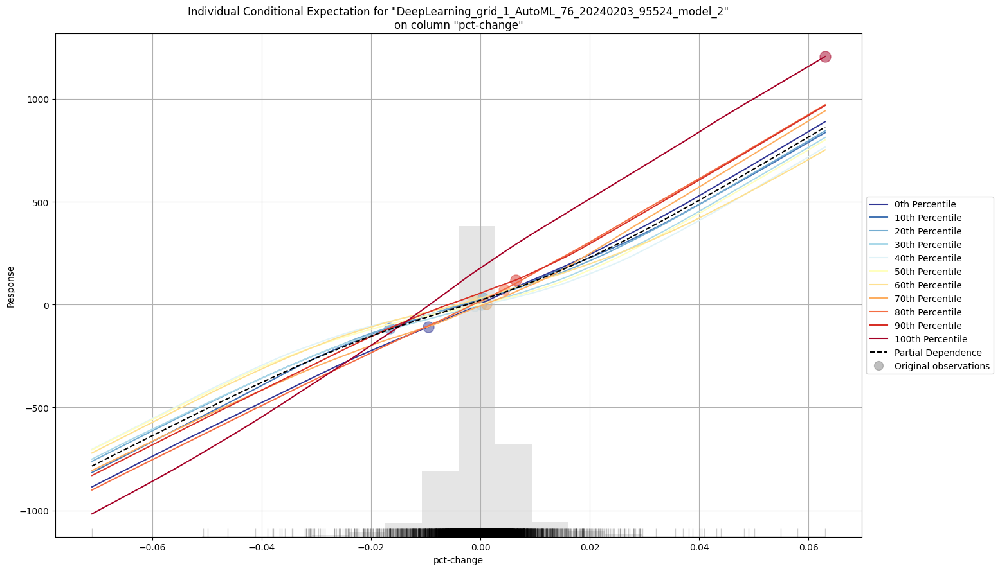

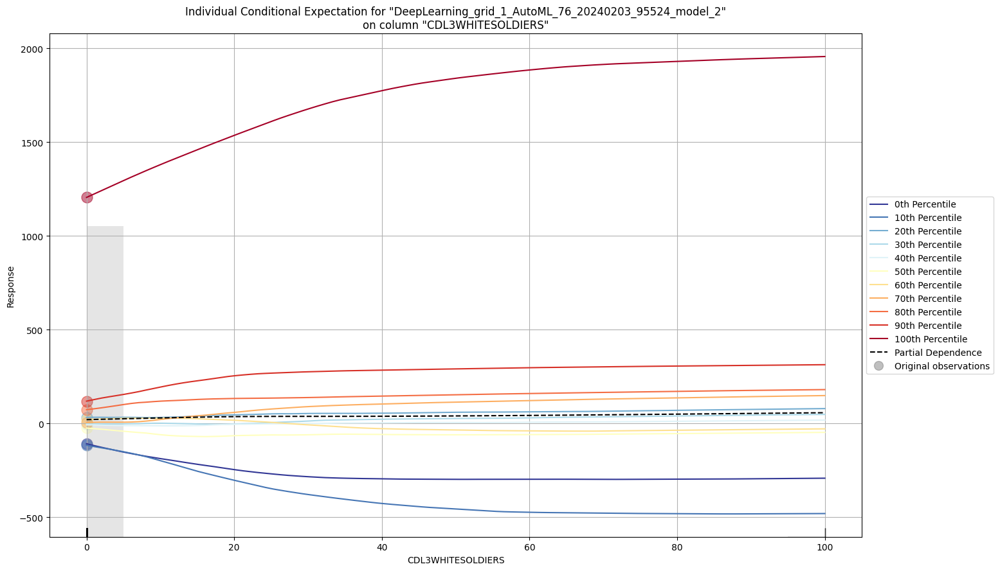

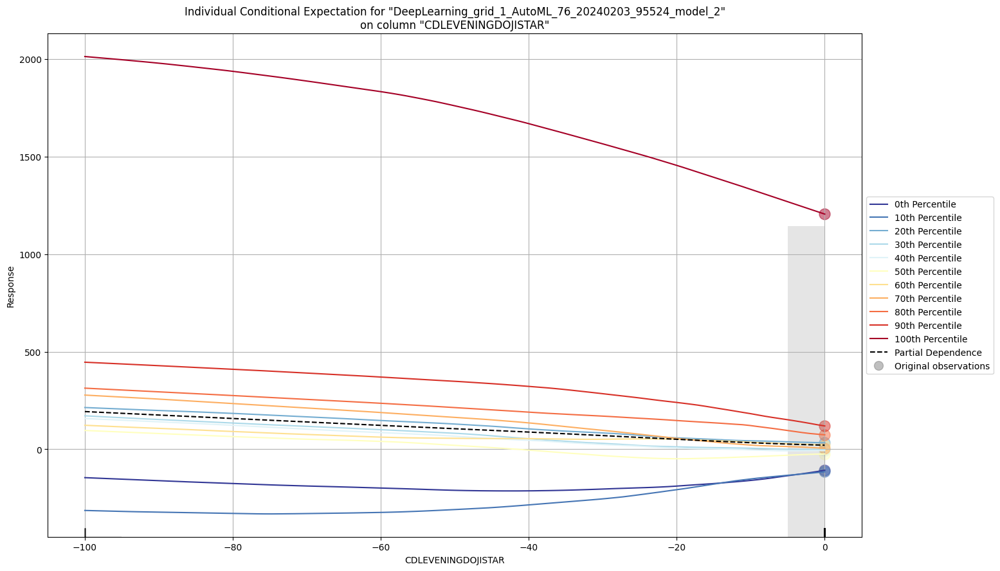

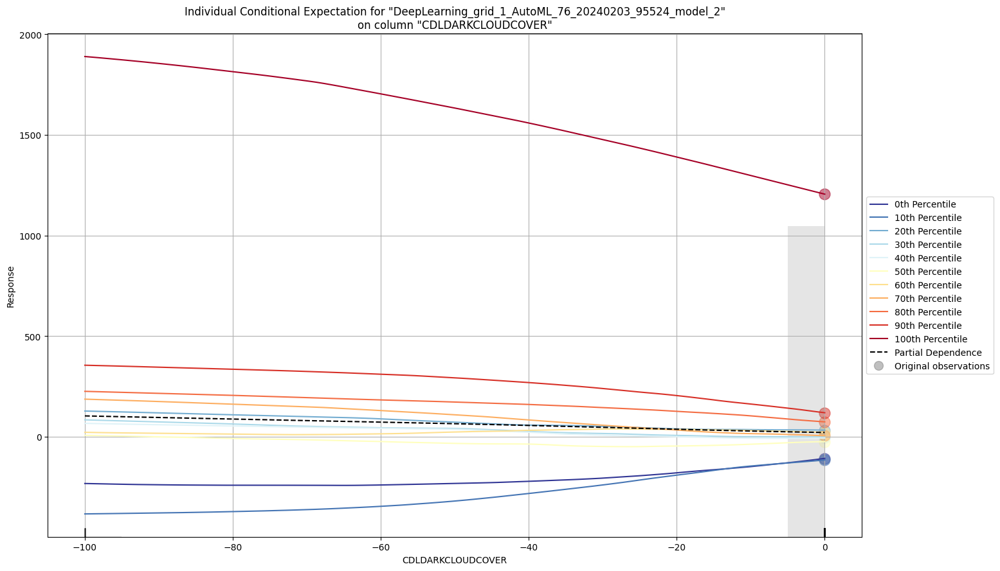

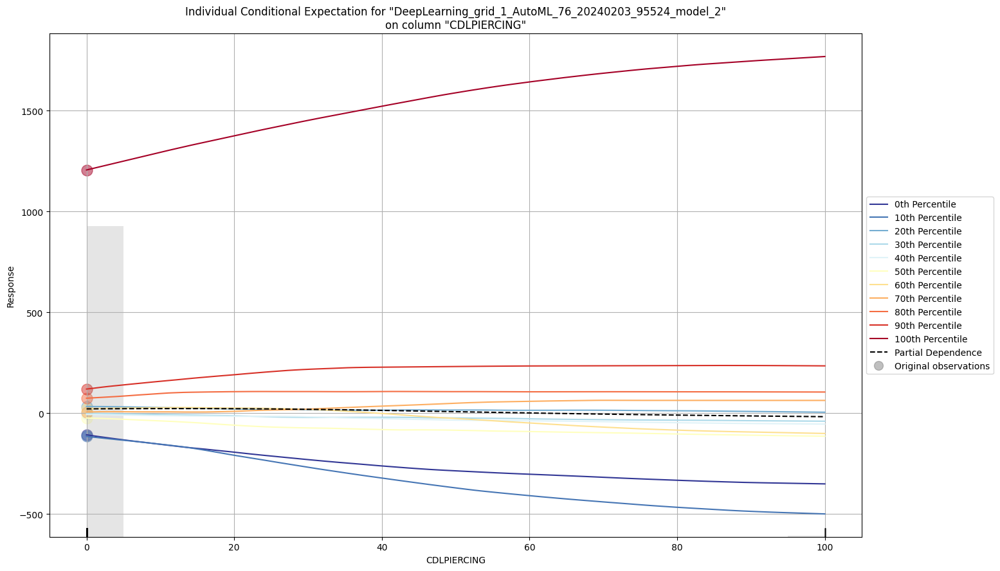



Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


/Users/dad/Library/Python/3.9/lib/python/site-packages/h2o/frame.py:1979: H2ODependencyWarning: converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above).
  warnings.warn("converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


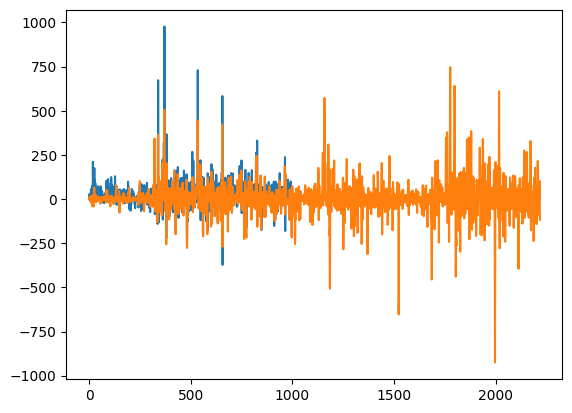

In [ ]:
print("1h Regressor model")

trained_model_1h_regressor = train_and_evaluate_model(X_1h_order1[0:20000], y_regression_1h_order1[0:20000], test_size=0.33)

# predict and compare to target of sma5 gradient on plot
preds = trained_model_1h_regressor.leader.predict(h2o.H2OFrame(X_1h_order1[20000:21000])).as_data_frame()
plt.plot(preds)
plt.plot(y_regression_1h_order1[20000:210000].reset_index(drop=True))
plt.show()

In [ ]:
import matplotlib.pyplot as plt
tested_indices = (20000, 21000)
y = y_regression_1h_order1[tested_indices[0]:tested_indices[1]].reset_index(drop=True)
df = df_1h_order1[tested_indices[0]:tested_indices[1]]

# Set the figure size to 12x8
plt.figure(figsize=(12, 8))

# Plot the predicted values
plt.plot(preds, label='Predicted')

# Plot the actual values
plt.plot(y, label='Actual')

# Add a legend
plt.legend()

# Show the plot
plt.show()

# Calculate the integral (cumulative sum) of preds
integral_preds = np.cumsum(preds)

# Calculate the integral (cumulative sum) of y_regression_15m_order2
integral_actual = np.cumsum(y.reset_index(drop=True))

# Create a time axis for the plot
time = np.arange(len(preds))

# Set the figure size to 12x8
plt.figure(figsize=(12, 8))

# Plot the integral of preds
plt.plot(time, integral_preds, label='Integral of Predicted')

# Plot the integral of y_regression_15m_order2
plt.plot(time, integral_actual, label='Integral of Actual')

# Add a legend
plt.legend()

# Show the plot
plt.show()

predicted_values = pd.DataFrame(index=preds.index, columns=['extrema'])
predicted_values['extrema'] = 'hold'

# Iterate over the DataFrame to find 'buy' and 'sell' signals
for i in range(1, len(preds)):
    if preds['predict'].iloc[i-1] < 0 and preds['predict'].iloc[i] >= 0:
        predicted_values.at[i, 'extrema'] = 'buy'
    elif preds['predict'].iloc[i-1] > 0 and preds['predict'].iloc[i] <= 0:
        predicted_values.at[i, 'extrema'] = 'sell'

actual_values = pd.DataFrame(index=y.index, columns=['extrema'])
actual_values['extrema'] = 'hold'
for i in range(1, len(y)):
    if y['gradient'].iloc[i-1] < 0 and y['gradient'].iloc[i] >= 0:
        actual_values.at[i, 'extrema'] = 'buy'
    elif y['gradient'].iloc[i-1] > 0 and y['gradient'].iloc[i] <= 0:
        actual_values.at[i, 'extrema'] = 'sell'


# test profitability
print("Analysis for predictions:")
analyze_trading_strategy(df, order=1, plot_flag=True, print_flag=True, use_predicted_values=True, predicted_values=predicted_values, predicted_value_range=tested_indices)

print("Anlalysis for target:")
analyze_trading_strategy(df, order=1, plot_flag=True, print_flag=True, use_predicted_values=True, predicted_values=actual_values, predicted_value_range=tested_indices)

NameError: name 'preds' is not defined

<Figure size 1200x800 with 0 Axes>

/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_9792/2729100022.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['&s-up_or_down_2h'] = np.where(df["close"].shift(-2) > (1+0.01)*df["close"], 'up', 'down')
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_9792/2729100022.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['&s-up_or_down_4h'] = np.where(df["close"].shift(-4) > (1+0.01)*df["close"], 'up', 'down')
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_9792/2729100022.py:8: Performance

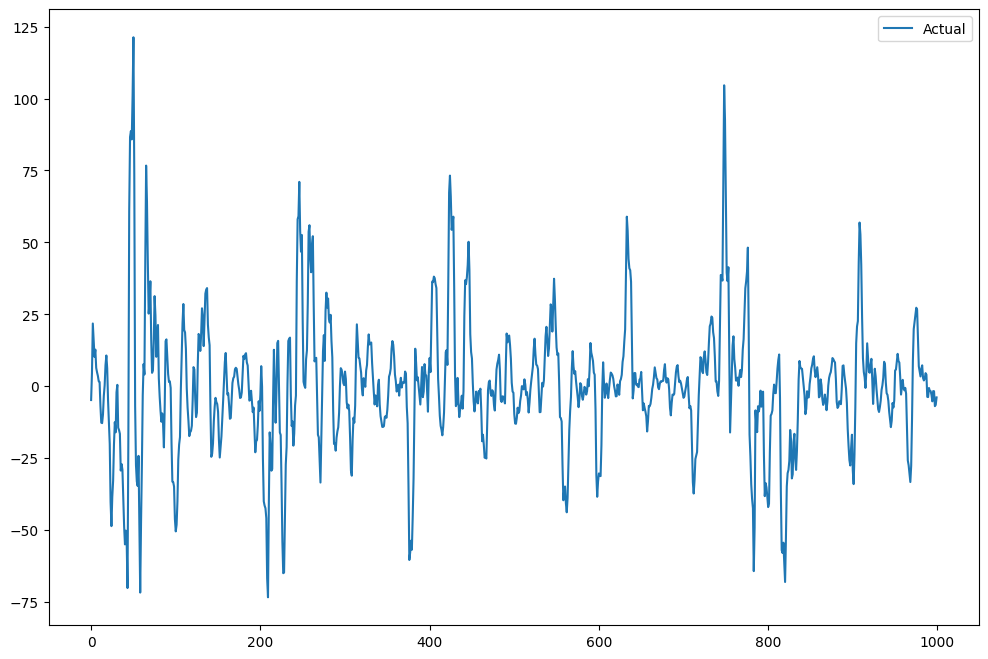

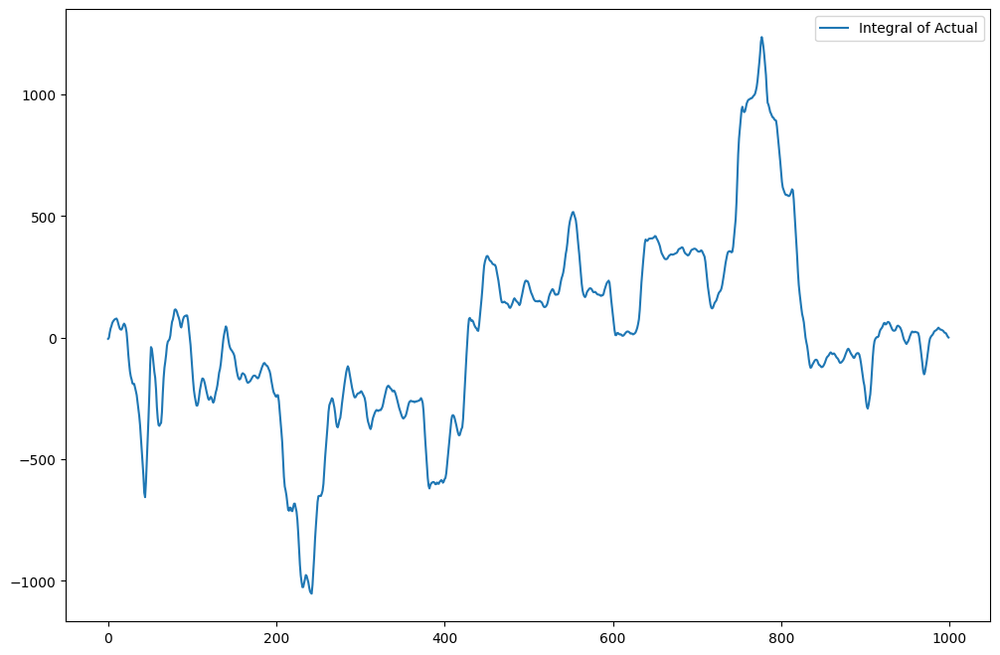

Anlalysis for target:
Buy signals: 75.0 Sell signals: 75.0 Candles: 1000


/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_9792/1919587025.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[(predicted_values['extrema'] == 'sell'), 'exit_max'] = 1
/var/folders/6t/25gxwxc96x72twpkb7_rjsh00000gn/T/ipykernel_9792/1919587025.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[(predicted_values['extrema'] == 'buy'), 'enter_min'] = 1


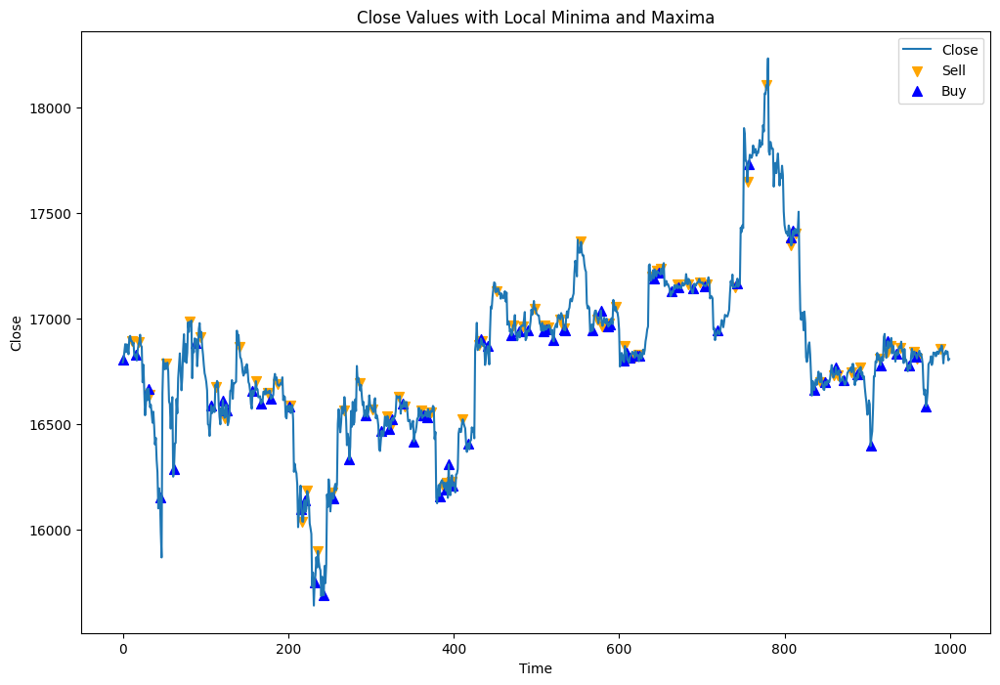

Ending Capital: 1018.6749513812626
Total Theoretical Profit: 18.674951381262645
Win Percentage: 53.333333333333336%
Max Drawdown: 2.607941065449495
Max Drawdown Percent: 0.2574115576175151
Total Trades: 75
Average Return: 0.45151806782173914
Average Return pct: 0.4472749298986867
Sharpe Ratio: 0.4298150194589017
Buy signals: 75.0 Sell signals: 75.0 Candles: 1000
Percent of candles with signal (buy or sell): 15.0%


(18.674951381262645, 15.0)

In [ ]:
import matplotlib.pyplot as plt
tested_indices = (20000, 21000)
order=7
X_1h_order1, y1_1h_order1, y2_1h_order1, y3_1h_order1, y4_1h_order1, y4_1h_order1_buy, y4_1h_order1_sell, y_regression_1h_order1, df_1h_order1 = populate_features(df_1h, order=order)
y = y_regression_1h_order1[tested_indices[0]:tested_indices[1]].reset_index(drop=True)
df = df_1h_order1[tested_indices[0]:tested_indices[1]]

# Set the figure size to 12x8
plt.figure(figsize=(12, 8))

# Plot the predicted values
# plt.plot(preds, label='Predicted')

# Plot the actual values
plt.plot(y, label='Actual')

# Add a legend
plt.legend()

# Show the plot
plt.show()

# Calculate the integral (cumulative sum) of preds
# integral_preds = np.cumsum(preds)

# Calculate the integral (cumulative sum) of y_regression_15m_order2
integral_actual = np.cumsum(y.reset_index(drop=True))

# Create a time axis for the plot
time = np.arange(len(y))

# Set the figure size to 12x8
plt.figure(figsize=(12, 8))

# Plot the integral of preds
# plt.plot(time, integral_preds, label='Integral of Predicted')

# Plot the integral of y_regression_15m_order2
plt.plot(time, integral_actual, label='Integral of Actual')

# Add a legend
plt.legend()

# Show the plot
plt.show()

# predicted_values = pd.DataFrame(index=preds.index, columns=['extrema'])
# predicted_values['extrema'] = 'hold'

# # Iterate over the DataFrame to find 'buy' and 'sell' signals
# for i in range(1, len(preds)):
#     if preds['predict'].iloc[i-1] < 0 and preds['predict'].iloc[i] >= 0:
#         predicted_values.at[i, 'extrema'] = 'buy'
#     elif preds['predict'].iloc[i-1] > 0 and preds['predict'].iloc[i] <= 0:
#         predicted_values.at[i, 'extrema'] = 'sell'

actual_values = pd.DataFrame(index=y.index, columns=['extrema'])
actual_values['extrema'] = 'hold'
for i in range(1, len(y)):
    if y['gradient'].iloc[i-1] < 0 and y['gradient'].iloc[i] >= 0:
        actual_values.at[i, 'extrema'] = 'buy'
    elif y['gradient'].iloc[i-1] > 0 and y['gradient'].iloc[i] <= 0:
        actual_values.at[i, 'extrema'] = 'sell'


# test profitability
# print("Analysis for predictions:")
# analyze_trading_strategy(df, order=1, plot_flag=True, print_flag=True, use_predicted_values=True, predicted_values=predicted_values, predicted_value_range=tested_indices)

print("Anlalysis for target:")
analyze_trading_strategy(df, order=1, plot_flag=True, print_flag=True, use_predicted_values=True, predicted_values=actual_values, predicted_value_range=tested_indices)

Gaussian Filter kernel 5 sigma 1
Gaussian Filter kernel 11 sigma 1
Gaussian Filter kernel 21 sigma 1
Gaussian Filter kernel 31 sigma 1
Gaussian Filter kernel 51 sigma 1


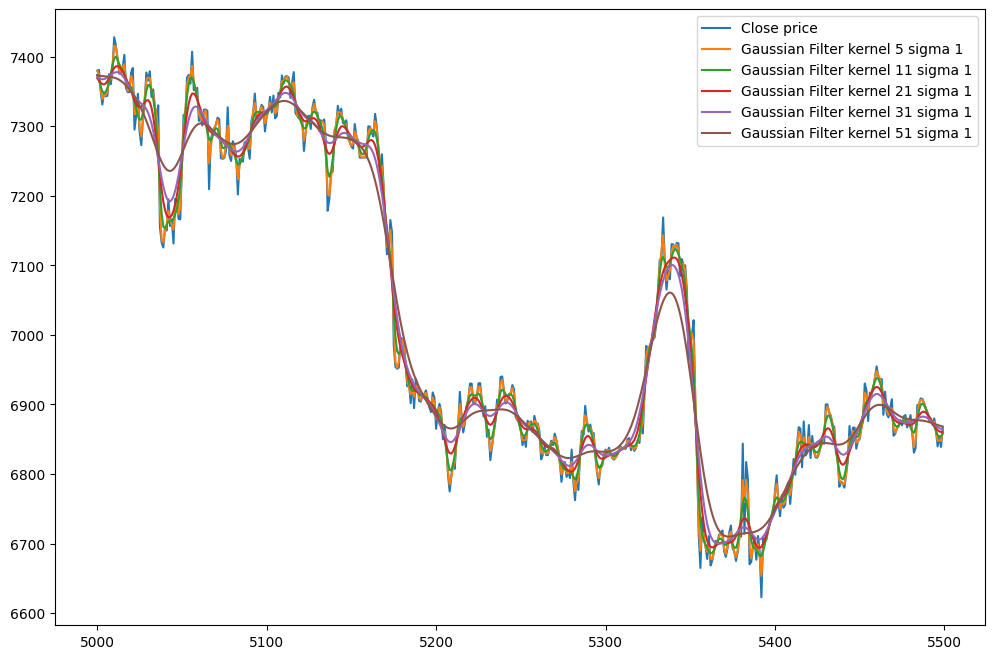

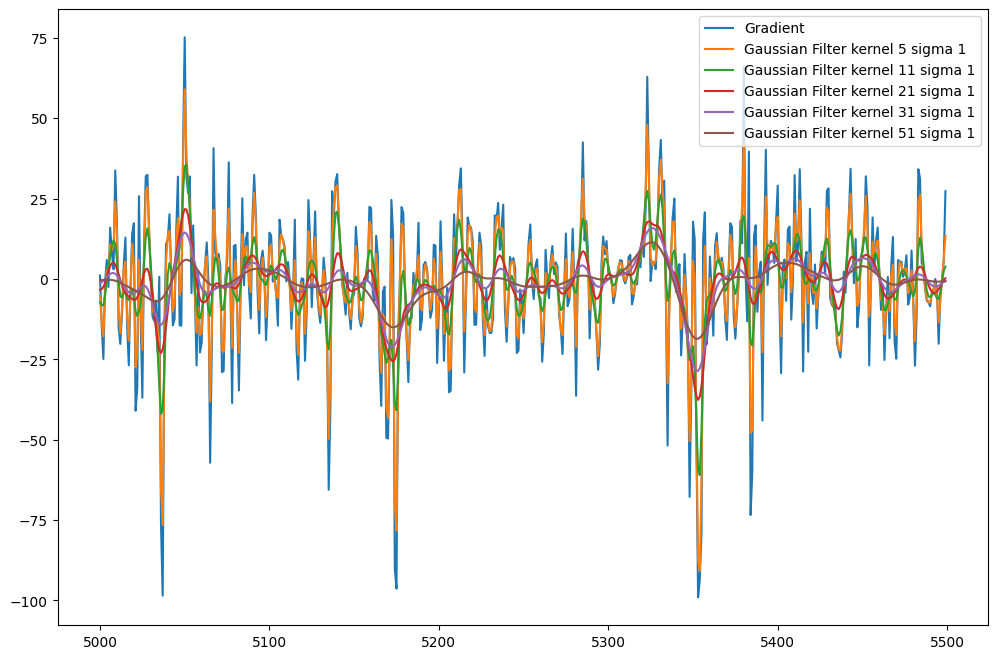

In [ ]:
# choosing gaussian filter properties
window = (5000, 5500)
df = df_15m.copy()
kernel_sizes = [5, 11, 21, 31, 51]
sigmas = [1, 1, 1, 1, 1, 1, 1]

def plot_gauss_filters(df, window, kernel_sizes, sigmas):
    closegausses = pd.DataFrame()
    gaussgrads = pd.DataFrame()
    for i in range(len(kernel_sizes)):
        colname = f"Gaussian Filter kernel {kernel_sizes[i]} sigma {sigmas[i]}"
        closegausses[colname] = apply_gaussian_filter(df[window[0]:window[1]], kernel_sizes[i], sigmas[i])
        gaussgrads[colname] = pd.Series(np.gradient(closegausses[colname]), index=df[window[0]:window[1]].index)
        print(colname)
        
    plt.figure(figsize=(12, 8))
    df['close'][window[0]:window[1]].plot(label='Close price')
    for col in closegausses.columns:
        closegausses[col].plot(label=col)
    plt.legend()
    plt.show()

    # calculate gradients of close and plot
    close_1hgrad = pd.Series(np.gradient(df['close'][window[0]:window[1]]), index=df.index[window[0]:window[1]])
    plt.figure(figsize=(12, 8))
    close_1hgrad.plot(label='Gradient')
    for col in gaussgrads.columns:
        gaussgrads[col].plot(label=col)
    plt.legend()
    plt.show()

plot_gauss_filters(df, window, kernel_sizes, sigmas)

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

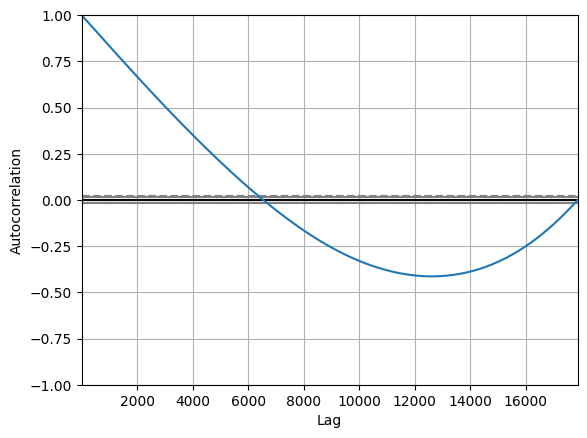

In [ ]:
from pandas.plotting import autocorrelation_plot

# Assume 'close_price' is your time series data
autocorrelation_plot(extrema_5m[0])

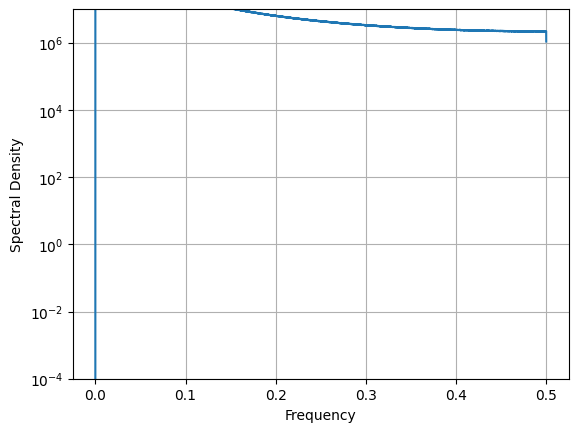

In [ ]:
from scipy.signal import periodogram
import matplotlib.pyplot as plt
from scipy.signal import argrelextrema
import numpy as np

extrema_5m = argrelextrema(df_5m['close'].values, np.greater, order=5)

# Use only the first element of the tuple returned by argrelextrema
frequencies, spectrum = periodogram(extrema_5m[0])

plt.semilogy(frequencies, spectrum)
plt.ylim([1e-4, 1e7])
plt.xlabel('Frequency')
plt.ylabel('Spectral Density')
plt.grid()
plt.show()

In [ ]:
# It seems there might have been an issue in the calculation of Gaussian weights. Let's review and correct it.
import numpy as np

def gaussian_weight(distance, sigma):
    """
    Calculate the Gaussian weight for a given distance from an extrema.
    
    :param distance: The distance from the extrema.
    :param sigma: Standard deviation of the Gaussian function.
    :return: Weight according to the Gaussian function.
    """
    return np.exp(-distance**2 / (2 * sigma**2))


# Corrected function to apply Gaussian weights to each point in the series
def apply_gaussian_weights_corrected(series, minima_indices, maxima_indices, sigma):
    weights = np.zeros_like(series)
    for i in range(len(series)):
        min_dist = np.inf
        max_dist = np.inf

        # Check distance to the nearest minima
        if len(minima_indices) > 0:
            min_dist = min(abs(i - min_idx) for min_idx in minima_indices)
        
        # Check distance to the nearest maxima
        if len(maxima_indices) > 0:
            max_dist = min(abs(i - max_idx) for max_idx in maxima_indices)
        
        # Assign Gaussian weights based on proximity to minima/maxima
        if min_dist < max_dist:  # Closer to a minima
            weights[i] = -gaussian_weight(min_dist, sigma)
        elif max_dist < min_dist:  # Closer to a maxima
            weights[i] = gaussian_weight(max_dist, sigma)
        
    return weights

# Re-apply Gaussian weights with corrected function
gaussian_weights_corrected = apply_gaussian_weights_corrected(series, minima_indices, maxima_indices, sigma)

# Plot the corrected Gaussian weights
plt.figure(figsize=(14, 4))
plt.plot(gaussian_weights_corrected, label='Corrected Gaussian Weights', color='orange')
plt.title('Corrected Gaussian Weights')
plt.legend()
plt.show()




# To smooth out the Gaussian weights more, we can increase the sigma value. A higher sigma will result in a wider Gaussian curve, 
# leading to smoother transitions in weights. Let's try with a larger sigma value.

# Increase sigma for smoother weights
sigma_larger = 5  # Increase sigma for smoother weights

# Re-apply Gaussian weights with larger sigma
gaussian_weights_smoothed = apply_gaussian_weights_corrected(series, minima_indices, maxima_indices, sigma_larger)

# Plot the smoothed Gaussian weights
plt.figure(figsize=(14, 4))
plt.plot(gaussian_weights_smoothed, label='Smoothed Gaussian Weights', color='blue')
plt.title('Smoothed Gaussian Weights with Larger Sigma')
plt.legend()
plt.show()